In [1]:
import numpy as np 
import pandas as pd 
import os
import glob
from netCDF4 import Dataset
from netCDF4 import num2date,date2num
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
import random
import time
import copy
import random
import errno

from datetime import datetime, timedelta
from cartopy import config
import cartopy.crs as ccrs
import cartopy.feature as cf
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature

import palettable

from eofs.standard import Eof
from eofs.examples import example_data_path


from keras.callbacks import ReduceLROnPlateau
from keras.layers import Input, Dense, BatchNormalization, Dropout
import keras
from keras.utils import plot_model
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

from keras.models import Model, save_model, load_model
from keras.layers import Dense, Activation, Conv2D,Conv2DTranspose, Input, AveragePooling2D, MaxPooling2D, Flatten, LeakyReLU, Dropout,concatenate
from keras.layers import SpatialDropout2D
from keras.optimizers import SGD, Adam
from keras.regularizers import l2
import keras.backend as K
import keras_metrics


from sklearn.datasets import fetch_mldata
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity as Cos_Sim
from sklearn.metrics import accuracy_score


Using TensorFlow backend.
/home/wchapman/anaconda3/envs/MJOenso/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/wchapman/anaconda3/envs/MJOenso/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/wchapman/anaconda3/envs/MJOenso/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/wchap

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 500)

# Hit GO once: 

In [4]:
start_timeALL = time.time()

#Perform the Moving Average. 
#remove the seasonal cycle 4 harmonics 
def removeSC(TS):
    O1 = 1 / 365.25; #for daily data --- (365 days in year)
    T = np.array(range(len(TS))) ### index of days
    # A = [mean, linear fit, harmonic 1 , harmonic 2, harmonic 3, harmonic 4]
    A = np.array([np.ones(TS.shape[0]),T, np.cos(2*np.pi*T*O1),np.sin(2*np.pi*T*O1),
                 np.cos(2*np.pi*T*O1*2),np.sin(2*np.pi*T*O1*2),
                 np.cos(2*np.pi*T*O1*4),np.sin(2*np.pi*T*O1*4),
                 np.cos(2*np.pi*T*O1*8),np.sin(2*np.pi*T*O1*8)])
    A = np.transpose(A)
    #solve for the weights (inverse L2norm problem:)
    solu = np.matmul(np.matmul(np.linalg.inv(np.matmul(np.transpose(A),A)),np.transpose(A)),TS)
    model = np.matmul(A,solu) # linear model of these variables. 
    return model, solu


LMf = '/home/wchapman/S2S/T2mENSOmjo/MERRA2_101.constants_2d_asm_Nx.00000000.nc4.nc'
LM = Dataset(LMf)
latLM = LM.variables['lat'][:] 
lonLM = LM.variables['lon'][:]
Lands =  np.squeeze(LM.variables['FRLAND'][:])


#############################################################################################################
#############################################################################################################
#############################################################################################################

#for lagging features: 

def buildLaggedFeaturesBack(s,lag=2,dropna=True):
    '''
    Builds a new DataFrame to facilitate regressing over all possible lagged features
    '''
    if type(s) is pd.DataFrame:
        new_dict={}
        for col_name in s:
            new_dict[col_name]=s[col_name]
            # create lagged Series
            for l in range(1,lag+1):
                new_dict['%s_lag%d' %(col_name,l)]=s[col_name].shift(l)
        res=pd.DataFrame(new_dict,index=s.index)
    else:
        print('Only works for DataFrame or Series')
        return None
    if dropna:
        return res.dropna()
    else:
        return res 
    
def buildLaggedFeaturesFor(s,col_name,lag=2,dropna=True):
    '''
    Builds a new DataFrame to facilitate regressing over all possible lagged features
    '''
   
    if type(s) is pd.DataFrame:
        new_dict={}
        for col_name2 in s:
            new_dict[col_name2]=s[col_name2]
        
        # create lagged Series
        new_dict[col_name2]=s[col_name2]
        # create lagged Series
        new_dict['%s_for%d' %(col_name,lag)]=s[col_name].shift(-lag)
        res=pd.DataFrame(new_dict,index=s.index)
           
    else:
        print('Only works for DataFrame')
        return None
    if dropna:
        return res.dropna()
    else:
        return res

def buildLaggedFeaturesBack1(s,col_name,lag=2,dropna=True):
    '''
    Builds a new DataFrame to facilitate regressing over all possible lagged features
    '''
   
    if type(s) is pd.DataFrame:
        new_dict={}
        for col_name2 in s:
            new_dict[col_name2]=s[col_name2]
        
        # create lagged Series
        new_dict[col_name2]=s[col_name2]
        # create lagged Series
        new_dict['%s_lag%d' %(col_name,lag)]=s[col_name].shift(lag)
        res=pd.DataFrame(new_dict,index=s.index)
           
    else:
        print('Only works for DataFrame')
        return None
    if dropna:
        return res.dropna()
    else:
        return res

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('load land files')
MerraDirectory = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/All/'
train_file_names=sorted(os.listdir(MerraDirectory))

f = Dataset('/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/All/' + train_file_names[0])
lat = f.variables['lat'][:] 
lon = f.variables['lon'][:]
T2mO  = f.variables['T2M'][:]

latW = [24,50]
lonW = [-130,-92]

# Get Land Mask and variables set to line up.
latST = np.argmin(np.abs(latLM - latW[0])).astype(int)
latEN = np.argmin(np.abs(latLM - latW[-1])).astype(int)
lonST = np.argmin(np.abs(lonLM - lonW[0])).astype(int)
lonEN = np.argmin(np.abs(lonLM - lonW[-1])).astype(int)

Lands = Lands[latST:latEN+1,lonST:lonEN+1]
Lands[Lands>0.05] = 1
Lands[Lands<0.001] = np.nan

latLM = latLM[latST:latEN+1]
lonLM = lonLM[lonST:lonEN+1]

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('Load Temperature files')

T2mfilename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/T2m_NorthAmerica_1980_2019.nc'
f = Dataset(T2mfilename)
times = f.variables['time']
dates = num2date(times[:].data,units=times.units,calendar=times.calendar)
yearz =[]
dayz = []
monthz =[]
for jj in range(len(times)):
    yearz = np.append(yearz, dates[jj].year)
    dayz = np.append(dayz, dates[jj].day)
    monthz = np.append(monthz, dates[jj].month)
data = {'model time':times[:].data,'year':yearz,'month':monthz, 'day':dayz}
df = pd.DataFrame(data) 
df

latT = f.variables['lat'][:]
lonT = f.variables['lon'][:]


# Get Land Mask and variables set to line up.
latST = np.argmin(np.abs(latT - latW[0])).astype(int)
latEN = np.argmin(np.abs(latT - latW[-1])).astype(int)
lonST = np.argmin(np.abs(lonT - lonW[0])).astype(int)
lonEN = np.argmin(np.abs(lonT - lonW[-1])).astype(int)


T2m = f.variables['T2M'][:,latST:latEN+1,lonST:lonEN+1]
latT = f.variables['lat'][latST:latEN+1]
lonT = f.variables['lon'][lonST:lonEN+1]

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('Load ONI files')

OniFil = '/data/downloaded/Forecasts/ECMWF/S2S_ML/ONI.txt'
dfONI = pd.read_csv(OniFil, delim_whitespace=True, 
                       names=("year","1", "2","3","4","5","6","7","8","9","10","11","12"))
dfONI

ONI = np.zeros([len(df),])    

for ii in range(1980,2020):
    for jj in range(1,13):
        indic = np.array(df.loc[(df['year'] == ii) & (df['month'] ==jj)].index.tolist())
        if indic.size == 0: 
            continue            
        ONI[indic] = dfONI.loc[(dfONI["year"] == ii)].iloc[:,jj]

df2 = pd.DataFrame({'ONI': ONI})

df = df.join(df2)

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('Load QBO files')

QBOFil = '/data/downloaded/Forecasts/ECMWF/S2S_ML/QBO.txt'
dfQBO = pd.read_csv(QBOFil, delim_whitespace=True, 
                       names=("year","1", "2","3","4","5","6","7","8","9","10","11","12"))
dfQBO

QBO = np.zeros([len(df),])    

for ii in range(1980,2020):
    for jj in range(1,13):
        indic = np.array(df.loc[(df['year'] == ii) & (df['month'] ==jj)].index.tolist())
        if indic.size == 0: 
            continue            
        QBO[indic] = dfQBO.loc[(dfQBO["year"] == ii)].iloc[:,jj]

df2 = pd.DataFrame({'QBO': QBO})

df = df.join(df2)

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('loading GPH')

GPHfilename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/GPH250_NorthernHemi_1deg_1980_2019.nc'
f = Dataset(GPHfilename)
latGPH = f.variables['lat'][:] 
lonGPH = f.variables['lon'][:]



latGPHE = [0,75]
lonGPHE = [50,180]

latGPHW = [0,75]
lonGPHW = [-180,-15]

latSTe = np.argmin(np.abs(latGPH - latGPHE[0])).astype(int)
latENe = np.argmin(np.abs(latGPH - latGPHE[-1])).astype(int)
lonSTe = np.argmin(np.abs(lonGPH - lonGPHE[0])).astype(int)
lonENe = np.argmin(np.abs(lonGPH - lonGPHE[-1])).astype(int)

latSTw = np.argmin(np.abs(latGPH - latGPHW[0])).astype(int)
latENw = np.argmin(np.abs(latGPH - latGPHW[-1])).astype(int)
lonSTw = np.argmin(np.abs(lonGPH - lonGPHW[0])).astype(int)
lonENw = np.argmin(np.abs(lonGPH - lonGPHW[-1])).astype(int)

GPHe = f.variables['GPH250'][:,latSTe:latENe+1,lonSTe:lonENe+1]
GPHw = f.variables['GPH250'][:,latSTw:latENw+1,lonSTw:lonENw+1]
GPH250 = np.concatenate((GPHe,GPHw),axis=2)
latGPH = latGPH[latSTe:latENe+1]
lonT1 = lonGPH[lonSTe:lonENe+1]-180
lonT2 = lonGPH[lonSTw:lonENw+1]+180
lonGPH = np.concatenate((lonT1,lonT2))

times = f.variables['time']
dates = num2date(times[:].data,units=times.units,calendar=times.calendar)

yearzGPH =[]
dayzGPH = []
monthzGPH =[]



for jj in range(len(times)):
    yearzGPH = np.append(yearzGPH, dates[jj].year)
    dayzGPH = np.append(dayzGPH, dates[jj].day)
    monthzGPH = np.append(monthzGPH, dates[jj].month)
data = {'model time':times[:].data,'year':yearzGPH,'month':monthzGPH, 'day':dayzGPH}
dfGPH = pd.DataFrame(data) 


#############################################################################################################
#############################################################################################################
#############################################################################################################
print('loading MJO')

MJOfile = '/data/downloaded/Forecasts/ECMWF/S2S_ML/RMM_MJO_1974_2019.txt'
dfMJO = pd.read_csv(MJOfile, delim_whitespace=True, 
                   dtype = {"year": np.float64, "month": np.int32,"day": np.int32,"RMM1":np.int32,"RMM2":np.int32,
                            "phase": np.int32, "amplitude": np.int32})

dfMJO = dfMJO.rename(index=str, columns={"year,": "year", "month,": "month","day,": "day","RMM1,": "RMM1",
                                        "RMM2,": "RMM2","phase,": "phase","amplitude.": "amplitude"})


dfMJO = dfMJO[['year','month','day','phase','amplitude','RMM1','RMM2']]

dfMJO = dfMJO.iloc[:,0:7]
dfMJO.head()
dfA = pd.merge(left=df,right=dfMJO, how='left', left_on=['year','month','day'], right_on=['year','month','day'])

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('loading SeaICE')

SeaicefileN = '/data/downloaded/Forecasts/ECMWF/S2S_ML/N_seaice_extent_daily_v3.0.csv'
dfSiceN = pd.read_csv(SeaicefileN,header=1,sep=',',
                   dtype = {"Year":np.float64, "Month": np.float64,"Day": np.float64,"Extent":np.int32})

dfSiceN = dfSiceN.iloc[:,0:4]



dfSiceN = dfSiceN.rename(index=str, columns={"Year": "year", " Month": "month"," Day": "day","     Extent": "Extent_N"})



dfAA = pd.merge(left=dfA,right=dfSiceN, how='left', left_on=['year','month','day'], right_on=['year','month','day'])

SeaicefileS = '/data/downloaded/Forecasts/ECMWF/S2S_ML/S_seaice_extent_daily_v3.0.csv'
dfSiceS = pd.read_csv(SeaicefileS,header=1,sep=',',
                   dtype = {"Year":np.float64, "Month": np.float64,"Day": np.float64,"Extent":np.int32})

dfSiceS = dfSiceS.iloc[:,0:4]

dfSiceS = dfSiceS.rename(index=str, columns={"Year": "year", " Month": "month"," Day": "day","     Extent" : "Extent_S"})

N=14
dfAAA = pd.merge(left=dfAA,right=dfSiceS, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfAAA  = dfAAA.interpolate(method='polynomial', order=2)
dfAAA

[ms,ss] = removeSC(np.array(dfAAA['Extent_N']))
dfAAA['Extent_N'] = dfAAA['Extent_N'] - ms;
dfAAA['Extent_N'] = pd.Series(dfAAA['Extent_N']).rolling(window=N,center=True,min_periods=1).mean().values


[ms,ss] = removeSC(np.array(dfAAA['Extent_S']))
dfAAA['Extent_S'] = dfAAA['Extent_S'] - ms;
dfAAA['Extent_S'] = pd.Series(dfAAA['Extent_S']).rolling(window=N,center=True,min_periods=1).mean().values

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('Tropics')

SSTfilename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/SST_global_onedeg_1979_2019.nc'
f = Dataset(SSTfilename)
latTrop = f.variables['lat'][:] 
lonTrop = f.variables['lon'][:]

latTropE = [-10,10]
lonTropE = [50,180]

latTropW = [-10,10]
lonTropW = [-180,-82]

latSTe = np.argmin(np.abs(latTrop - latTropE[0])).astype(int)
latENe = np.argmin(np.abs(latTrop - latTropE[-1])).astype(int)
lonSTe = np.argmin(np.abs(lonTrop - lonTropE[0])).astype(int)
lonENe = np.argmin(np.abs(lonTrop - lonTropE[-1])).astype(int)

latSTw = np.argmin(np.abs(latTrop - latTropW[0])).astype(int)
latENw = np.argmin(np.abs(latTrop - latTropW[-1])).astype(int)
lonSTw = np.argmin(np.abs(lonTrop - lonTropW[0])).astype(int)
lonENw = np.argmin(np.abs(lonTrop - lonTropW[-1])).astype(int)

SSTe = f.variables['SST'][:,latSTe:latENe+1,lonSTe:lonENe+1]
SSTw = f.variables['SST'][:,latSTw:latENw+1,lonSTw:lonENw+1]
SSTtrop = np.concatenate((SSTe,SSTw),axis=2)
latTrop = latTrop[latSTe:latENe+1]
lonT1 = lonTrop[lonSTe:lonENe+1]-180
lonT2 = lonTrop[lonSTw:lonENw+1]+180



lonTrop = np.concatenate((lonT1,lonT2))

times = f.variables['time']
dates = num2date(times[:].data,units=times.units,calendar=times.calendar)
yearzSST =[]
dayzSST = []
monthzSST =[]



for jj in range(len(times)):
    yearzSST = np.append(yearzSST, dates[jj].year)
    dayzSST = np.append(dayzSST, dates[jj].day)
    monthzSST = np.append(monthzSST, dates[jj].month)
data = {'model time':times[:].data,'year':yearzSST,'month':monthzSST, 'day':dayzSST}
dfSST = pd.DataFrame(data) 

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('North Pacific')

SSTfilename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/SST_global_onedeg_1979_2019.nc'
f = Dataset(SSTfilename)

latTropn = f.variables['lat'][:] 
lonTropn = f.variables['lon'][:]

latTropE = [-20,65]
lonTropE = [95,180]

latTropW = [-20,65]
lonTropW = [-180,-90]

latSTe = np.argmin(np.abs(latTropn - latTropE[0])).astype(int)
latENe = np.argmin(np.abs(latTropn - latTropE[-1])).astype(int)
lonSTe = np.argmin(np.abs(lonTropn - lonTropE[0])).astype(int)
lonENe = np.argmin(np.abs(lonTropn - lonTropE[-1])).astype(int)

latSTw = np.argmin(np.abs(latTropn - latTropW[0])).astype(int)
latENw = np.argmin(np.abs(latTropn - latTropW[-1])).astype(int)
lonSTw = np.argmin(np.abs(lonTropn - lonTropW[0])).astype(int)
lonENw = np.argmin(np.abs(lonTropn - lonTropW[-1])).astype(int)

SSTe = f.variables['SST'][:,latSTe:latENe+1,lonSTe:lonENe+1]
SSTw = f.variables['SST'][:,latSTw:latENw+1,lonSTw:lonENw+1]
SSTnp = np.concatenate((SSTe,SSTw),axis=2)

latNP = latTropn[latSTe:latENe+1]
lonT1 = lonTropn[lonSTe:lonENe+1]-180
lonT2 = lonTropn[lonSTw:lonENw+1]+180

lonNP = np.concatenate((lonT1,lonT2))

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('Make Climatology T2m GPH SSTnp SST trop')

print(T2m.shape)
print(GPH250.shape)
print(SSTnp.shape)
print(SSTtrop.shape)
print(dfAAA.shape)
print(dfSST.shape)


#here we go. 
#reserve testing data: 

N = 14 #2 week averages
# Month Day climatology 1981-2010: 
dayClimo=[]
monClimo=[]

T2mClimo = np.zeros([366,T2m.shape[1],T2m.shape[2]])
T2m_MeanAnom = np.zeros(T2m.shape)


count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(df.loc[(df['month'] == ii) & (df['day'] ==jj)& (df['year']<2010)].index.tolist())
        indicT2m = np.array(df.loc[(df['month'] == ii) & (df['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        T2mClimo[count,:,:]= np.nanmean(T2m[indicMONDAY,:,:],axis=0)
        T2m_MeanAnom[indicT2m,:,:] = T2m[indicT2m,:,:] - T2mClimo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 

## Demean and Detrend
for ii in range(T2m_MeanAnom.shape[1]):
    if ii % 30 == 0:
        print("latitude #:", ii,"of:",T2m_MeanAnom.shape[1])
    for jj in range(T2m_MeanAnom.shape[2]):
        #now do 14day running mean
        T2m_MeanAnom[:,ii,jj] = pd.Series(T2m_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values      



##########################################################################
dayClimo=[]
monClimo=[]

SSTtropClimo = np.zeros([366,SSTtrop.shape[1],SSTtrop.shape[2]])
SSTtrop_MeanAnom = np.zeros(SSTtrop.shape)


count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(dfSST.loc[(dfSST['month'] == ii) & (dfSST['day'] ==jj)& (dfSST['year']<2010)].index.tolist())
        indicSST = np.array(dfSST.loc[(dfSST['month'] == ii) & (dfSST['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        SSTtropClimo[count,:,:]= np.nanmean(SSTtrop[indicMONDAY,:,:],axis=0)
        SSTtrop_MeanAnom[indicSST,:,:] = SSTtrop[indicSST,:,:] - SSTtropClimo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 

## Demean and Detrend
for ii in range(SSTtrop_MeanAnom.shape[1]):
    if ii % 10 == 0:
        print("latitude #:", ii,"of:",SSTtrop_MeanAnom.shape[1])
    for jj in range(SSTtrop_MeanAnom.shape[2]):
        #now do 14day running mean
        SSTtrop_MeanAnom[:,ii,jj] = pd.Series(SSTtrop_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values 

##########################################################################
dayClimo=[]
monClimo=[]

SSTnpClimo = np.zeros([366,SSTnp.shape[1],SSTnp.shape[2]])
SSTnp_MeanAnom = np.zeros(SSTnp.shape)

count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(dfSST.loc[(dfSST['month'] == ii) & (dfSST['day'] ==jj)& (dfSST['year']<2010)].index.tolist())
        indicSST = np.array(dfSST.loc[(dfSST['month'] == ii) & (dfSST['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        SSTnpClimo[count,:,:]= np.nanmean(SSTnp[indicMONDAY,:,:],axis=0)
        SSTnp_MeanAnom[indicSST,:,:] = SSTnp[indicSST,:,:] - SSTnpClimo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 

## Demean and Detrend
for ii in range(SSTnp_MeanAnom.shape[1]):
    if ii % 10 == 0:
        print("latitude #:", ii,"of:",SSTnp_MeanAnom.shape[1])
    for jj in range(SSTnp_MeanAnom.shape[2]):
        #now do 14day running mean
        SSTnp_MeanAnom[:,ii,jj] = pd.Series(SSTnp_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values 

##########################################################################
lonGPH,latGPH,GPH250

dayClimo=[]
monClimo=[]

GPH250Climo = np.zeros([366,GPH250.shape[1],GPH250.shape[2]])
GPH250_MeanAnom = np.zeros(GPH250.shape)

count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(dfGPH.loc[(dfGPH['month'] == ii) & (dfGPH['day'] ==jj)& (dfGPH['year']<2010)].index.tolist())
        indicGPH = np.array(dfGPH.loc[(dfGPH['month'] == ii) & (dfGPH['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        GPH250Climo[count,:,:]= np.nanmean(GPH250[indicMONDAY,:,:],axis=0)
        GPH250_MeanAnom[indicGPH,:,:] = GPH250[indicGPH,:,:] - GPH250Climo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 
print('Do Geopotential Height')
## Demean and Detrend
for ii in range(GPH250_MeanAnom.shape[1]):
    if ii % 10 == 0:
        print("latitude #:", ii,"of:",GPH250_MeanAnom.shape[1])
    for jj in range(SSTnp_MeanAnom.shape[2]):
        #now do 14day running mean
        GPH250_MeanAnom[:,ii,jj] = pd.Series(GPH250_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values 

#############################################################################################################
#############################################################################################################
#############################################################################################################
print('Get PC loadings')
indicSST1981 = np.array(dfSST.loc[(dfSST['month'] == 1) & (dfSST['day'] == 1) 
                                       &(dfSST['year'] == 1981)].index.tolist())

indicT2m1981 = np.array(df.loc[(df['month'] == 1) & (df['day'] == 1) 
                                       &(df['year'] == 1981)].index.tolist())


indicSST2010 = np.array(dfSST.loc[(dfSST['month'] == 12) & (dfSST['day'] == 31) 
                                       &(dfSST['year'] == 2010)].index.tolist())

indicT2m2010 = np.array(df.loc[(df['month'] == 12) & (df['day'] == 31) 
                                       &(df['year'] == 2010)].index.tolist())

# Create an EOF solver to do the EOF analysis. Square-root of cosine of
# latitude weights are applied before the computation of EOFs.
print('EOF SST tropics start:')
print('lat:',latTrop.shape)
print('lon:',lonTrop.shape)
print('SST:',SSTtrop_MeanAnom.shape)
coslat = np.cos(np.deg2rad(latTrop))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solverTROP = Eof(SSTtrop_MeanAnom[indicSST1981[0]:indicSST2010[0],:,:],weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')


print('EOF SST NP start:')
coslat = np.cos(np.deg2rad(latNP))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solverNP = Eof(SSTnp_MeanAnom[indicSST1981[0]:indicSST2010[0],:,:],weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')


print('EOF T2m start:')
coslat = np.cos(np.deg2rad(latT))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solverT2m = Eof(T2m_MeanAnom[indicT2m1981[0]:indicT2m2010[0],:,:],weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')

print('EOF GPH250 start:')
coslat = np.cos(np.deg2rad(latGPH))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solverGPH250 = Eof(GPH250_MeanAnom[indicT2m1981[0]:indicT2m2010[0],:,:],weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')


#############################################################################################################
#############################################################################################################
#############################################################################################################
print('Zip it all together:')

# These need to all print to proceed _
dfT2m = dfAAA

print(dfAAA.shape)
print(dfSST.shape)
print(T2m_MeanAnom.shape)
print(SSTtrop_MeanAnom.shape)
print(SSTnp_MeanAnom.shape)
print(solverNP)
print(solverTROP)
print(solverT2m)

#here we go. 
#reserve testing data: 

testingyear = 2018
N = 14 #2 week averages

indicTestingT2m = np.array(dfAAA.loc[(dfAAA['year']==testingyear)].index.tolist())
indicTrainingT2m = np.array(dfAAA.loc[(dfAAA['year']!=testingyear)].index.tolist())

indicTestingSST = np.array(dfSST.loc[(dfSST['year']==testingyear)].index.tolist())
indicTrainingSST = np.array(dfSST.loc[(dfSST['year']!=testingyear)].index.tolist())

T2m_Seat = np.squeeze(T2m_MeanAnom[:,46,16])

print('Projecting PCs')
pcTrop = solverTROP.projectField(SSTtrop_MeanAnom,neofs=5,eofscaling=1)  # get the psuedo pcs from the testing data. 
pcNP= solverNP.projectField(SSTnp_MeanAnom,neofs=5,eofscaling=1)  # get the psuedo pcs from the testing data. 
pcT2m = solverT2m.projectField(T2m_MeanAnom,neofs=5,eofscaling=1)  # get the psuedo pcs from the testing data. 
pcGPH250= solverGPH250.projectField(GPH250_MeanAnom,neofs=5,eofscaling=1)  # get the psuedo pcs from the testing data. 

print('Done Projecting PCs')

##########################################################################
### MERGE all of the data frames to make testing and training sets.   
##########################################################################

# merge all df for sst and t2m
print('merging data frames')

dataPCS = {'PC1np':pcNP[:,0],'PC2np':pcNP[:,1], 'PC3np':pcNP[:,2],'PC4np':pcNP[:,3],'PC5np':pcNP[:,4]}
dfPCSNP = pd.DataFrame(dataPCS) 
dfPCSNP
dfPCSNP = dfPCSNP.join(dfSST['year'])
dfPCSNP = dfPCSNP.join(dfSST['month'])
dfPCSNP = dfPCSNP.join(dfSST['day'])
dfPCSNP


dataPCS = {'PC1trop':pcTrop[:,0],'PC2trop':pcTrop[:,1], 'PC3trop':pcTrop[:,2],'PC4trop':pcTrop[:,3],'PC5trop':pcTrop[:,4]}
dfPCStrop = pd.DataFrame(dataPCS) 
dfPCStrop
dfPCStrop = dfPCStrop.join(dfSST['year'])
dfPCStrop = dfPCStrop.join(dfSST['month'])
dfPCStrop = dfPCStrop.join(dfSST['day'])
dfPCStrop


dataPCS = {'PC1GPH250':pcGPH250[:,0],'PC2GPH250':pcGPH250[:,1], 'PC3GPH250':pcGPH250[:,2],'PC4GPH250':pcGPH250[:,3],'PC5GPH250':pcGPH250[:,4]}
dfPCSGPH250 = pd.DataFrame(dataPCS) 
dfPCSGPH250
dfPCSGPH250 = dfPCSGPH250.join(dfGPH['year'])
dfPCSGPH250 = dfPCSGPH250.join(dfGPH['month'])
dfPCSGPH250 = dfPCSGPH250.join(dfGPH['day'])
dfPCSGPH250


dataPCS = {'PC1T2m':pcT2m[:,0],'PC2T2m':pcT2m[:,1], 'PC3T2m':pcT2m[:,2],'PC4T2m':pcT2m[:,3],'PC5T2m':pcT2m[:,4],'AnomSeat':T2m_Seat}
dfPCST2m = pd.DataFrame(dataPCS) 
dfPCST2m
dfPCST2m = dfPCST2m.join(dfT2m['year'])
dfPCST2m = dfPCST2m.join(dfT2m['month'])
dfPCST2m = dfPCST2m.join(dfT2m['day'])
dfPCST2m



#merge them all. 

dfT2mA = pd.merge(left=dfAAA,right=dfPCSNP, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfT2mAA= pd.merge(left=dfT2mA,right=dfPCStrop, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfT2mAAA= pd.merge(left=dfT2mAA,right=dfPCSGPH250, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfT2mAAAA = pd.merge(left=dfT2mAAA,right=dfPCST2m, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfALL = dfT2mAAAA

print('you can now skip to the clustering section')
elapsed_timeALL = time.time() - start_timeALL
print(elapsed_timeALL,'Seconds')
print
dfALL.head(20)

load land files
Load Temperature files
Load ONI files
Load QBO files
loading GPH
loading MJO
loading SeaICE
Tropics
North Pacific
Make Climatology T2m GPH SSTnp SST trop
(14326, 53, 62)
(14326, 76, 296)
(14669, 86, 176)
(14669, 21, 229)
(14326, 12)
(14669, 4)
1
2
3
4
5
6
7
8
9
10
11
12
latitude #: 0 of: 53
latitude #: 30 of: 53
1


/home/wchapman/anaconda3/envs/MJOenso/lib/python3.6/site-packages/ipykernel_launcher.py:490: RuntimeWarning: Mean of empty slice


2
3
4
5
6
7
8
9
10
11
12
latitude #: 0 of: 21
latitude #: 10 of: 21
latitude #: 20 of: 21
1


/home/wchapman/anaconda3/envs/MJOenso/lib/python3.6/site-packages/ipykernel_launcher.py:527: RuntimeWarning: Mean of empty slice


2
3
4
5
6
7
8
9
10
11
12
latitude #: 0 of: 86
latitude #: 10 of: 86
latitude #: 20 of: 86
latitude #: 30 of: 86
latitude #: 40 of: 86
latitude #: 50 of: 86
latitude #: 60 of: 86
latitude #: 70 of: 86
latitude #: 80 of: 86
1
2
3
4
5
6
7
8
9
10
11
12
Do Geopotential Height
latitude #: 0 of: 76
latitude #: 10 of: 76
latitude #: 20 of: 76
latitude #: 30 of: 76
latitude #: 40 of: 76
latitude #: 50 of: 76
latitude #: 60 of: 76
latitude #: 70 of: 76
Get PC loadings
EOF SST tropics start:
lat: (21,)
lon: (229,)
SST: (14669, 21, 229)
72.35945796966553 Seconds
EOF SST NP start:
496.20411801338196 Seconds
EOF T2m start:
42.84309411048889 Seconds
EOF GPH250 start:
1051.92511677742 Seconds
Zip it all together:
(14326, 12)
(14669, 4)
(14326, 53, 62)
(14669, 21, 229)
(14669, 86, 176)
Projecting PCs
Done Projecting PCs
merging data frames
you can now skip to the clustering section
1883.778401374817 Seconds


,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S,PC1np,PC2np,PC3np,PC4np,PC5np,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,PC1GPH250,PC2GPH250,PC3GPH250,PC4GPH250,PC5GPH250,PC1T2m,PC2T2m,PC3T2m,PC4T2m,PC5T2m,AnomSeat
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453,0.850112,0.799715,-0.473201,0.089436,1.448883,-0.512240,-0.660402,1.289919,-0.153238,0.456217,-1.064389,0.100579,1.285830,0.010585,-0.092857,0.092132,-0.706427,-0.249733,-1.093785,-0.592293,-1.176749
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016,0.846479,0.789084,-0.492778,0.068741,1.450535,-0.513102,-0.665181,1.276688,-0.130038,0.468264,-0.505258,0.408556,1.071343,0.107771,-0.524574,-0.364662,-0.758483,-0.647364,-1.229946,-0.704721,-2.017464
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2,5,0.663776,0.662733,0.037199,-0.980248,-0.239086,0.842329,0.777503,-0.511113,0.050636,1.452295,-0.513509,-0.667807,1.269229,-0.108040,0.481071,-0.160355,0.869647,1.006652,0.453565,-0.840510,-0.662139,-0.889044,-0.963083,-1.250192,-0.798741,-3.102237
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2,5,0.650896,0.614840,0.213630,-0.980062,-0.229728,0.837768,0.766117,-0.527168,0.032644,1.453298,-0.513395,-0.669675,1.264381,-0.086489,0.494414,-0.277903,1.253157,1.431756,0.453610,0.337753,-0.630979,-0.727722,-1.240653,-1.360902,-0.916159,-3.690021
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2,5,0.857257,0.702877,0.490769,-0.979840,-0.215738,0.833692,0.755282,-0.540636,0.014279,1.452916,-0.513664,-0.670141,1.260560,-0.064438,0.509185,0.014535,1.170604,1.760734,-0.231799,0.526767,-0.725881,-0.479576,-1.477852,-1.224439,-1.171083,-3.868577
5,17347704.0,1980.0,1.0,6.0,0.59,-1.2,5,0.969876,0.758704,0.604175,-0.978136,-0.202001,0.829271,0.746664,-0.553035,-0.002917,1.451584,-0.513483,-0.669731,1.262108,-0.037573,0.524631,0.301924,1.517815,1.699744,0.095060,0.487170,-0.674076,-0.701071,-1.499759,-0.915496,-1.326343,-3.335602
6,17347728.0,1980.0,1.0,7.0,0.59,-1.2,5,0.774037,0.674902,0.379001,-0.975389,-0.188881,0.824854,0.737925,-0.563904,-0.019604,1.448516,-0.513327,-0.668224,1.267465,-0.011615,0.539503,0.755951,1.283565,2.223430,0.432052,1.106635,-0.381329,-0.707295,-1.505057,-1.033184,-1.251181,-2.940857
7,17347752.0,1980.0,1.0,8.0,0.59,-1.2,5,0.789400,0.764337,0.197338,-0.973250,-0.173835,0.820984,0.729474,-0.573421,-0.034930,1.445817,-0.513932,-0.664566,1.275823,0.014065,0.552197,1.136881,1.307755,2.517864,0.380168,0.547431,-0.151545,-0.682987,-1.641201,-0.896981,-1.198736,-2.672594
8,17347776.0,1980.0,1.0,9.0,0.59,-1.2,5,0.822878,0.795880,0.209051,-0.969617,-0.142236,0.813952,0.726419,-0.578456,-0.045465,1.445292,-0.510216,-0.656673,1.293337,0.046676,0.563497,1.560163,1.076465,2.478007,0.846925,1.032051,-0.033000,-0.483970,-1.869588,-0.813675,-1.149685,-2.866653
9,17347800.0,1980.0,1.0,10.0,0.59,-1.2,5,0.971901,0.937358,0.256808,-0.964225,-0.106519,0.806497,0.724269,-0.581391,-0.057163,1.444621,-0.505936,-0.647816,1.315247,0.081289,0.575611,1.678636,0.031764,2.422239,1.345685,1.618517,0.107049,-0.339751,-1.974383,-0.809649,-1.095148,-3.007063


## Just Load the Data Frame

In [ ]:
dfALL = pd.read_pickle('')

## KMeans Clustering

1
2
3
4
5
6
7
8
9
10
11
12
13


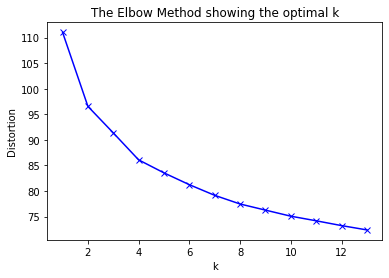

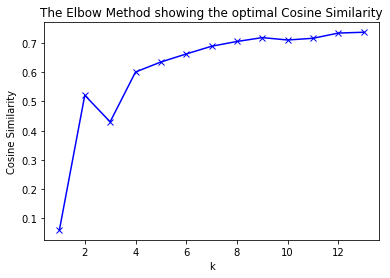

In [6]:
# Find cosine similarity: 
###
T2m_MeanAnom.shape
T2m_MeanAnomF = np.reshape(T2m_MeanAnom,[T2m_MeanAnom.shape[0],T2m_MeanAnom.shape[1]*T2m_MeanAnom.shape[2]])
K = range(1,14)
distortions = []
Cos_Similars = []


for k in K:
    print(k)
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(T2m_MeanAnomF)
    kmeanModel.fit(T2m_MeanAnomF)
    distortions.append(sum(np.min(cdist(T2m_MeanAnomF, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / T2m_MeanAnomF.shape[0])
    Z = kmeanModel.predict(T2m_MeanAnomF)
    dfALL['Kclass'] = Z
    
    num_classes = k
    Map_Pred = np.zeros([num_classes,latT.shape[0],lonT.shape[0]])
    
    for count in range(num_classes):
        dfk1 = dfALL[dfALL['Kclass']==count]
        plotter = np.mean(T2m_MeanAnom[dfk1.index,:,:],axis=0);
        Map_Pred[count,:,:] = plotter
    
    Map_Preds = np.zeros([Z.shape[0],latT.shape[0],lonT.shape[0]])

    for jj in range(Map_Preds.shape[0]):
        Map_Preds[jj,:,:] = Map_Pred[Z[jj],:,:]

    Map_True=T2m_MeanAnom

    Cos_Vals = np.zeros((Map_True.shape[0]))

    for ii in range(Map_True.shape[0]):
        r1 = np.reshape(np.squeeze(Map_Preds[ii,:,:])*Lands,(1,-1))
        r2 = np.reshape(np.squeeze(Map_True[ii,:,:])*Lands,(1,-1))
        r1 = r1[np.logical_not(np.isnan(r1))]
        r1 = np.expand_dims(r1,axis=0)
        r2 = r2[np.logical_not(np.isnan(r2))]
        r2 = np.expand_dims(r2,axis=0)
        Cos_Vals[ii] = Cos_Sim(r1,r2) 
    Cos_Similars.append(np.mean(Cos_Vals))
    
# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

# Plot the elbow
plt.plot(K, Cos_Similars, 'bx-')
plt.xlabel('k')
plt.ylabel('Cosine Similarity')
plt.title('The Elbow Method showing the optimal Cosine Similarity')
plt.show()

In [7]:
T2m_MeanAnom.shape
T2m_MeanAnomF = np.reshape(T2m_MeanAnom,[T2m_MeanAnom.shape[0],T2m_MeanAnom.shape[1]*T2m_MeanAnom.shape[2]])
num_classes=6

kmeans = KMeans(n_clusters=num_classes, random_state=0).fit(T2m_MeanAnomF)
Z = kmeans.predict(T2m_MeanAnomF)

(1711, 34)
(2996, 34)
(2493, 34)
(3111, 34)
(3081, 34)
(934, 34)


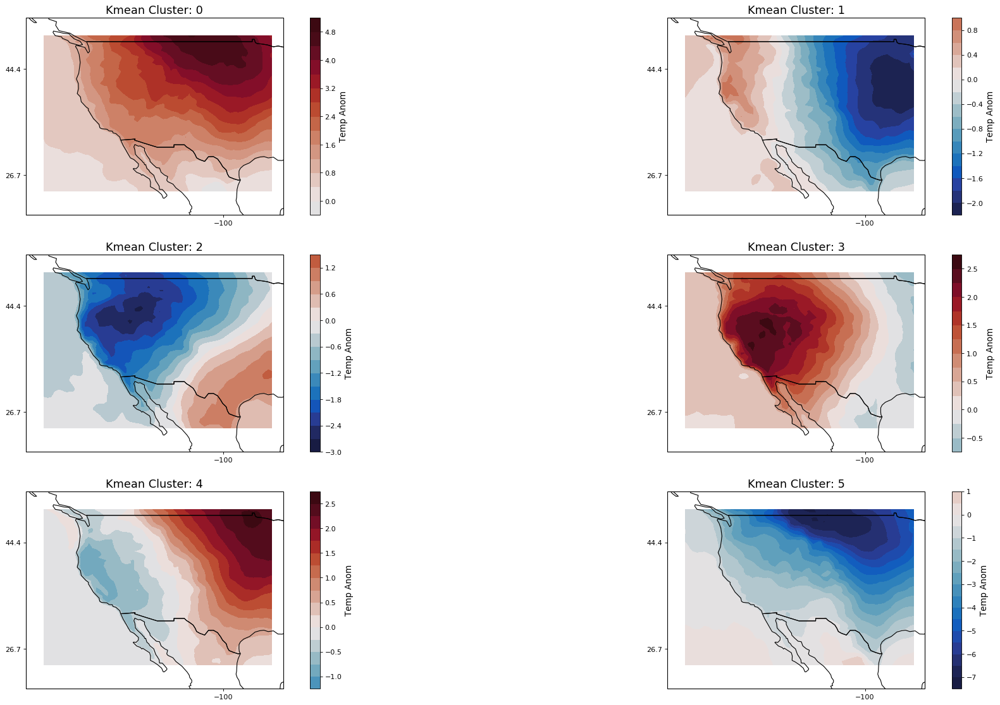

In [9]:


dfALL['Kclass'] = Z
dfALL.head(40)


# plot the different k clusters to look at the diversity of temperature shit
proj = ccrs.PlateCarree()
count = 0 
plots = []

plt.figure(figsize=(30,30), dpi= 80, facecolor='w', edgecolor='k')

Map_Pred = np.zeros([num_classes,latT.shape[0],lonT.shape[0]])
num_cat = np.zeros((num_classes))
perc_cat = np.zeros((num_classes))

for i in range(3):
    for j in range(2):
        dfk1 = dfALL[dfALL['Kclass']==count]
        print(dfk1.shape)
        num_cat[count] = dfk1.shape[0]
        perc_cat[count] = dfk1.shape[0]/dfALL.shape[0]
        
        ax = plt.subplot(5, 2, count+1,projection = proj)
        ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
        ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)
        ax.add_feature(cf.BORDERS)

        ax.add_feature(cf.NaturalEarthFeature(
                       category='cultural',
                       name='admin_1_states_provinces_lines',
                       scale='50m',
                       facecolor='none'))

        ax.coastlines()
        ax.add_feature(cf.BORDERS)
        ax.set_extent([-133, -90, 20, 51])

        mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap

        plotter = np.mean(T2m_MeanAnom[dfk1.index,:,:],axis=0); 
        scales =np.amax(np.abs(plotter))
        
        Map_Pred[count,:,:] = plotter

        fill = plt.contourf(lonT,latT,plotter,15,cmap=mappper,vmin=-scales,vmax=scales)

        cb = plt.colorbar(ax = ax, shrink=1)
        cb.set_label('Temp Anom', fontsize=12)

        plt.title('Kmean Cluster: %s' % count, fontsize=16)
        
        
        count+=1
plt.show()


## Lagg The Predictors

In [12]:
testingyear = 2016
num_classes=9

#now do shifting:
dfBuild = buildLaggedFeaturesBack1(dfALL,'ONI',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1T2m',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1T2m',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1T2m',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1GPH250',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1GPH250',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1GPH250',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3GPH250',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3GPH250',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3GPH250',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2GPH250',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2GPH250',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2GPH250',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1trop',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1trop',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1trop',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3trop',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3trop',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3trop',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2trop',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2trop',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2trop',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1np',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1np',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1np',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3np',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3np',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3np',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2np',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2np',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2np',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM1',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM1',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM1',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM2',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM2',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM2',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesBack1(dfBuild,'Kclass',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'Kclass',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'Kclass',lag=20,dropna=False)

#variable to Forecast
dfBuild = buildLaggedFeaturesFor(dfBuild,'Kclass',lag=28,dropna=False)



indicWint = np.array(dfBuild.loc[(
                        (dfBuild['month'] == 1)  | 
                        (dfBuild['month'] == 2)  |
                        (dfBuild['month'] == 3)  |
                        (dfBuild['month'] == 4)  |
                        (dfBuild['month'] == 5)  |
                        (dfBuild['month'] == 6)  |
                        (dfBuild['month'] == 7)  |
                        (dfBuild['month'] == 8)  |
                        (dfBuild['month'] == 9)  |
                        (dfBuild['month'] == 10) | 
                        (dfBuild['month'] == 11) |
                        (dfBuild['month'] == 12))].index.tolist())

dfBuild = dfBuild.iloc[indicWint,:]
dfBuild = dfBuild.reset_index(drop=True)

#find indices of desired testing year:
indicTesting = np.array(dfBuild.loc[(dfBuild['year']==testingyear)].index.tolist())
indicTraining = np.array(dfBuild.loc[(dfBuild['year']!=testingyear)].index.tolist())


dfBuild = dfBuild.drop(columns="model time")
dfBuild = dfBuild.drop(columns="year")
dfBuild = dfBuild.drop(columns="day")

dfTraining = dfBuild.iloc[indicTraining,:]
dfTesting = dfBuild.iloc[indicTesting,:]

#find indices of desired testing year


dfTraining = dfTraining.dropna()
dfTesting = dfTesting.dropna()

X_test = dfTesting.drop(columns="Kclass_for28")

Y_test = dfTesting['Kclass_for28']


valind = np.round(dfTraining.shape[0]*0.1).astype(int)

X_train = dfTraining.drop(columns="Kclass_for28")
Y_train = dfTraining['Kclass_for28']

X_val = X_train.iloc[-valind:,:]
Y_val = Y_train.iloc[-valind:]

X_train = X_train.iloc[0:-valind,:]
Y_train = Y_train.iloc[0:-valind]


X_train, Y_train = shuffle(X_train,  Y_train, random_state=10)

# convert class vectors to binary class matrices
Y_train = keras.utils.to_categorical(Y_train, num_classes)
Y_test = keras.utils.to_categorical(Y_test, num_classes)
Y_val = keras.utils.to_categorical(Y_val, num_classes)



scale = StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)
X_val = scale.transform(X_val)


In [13]:
import seaborn as sns
plt.figure(figsize=(15,10), dpi= 80, facecolor='w', edgecolor='k')

corrA = dfBuild.corr()
sns.heatmap(corrA, 
            xticklabels=corrA.columns.values,
            yticklabels=corrA.columns.values,cmap="PiYG")

plt.show()

ModuleNotFoundError: No module named 'seaborn'

In [14]:
os.getcwd()

'/home/wchapman/S2S/T2mENSOmjo'

In [181]:
#Perform the Moving Average. 
#remove the seasonal cycle 4 harmonics 
def removeSC(TS):
    O1 = 1 / 365.25; #for daily data --- (365 days in year)
    T = np.array(range(len(TS))) ### index of days
    # A = [mean, linear fit, harmonic 1 , harmonic 2, harmonic 3, harmonic 4]
    A = np.array([np.ones(TS.shape[0]),T, np.cos(2*np.pi*T*O1),np.sin(2*np.pi*T*O1),
                 np.cos(2*np.pi*T*O1*2),np.sin(2*np.pi*T*O1*2),
                 np.cos(2*np.pi*T*O1*4),np.sin(2*np.pi*T*O1*4),
                 np.cos(2*np.pi*T*O1*8),np.sin(2*np.pi*T*O1*8)])
    A = np.transpose(A)
    #solve for the weights (inverse L2norm problem:)
    solu = np.matmul(np.matmul(np.linalg.inv(np.matmul(np.transpose(A),A)),np.transpose(A)),TS)
    model = np.matmul(A,solu) # linear model of these variables. 
    return model, solu


LMf = '/home/wchapman/S2S/T2mENSOmjo/MERRA2_101.constants_2d_asm_Nx.00000000.nc4.nc'
LM = Dataset(LMf)
latLM = LM.variables['lat'][:] 
lonLM = LM.variables['lon'][:]
Lands =  np.squeeze(LM.variables['FRLAND'][:])

In [182]:
#for lagging features: 

def buildLaggedFeaturesBack(s,lag=2,dropna=True):
    '''
    Builds a new DataFrame to facilitate regressing over all possible lagged features
    '''
    if type(s) is pd.DataFrame:
        new_dict={}
        for col_name in s:
            new_dict[col_name]=s[col_name]
            # create lagged Series
            for l in range(1,lag+1):
                new_dict['%s_lag%d' %(col_name,l)]=s[col_name].shift(l)
        res=pd.DataFrame(new_dict,index=s.index)
    else:
        print('Only works for DataFrame or Series')
        return None
    if dropna:
        return res.dropna()
    else:
        return res 
    
def buildLaggedFeaturesFor(s,col_name,lag=2,dropna=True):
    '''
    Builds a new DataFrame to facilitate regressing over all possible lagged features
    '''
   
    if type(s) is pd.DataFrame:
        new_dict={}
        for col_name2 in s:
            new_dict[col_name2]=s[col_name2]
        
        # create lagged Series
        new_dict[col_name2]=s[col_name2]
        # create lagged Series
        new_dict['%s_for%d' %(col_name,lag)]=s[col_name].shift(-lag)
        res=pd.DataFrame(new_dict,index=s.index)
           
    else:
        print('Only works for DataFrame')
        return None
    if dropna:
        return res.dropna()
    else:
        return res

## T2M files

In [183]:
MerraDirectory = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/All/'
train_file_names=sorted(os.listdir(MerraDirectory))

f = Dataset('/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/All/' + train_file_names[0])
lat = f.variables['lat'][:] 
lon = f.variables['lon'][:]
T2mO  = f.variables['T2M'][:]

latW = [24,50]
lonW = [-130,-92]

# Get Land Mask and variables set to line up.
latST = np.argmin(np.abs(latLM - latW[0])).astype(int)
latEN = np.argmin(np.abs(latLM - latW[-1])).astype(int)
lonST = np.argmin(np.abs(lonLM - lonW[0])).astype(int)
lonEN = np.argmin(np.abs(lonLM - lonW[-1])).astype(int)

Lands = Lands[latST:latEN+1,lonST:lonEN+1]
Lands[Lands>0.05] = 1
Lands[Lands<0.001] = np.nan

latLM = latLM[latST:latEN+1]
lonLM = lonLM[lonST:lonEN+1]

In [184]:
Lands.shape

(53, 62)

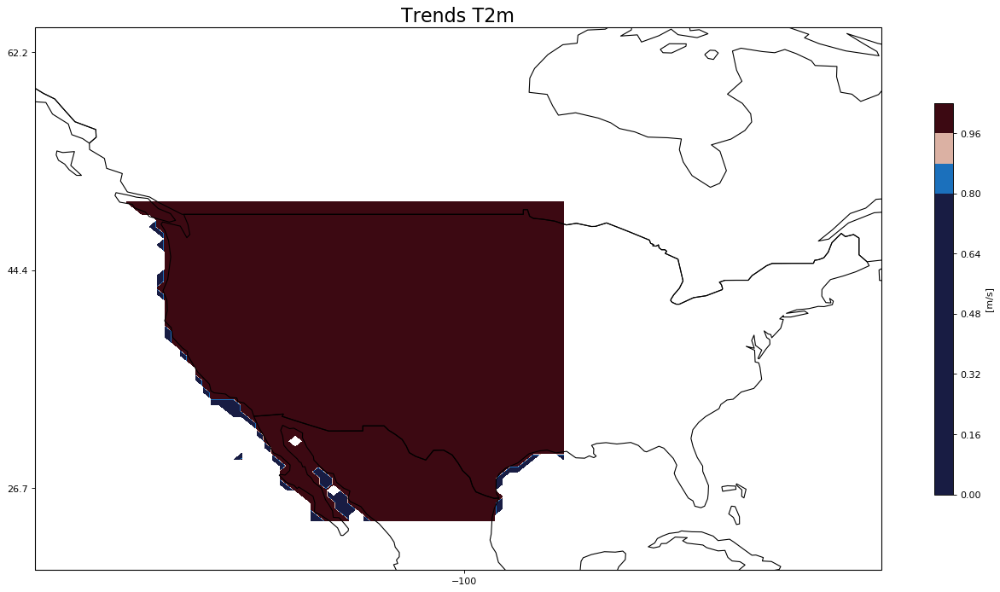

In [185]:
############### T2m Land Mask ######################

proj = ccrs.PlateCarree()
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-135, -66, 20, 60])

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonLM,latLM,Lands,15,cmap=mappper,vmin=.8,vmax=1)
cbar = plt.colorbar(ax = ax, shrink=0.38)
cbar.set_label('[m/s]',fontsize=10)
plt.title('Trends T2m',fontsize=20)
plt.show()


## If you need to build it again (and write it):
uncomment the following stuff

In [186]:
# # Deal with times and retrieve T2M predictand
# yearz =[]
# dayz = []
# monthz =[]

# T2m = np.zeros([len(train_file_names),Lands.shape[0],Lands.shape[1]])

# for ii in range(len(train_file_names)-1):
#     if ii % 10 == 0:
#         print("File #:", ii,"of:",len(train_file_names))
#     f = Dataset('/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/All/' + train_file_names[ii])
#     times = f.variables['time']
#     times.shape
#     dates = num2date(times[:].data,units=times.units,calendar=times.calendar)
#     yearz = np.append(yearz, dates[0].year)
#     dayz = np.append(dayz, dates[0].day)
#     monthz = np.append(monthz, dates[0].month)
    
#     latTemp = f.variables['lat'][:]
#     lonTemp = f.variables['lon'][:]
    
#     latST = np.argmin(np.abs(latTemp - latW[0])).astype(int)
#     latEN = np.argmin(np.abs(latTemp - latW[-1])).astype(int)
#     lonST = np.argmin(np.abs(lonTemp - lonW[0])).astype(int)
#     lonEN = np.argmin(np.abs(lonTemp - lonW[-1])).astype(int)
    
#     T2mTemp = f.variables['T2M'][:,latST:latEN+1,lonST:lonEN+1]
#     T2m[ii,:,:] = T2mTemp

# data = {'year':yearz,'month':monthz, 'day':dayz}
# df = pd.DataFrame(data) 
# lastind = df.index[(df['year']==2019)&(df['month']==3)&(df['day']==31)][0]
# df = df.loc[0:lastind,:]
# df

In [187]:
# prep everything for saving
# T2Mall = copy.deepcopy(T2m)

In [188]:
# df.to_csv('/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/MERRAdatesdf.csv',index=False)

In [189]:
# prep everything for saving
# T2Mall = copy.deepcopy(T2m)

# df.to_csv('/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/MERRAdatesdf.csv',index=False)

# #write netcdf file. 
# latTemp = f.variables['lat'][:]
# lonTemp = f.variables['lon'][:]
# latNEW = latTemp[latST:latEN+1]
# lonNEW = lonTemp[lonST:lonEN+1]
# filename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/T2m_NorthAmerica_1980_2019.nc'
# exists = os.path.isfile(filename)
# if exists:
#     os.remove(filename)
                
# dataset = Dataset(filename,'w',format='NETCDF4_CLASSIC')
# lat = dataset.createDimension('lat', latNEW.shape[0])
# lon = dataset.createDimension('lon', lonNEW.shape[0])
# time = dataset.createDimension('time', None)

# print(dataset.file_format)
# times = dataset.createVariable('time', np.float64, ('time',))
# lat = dataset.createVariable('lat', np.float32,('lat',))
# lon = dataset.createVariable('lon', np.float32,('lon',))

# # Create the actual 4-d variable
# T2M = dataset.createVariable('T2M', np.float32,('time','lat','lon'))
# lat.units = 'degree_north'
# lon.units = 'degrees_east'
# lon.gridtype= 'Latitude/Longitude'
# lat.gridtype = 'Latitude/Longitude'
# lat.standard_name = "latitude"
# lon.standard_name = "longitude"

# T2M.units = 'K'
# T2M.standard_name = 'Sea Surface Temperature'
# T2M.gridtype= 'Latitude/Longitude'

# #make correct times: 
# dates = []
# times.units = 'hours since 0001-01-01 00:00:00'
# times.calendar = 'gregorian'
# for nn in range(df.shape[0]):
#     dates.append(datetime(df['year'][nn].astype(int), df['month'][nn].astype(int), df['day'][nn].astype(int)))
    
# # print('time values (in units %s):',times.units,times[:])

# lat[:] = latNEW
# lon[:] = lonNEW
# T2M[:] = T2Mall[0:len(df),:,:]
# times[:] = date2num(dates, units = times.units,calendar = times.calendar)
# dataset.close()

## Read Variables in from Saved files

In [14]:
T2mfilename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/T2m_NorthAmerica_1980_2019.nc'
f = Dataset(T2mfilename)
times = f.variables['time']
dates = num2date(times[:].data,units=times.units,calendar=times.calendar)
yearz =[]
dayz = []
monthz =[]
for jj in range(len(times)):
    yearz = np.append(yearz, dates[jj].year)
    dayz = np.append(dayz, dates[jj].day)
    monthz = np.append(monthz, dates[jj].month)
data = {'model time':times[:].data,'year':yearz,'month':monthz, 'day':dayz}
df = pd.DataFrame(data) 
df

latT = f.variables['lat'][:]
lonT = f.variables['lon'][:]


# Get Land Mask and variables set to line up.
latST = np.argmin(np.abs(latT - latW[0])).astype(int)
latEN = np.argmin(np.abs(latT - latW[-1])).astype(int)
lonST = np.argmin(np.abs(lonT - lonW[0])).astype(int)
lonEN = np.argmin(np.abs(lonT - lonW[-1])).astype(int)


T2m = f.variables['T2M'][:,latST:latEN+1,lonST:lonEN+1]
latT = f.variables['lat'][latST:latEN+1]
lonT = f.variables['lon'][lonST:lonEN+1]

## Open saved files so you dont have to load everythin`

In [15]:
OniFil = '/data/downloaded/Forecasts/ECMWF/S2S_ML/ONI.txt'
dfONI = pd.read_csv(OniFil, delim_whitespace=True, 
                       names=("year","1", "2","3","4","5","6","7","8","9","10","11","12"))
dfONI

ONI = np.zeros([len(df),])    

for ii in range(1980,2020):
    for jj in range(1,13):
        indic = np.array(df.loc[(df['year'] == ii) & (df['month'] ==jj)].index.tolist())
        if indic.size == 0: 
            continue            
        ONI[indic] = dfONI.loc[(dfONI["year"] == ii)].iloc[:,jj]

df2 = pd.DataFrame({'ONI': ONI})

df = df.join(df2)


In [16]:
df.head()

,model time,year,month,day,ONI
0,17347584.0,1980.0,1.0,1.0,0.59
1,17347608.0,1980.0,1.0,2.0,0.59
2,17347632.0,1980.0,1.0,3.0,0.59
3,17347656.0,1980.0,1.0,4.0,0.59
4,17347680.0,1980.0,1.0,5.0,0.59


In [17]:
QBOFil = '/data/downloaded/Forecasts/ECMWF/S2S_ML/QBO.txt'
dfQBO = pd.read_csv(QBOFil, delim_whitespace=True, 
                       names=("year","1", "2","3","4","5","6","7","8","9","10","11","12"))
dfQBO

QBO = np.zeros([len(df),])    

for ii in range(1980,2020):
    for jj in range(1,13):
        indic = np.array(df.loc[(df['year'] == ii) & (df['month'] ==jj)].index.tolist())
        if indic.size == 0: 
            continue            
        QBO[indic] = dfQBO.loc[(dfQBO["year"] == ii)].iloc[:,jj]

df2 = pd.DataFrame({'QBO': QBO})

df = df.join(df2)


In [18]:
df.head()

,model time,year,month,day,ONI,QBO
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2


## Upper Level GPH

In [34]:
# # Deal with times and retrieve T2M predictand
# yearz =[]
# dayz = []
# monthz =[]

# latG = [0,90]
# lonG = [-180,180]

# f = Dataset('/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/All/' + train_file_names[0])
# latTemp = f.variables['lat'][:]
# lonTemp = f.variables['lon'][:]
# latST = np.argmin(np.abs(latTemp - latG[0])).astype(int)
# latEN = np.argmin(np.abs(latTemp - latG[-1])).astype(int)
# lonST = np.argmin(np.abs(lonTemp - lonG[0])).astype(int)
# lonEN = np.argmin(np.abs(lonTemp - lonG[-1])).astype(int)
# latTemp = latTemp[latST:latEN+1]
# lonTemp = lonTemp[lonST:lonEN+1]


# GPH200 = np.zeros([len(train_file_names),latTemp.shape[0],lonTemp.shape[0]])


# for ii in range(len(train_file_names)-1):
#     if ii % 10 == 0:
#         print("File #:", ii,"of:",len(train_file_names))
#     f = Dataset('/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/All/' + train_file_names[ii])
#     times = f.variables['time']
#     times.shape
#     dates = num2date(times[:].data,units=times.units,calendar=times.calendar)
#     yearz = np.append(yearz, dates[0].year)
#     dayz = np.append(dayz, dates[0].day)
#     monthz = np.append(monthz, dates[0].month)
    
#     latTemp = f.variables['lat'][:]
#     lonTemp = f.variables['lon'][:]
    
#     latST = np.argmin(np.abs(latTemp - latG[0])).astype(int)
#     latEN = np.argmin(np.abs(latTemp - latG[-1])).astype(int)
#     lonST = np.argmin(np.abs(lonTemp - lonG[0])).astype(int)
#     lonEN = np.argmin(np.abs(lonTemp - lonG[-1])).astype(int)
    
#     GPH200Temp = f.variables['H250'][:,latST:latEN+1,lonST:lonEN+1]
#     GPH200[ii,:,:] = GPH200Temp

# data = {'year':yearz,'month':monthz, 'day':dayz}
# dfGPH = pd.DataFrame(data) 
# lastind = df.index[(df['year']==2019)&(df['month']==3)&(df['day']==31)][0]
# dfGPH = df.loc[0:lastind,:]
# dfGPH

In [458]:
# # prep everything for saving
# GPHall = copy.deepcopy(GPH200)

# #write netcdf file. 
# latTemp = f.variables['lat'][:]
# lonTemp = f.variables['lon'][:]
# latNEW = latTemp[latST:latEN+1]
# lonNEW = lonTemp[lonST:lonEN+1]
# filename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/GPH250_NorthernHemi_1980_2019.nc'
# exists = os.path.isfile(filename)
# if exists:
#     os.remove(filename)
                
# dataset = Dataset(filename,'w',format='NETCDF4_CLASSIC')
# lat = dataset.createDimension('lat', latNEW.shape[0])
# lon = dataset.createDimension('lon', lonNEW.shape[0])
# time = dataset.createDimension('time', None)

# print(dataset.file_format)
# times = dataset.createVariable('time', np.float64, ('time',))
# lat = dataset.createVariable('lat', np.float32,('lat',))
# lon = dataset.createVariable('lon', np.float32,('lon',))

# # Create the actual 4-d variable
# GPH250 = dataset.createVariable('GPH250', np.float32,('time','lat','lon'))
# lat.units = 'degree_north'
# lon.units = 'degrees_east'
# lon.gridtype= 'Latitude/Longitude'
# lat.gridtype = 'Latitude/Longitude'
# lat.standard_name = "latitude"
# lon.standard_name = "longitude"

# GPH250.units = 'm'
# GPH250.standard_name = 'height_at_250_hPa'
# GPH250.gridtype= 'Latitude/Longitude'

# #make correct times: 
# dates = []
# times.units = 'hours since 0001-01-01 00:00:00'
# times.calendar = 'gregorian'
# for nn in range(dfGPH.shape[0]):
#     dates.append(datetime(dfGPH['year'][nn].astype(int), dfGPH['month'][nn].astype(int), dfGPH['day'][nn].astype(int)))
    
# # print('time values (in units %s):',times.units,times[:])

# lat[:] = latNEW
# lon[:] = lonNEW
# GPH250[:] = GPHall[0:len(df),:,:]
# times[:] = date2num(dates, units = times.units,calendar = times.calendar)
# dataset.close()

## Open just 250 HPA so you don't need to stress about it'

In [19]:
GPHfilename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/GPH250_NorthernHemi_1deg_1980_2019.nc'
f = Dataset(GPHfilename)
latGPH = f.variables['lat'][:] 
lonGPH = f.variables['lon'][:]



latGPHE = [0,75]
lonGPHE = [50,180]

latGPHW = [0,75]
lonGPHW = [-180,-15]

latSTe = np.argmin(np.abs(latGPH - latGPHE[0])).astype(int)
latENe = np.argmin(np.abs(latGPH - latGPHE[-1])).astype(int)
lonSTe = np.argmin(np.abs(lonGPH - lonGPHE[0])).astype(int)
lonENe = np.argmin(np.abs(lonGPH - lonGPHE[-1])).astype(int)

latSTw = np.argmin(np.abs(latGPH - latGPHW[0])).astype(int)
latENw = np.argmin(np.abs(latGPH - latGPHW[-1])).astype(int)
lonSTw = np.argmin(np.abs(lonGPH - lonGPHW[0])).astype(int)
lonENw = np.argmin(np.abs(lonGPH - lonGPHW[-1])).astype(int)

GPHe = f.variables['GPH250'][:,latSTe:latENe+1,lonSTe:lonENe+1]
GPHw = f.variables['GPH250'][:,latSTw:latENw+1,lonSTw:lonENw+1]
GPH250 = np.concatenate((GPHe,GPHw),axis=2)
latGPH = latGPH[latSTe:latENe+1]
lonT1 = lonGPH[lonSTe:lonENe+1]-180
lonT2 = lonGPH[lonSTw:lonENw+1]+180
lonGPH = np.concatenate((lonT1,lonT2))

times = f.variables['time']
dates = num2date(times[:].data,units=times.units,calendar=times.calendar)

yearzGPH =[]
dayzGPH = []
monthzGPH =[]



for jj in range(len(times)):
    yearzGPH = np.append(yearzGPH, dates[jj].year)
    dayzGPH = np.append(dayzGPH, dates[jj].day)
    monthzGPH = np.append(monthzGPH, dates[jj].month)
data = {'model time':times[:].data,'year':yearzGPH,'month':monthzGPH, 'day':dayzGPH}
dfGPH = pd.DataFrame(data) 
dfGPH


,model time,year,month,day
0,17347584.0,1980.0,1.0,1.0
1,17347608.0,1980.0,1.0,2.0
2,17347632.0,1980.0,1.0,3.0
3,17347656.0,1980.0,1.0,4.0
4,17347680.0,1980.0,1.0,5.0
5,17347704.0,1980.0,1.0,6.0
6,17347728.0,1980.0,1.0,7.0
7,17347752.0,1980.0,1.0,8.0
8,17347776.0,1980.0,1.0,9.0
9,17347800.0,1980.0,1.0,10.0


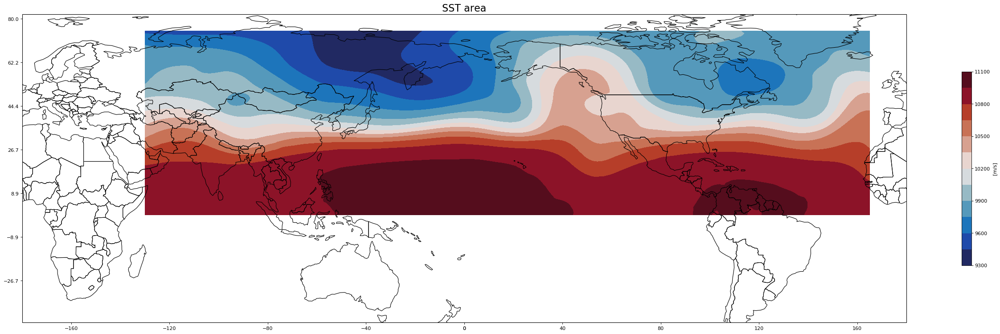

In [20]:
############################################

# proj = ccrs.PlateCarree()
# plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
# ax = plt.subplot(1, 1, 1,projection = proj)
# proj = ccrs.PlateCarree()
# ax.add_feature(cf.BORDERS)

# ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
# ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

# ax.add_feature(cf.NaturalEarthFeature(
#                category='cultural',
#                name='admin_1_states_provinces_lines',
#                scale='50m',
#                facecolor='none'))

# ax.coastlines()
# ax.add_feature(cf.BORDERS)
# # ax.set_extent([-180, -46, 10, 70])

# # scales =np.amax(np.abs(trendPlot))

# mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


# plt.contourf(lonSST,latSST,SSTo,15,cmap=mappper)
# cbar = plt.colorbar(ax = ax, shrink=0.38)
# cbar.set_label('[m/s]',fontsize=10)
# plt.title('SST area',fontsize=20)
# plt.show()



############################################

proj = ccrs.PlateCarree(central_longitude=180)
plt.figure(figsize=(40,40), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-180-90, -46, -20, 70])

# scales =np.amax(np.abs(trendPlot))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonGPH,latGPH,GPH250[40,:,:],15,cmap=mappper)
cbar = plt.colorbar(ax = ax, shrink=0.18)
cbar.set_label('[m/s]',fontsize=10)
plt.title('SST area',fontsize=20)
plt.show()


## MJO

In [21]:
MJOfile = '/data/downloaded/Forecasts/ECMWF/S2S_ML/RMM_MJO_1974_2019.txt'
dfMJO = pd.read_csv(MJOfile, delim_whitespace=True, 
                   dtype = {"year": np.float64, "month": np.int32,"day": np.int32,"RMM1":np.int32,"RMM2":np.int32,
                            "phase": np.int32, "amplitude": np.int32})

dfMJO = dfMJO.rename(index=str, columns={"year,": "year", "month,": "month","day,": "day","RMM1,": "RMM1",
                                        "RMM2,": "RMM2","phase,": "phase","amplitude.": "amplitude"})


dfMJO = dfMJO[['year','month','day','phase','amplitude','RMM1','RMM2']]

dfMJO = dfMJO.iloc[:,0:7]
dfMJO.head()

,year,month,day,phase,amplitude,RMM1,RMM2
0,1974,6,1,5,2.02948,1.63447,1.20304
1,1974,6,2,5,1.89729,1.60289,1.01512
2,1974,6,3,5,1.86476,1.51625,1.08551
3,1974,6,4,5,1.83092,1.50981,1.03573
4,1974,6,5,5,2.03326,1.55906,1.30518


In [22]:
# Merge it All 
dfA = pd.merge(left=df,right=dfMJO, how='left', left_on=['year','month','day'], right_on=['year','month','day'])

In [23]:
dfA.head()

,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2,4,0.814303,0.811586,-0.066468
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2,4,0.705712,0.705088,-0.029684
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2,5,0.663776,0.662733,0.037199
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2,5,0.650896,0.614840,0.213630
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2,5,0.857257,0.702877,0.490769


## SEA ICE

In [24]:
SeaicefileN = '/data/downloaded/Forecasts/ECMWF/S2S_ML/N_seaice_extent_daily_v3.0.csv'
dfSiceN = pd.read_csv(SeaicefileN,header=1,sep=',',
                   dtype = {"Year":np.float64, "Month": np.float64,"Day": np.float64,"Extent":np.int32})

dfSiceN = dfSiceN.iloc[:,0:4]



dfSiceN = dfSiceN.rename(index=str, columns={"Year": "year", " Month": "month"," Day": "day","     Extent": "Extent_N"})

In [25]:
dfAA = pd.merge(left=dfA,right=dfSiceN, how='left', left_on=['year','month','day'], right_on=['year','month','day'])

In [26]:
dfAA.head()

,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2,4,0.814303,0.811586,-0.066468,14.200
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2,4,0.705712,0.705088,-0.029684,NaN
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2,5,0.663776,0.662733,0.037199,14.302
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2,5,0.650896,0.614840,0.213630,NaN
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2,5,0.857257,0.702877,0.490769,14.414


In [27]:
SeaicefileS = '/data/downloaded/Forecasts/ECMWF/S2S_ML/S_seaice_extent_daily_v3.0.csv'
dfSiceS = pd.read_csv(SeaicefileS,header=1,sep=',',
                   dtype = {"Year":np.float64, "Month": np.float64,"Day": np.float64,"Extent":np.int32})

dfSiceS = dfSiceS.iloc[:,0:4]

dfSiceS = dfSiceS.rename(index=str, columns={"Year": "year", " Month": "month"," Day": "day","     Extent" : "Extent_S"})

In [28]:
N=14
dfAAA = pd.merge(left=dfAA,right=dfSiceS, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfAAA  = dfAAA.interpolate(method='polynomial', order=2)
dfAAA

[ms,ss] = removeSC(np.array(dfAAA['Extent_N']))
dfAAA['Extent_N'] = dfAAA['Extent_N'] - ms;
dfAAA['Extent_N'] = pd.Series(dfAAA['Extent_N']).rolling(window=N,center=True,min_periods=1).mean().values


[ms,ss] = removeSC(np.array(dfAAA['Extent_S']))
dfAAA['Extent_S'] = dfAAA['Extent_S'] - ms;
dfAAA['Extent_S'] = pd.Series(dfAAA['Extent_S']).rolling(window=N,center=True,min_periods=1).mean().values

dfAAA.head()

,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2,5,0.663776,0.662733,0.037199,-0.980248,-0.239086
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2,5,0.650896,0.614840,0.213630,-0.980062,-0.229728
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2,5,0.857257,0.702877,0.490769,-0.979840,-0.215738


/home/wchapman/.conda/envs/MJOenso/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


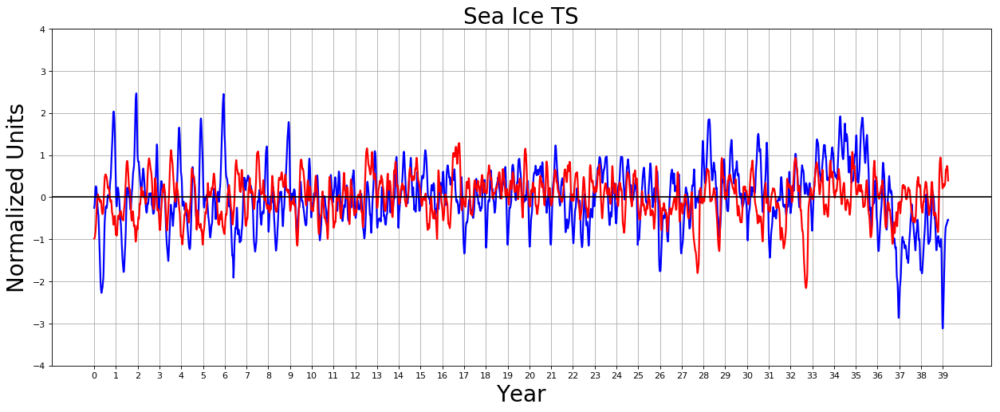

In [29]:
# Plot the leading PC time series.
years =40
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(dfAAA['Extent_S'].iloc[0:365*years], color='b', linewidth=2)
plt.plot(dfAAA['Extent_N'].iloc[0:365*years], color='r', linewidth=2)

plt.axhline(0, color='k')
ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid('on')
plt.title('Sea Ice TS',FontSize=25)
plt.xlabel('Year',FontSize=25)
plt.ylabel('Normalized Units',FontSize=25)
plt.ylim(-4, 4)


plt.show()

## SSTs  Example EOFs ----> 

In [30]:
dfAAA.head(6)

,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2,5,0.663776,0.662733,0.037199,-0.980248,-0.239086
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2,5,0.650896,0.614840,0.213630,-0.980062,-0.229728
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2,5,0.857257,0.702877,0.490769,-0.979840,-0.215738
5,17347704.0,1980.0,1.0,6.0,0.59,-1.2,5,0.969876,0.758704,0.604175,-0.978136,-0.202001


In [31]:
## Demean and Detrend
trendPlot = np.zeros([T2m.shape[1],T2m.shape[2]])
T2m_a = np.zeros(T2m.shape)
N = 14

for ii in range(trendPlot.shape[0]):
    if ii % 30 == 0:
        print("latitude #:", ii,"of:",trendPlot.shape[0])
    for jj in range(trendPlot.shape[1]):
        [ms,ss] = removeSC(T2m[:,ii,jj])
        trendPlot[ii,jj] = ss[1]
        TempT2m = T2m[:,ii,jj] - ms
        #now do 7day running mean
        T2m_a[:,ii,jj] = pd.Series(TempT2m).rolling(window=N,center=True,min_periods=1).mean().values 
        
        

latitude #: 0 of: 53
latitude #: 30 of: 53


In [32]:
df.head()

,model time,year,month,day,ONI,QBO
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2


##### Sanity check anomaly 

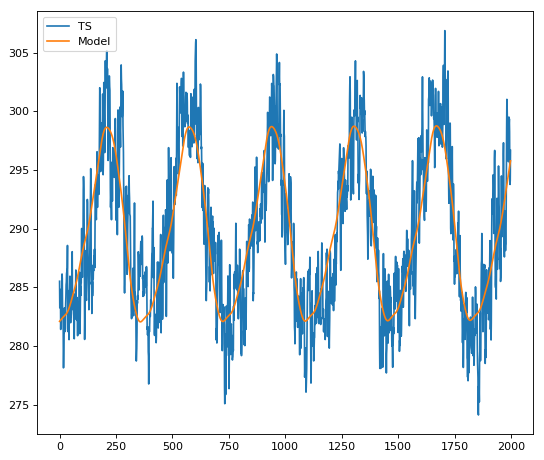

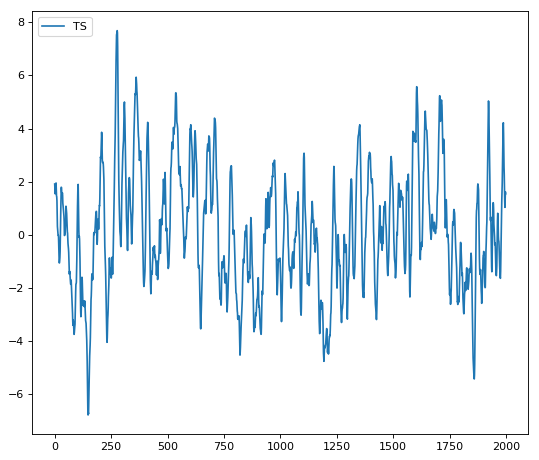

In [33]:
plt.figure(figsize=(8,7), dpi= 80, facecolor='w', edgecolor='k')
plt.plot( T2m[1:2000,20,20])

[ms,ss] = removeSC(T2m[:,20,20])
plt.plot(ms[1:2000])

# TempT2m = T2m[:,20,20] - ms
plt.legend(['TS','Model'], loc='upper left')
plt.show()

plt.figure(figsize=(8,7), dpi= 80, facecolor='w', edgecolor='k')
plt.plot( T2m_a[1:2000,20,20])
plt.legend(['TS','Model'], loc='upper left')

plt.show()


In [34]:
#Perform the Moving Average. 
#remove the seasonal cycle 4 harmonics 
def removeSC(TS):
    O1 = 1 / 365.25; #for daily data --- (365 days in year)
    T = np.array(range(len(TS))) ### index of days
    # A = [mean, linear fit, harmonic 1 , harmonic 2, harmonic 3, harmonic 4]
    A = np.array([np.ones(TS.shape[0]),T ,np.cos(2*np.pi*T*O1),np.sin(2*np.pi*T*O1),
                 np.cos(2*np.pi*T*O1*2),np.sin(2*np.pi*T*O1*2),
                 np.cos(2*np.pi*T*O1*4),np.sin(2*np.pi*T*O1*4),
                 np.cos(2*np.pi*T*O1*8),np.sin(2*np.pi*T*O1*8)])
    A = np.transpose(A)
    #solve for the weights (inverse L2norm problem:)
    solu = np.matmul(np.matmul(np.linalg.inv(np.matmul(np.transpose(A),A)),np.transpose(A)),TS)
    model = np.matmul(A,solu) # linear model of these variables. 
    return model, solu



In [1]:

############################################

proj = ccrs.PlateCarree()
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-100, 30, 0, 80], crs=ccrs.PlateCarree())

scales =np.amax(np.abs(trendPlot))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonT,latT,trendPlot*Lands,15,cmap=mappper,vmin=-scales,vmax=scales)
cbar = plt.colorbar(ax = ax, shrink=0.38)
cbar.set_label('[m/s]',fontsize=10)
plt.title('Trends T2m',fontsize=20)
plt.show()


NameError: name 'ccrs' is not defined

## Do some EOFs

In [36]:
TemplateLands = copy.deepcopy(Lands)
TemplateLands =np.expand_dims(TemplateLands,axis=0)
TemplateLands.shape

(1, 53, 62)

In [37]:
#  Read SST anomalies using the netCDF4 module. The file contains
# November-March averages of SST anomaly in the central and northern Pacific.

# Create an EOF solver to do the EOF analysis. Square-root of cosine of
# latitude weights are applied before the computation of EOFs.
coslat = np.cos(np.deg2rad(latT))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solver = Eof(T2m_a*TemplateLands, weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')

6.3573832511901855 Seconds


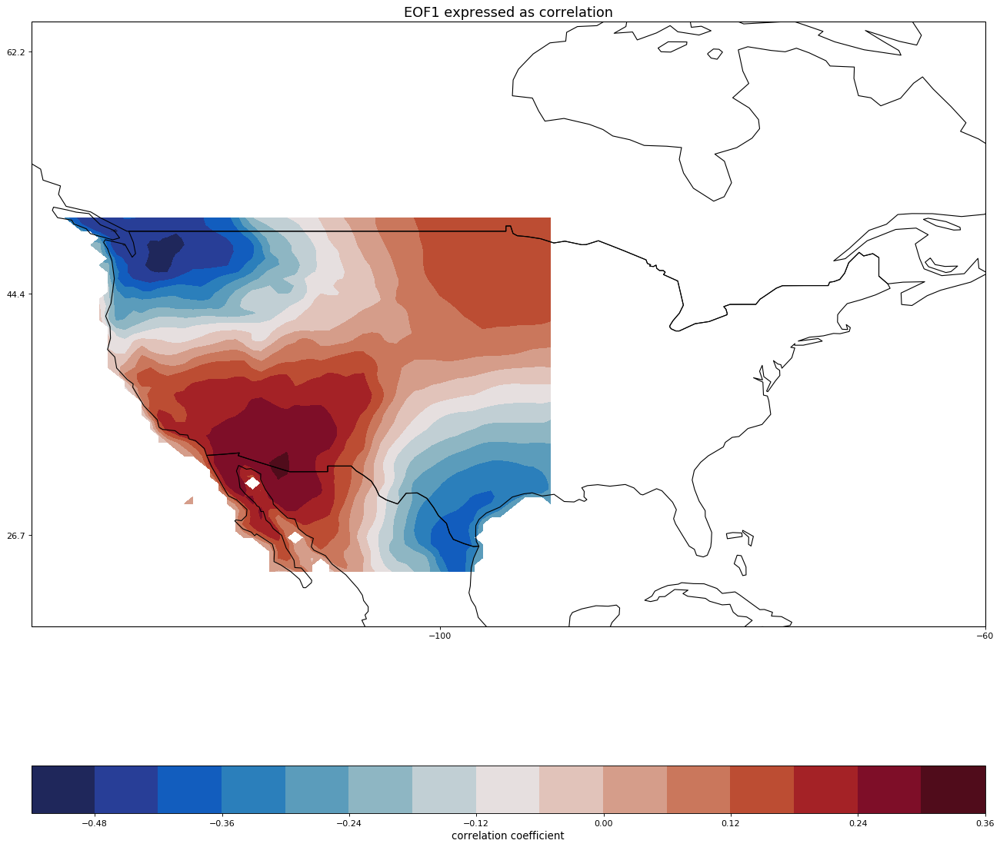

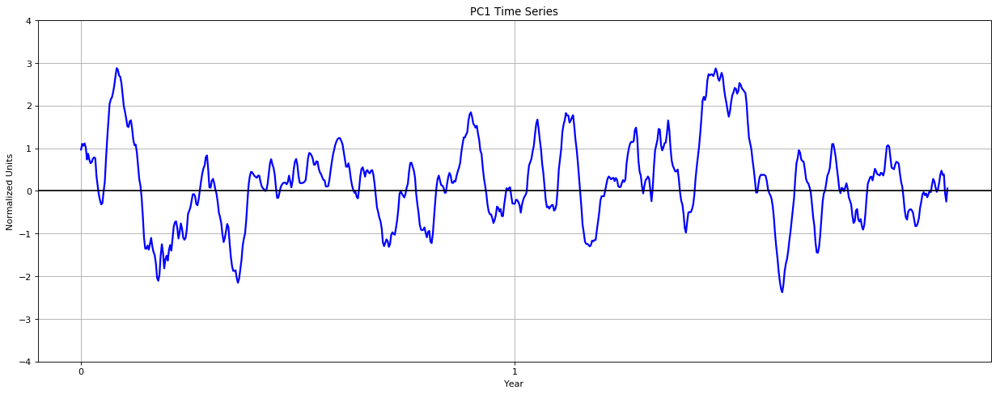

In [38]:
# Retrieve the leading EOF, expressed as the correlation between the leading
# PC time series and the input SST anomalies at each grid point, and the
# leading PC time series itself.

numeof =3
eof1 = solver.eofsAsCorrelation(neofs=5)
pc1 = solver.pcs(npcs=numeof+1, pcscaling=1)

proj = ccrs.PlateCarree()
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-130, -60, 20, 60])

scales =np.amax(np.abs(trendPlot))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap

fill = plt.contourf(lonT,latT,np.squeeze(eof1[numeof,:,:]),15,cmap=mappper)

cb = plt.colorbar(fill, orientation='horizontal')
cb.set_label('correlation coefficient', fontsize=12)
plt.title('EOF1 expressed as correlation', fontsize=16)




# Plot the leading PC time series.
years =2
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(pc1[0:365*years,numeof], color='b', linewidth=2)
plt.axhline(0, color='k')
ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid('on')
plt.title('PC1 Time Series')
plt.xlabel('Year')
plt.ylabel('Normalized Units')
plt.ylim(-4, 4)


plt.show()

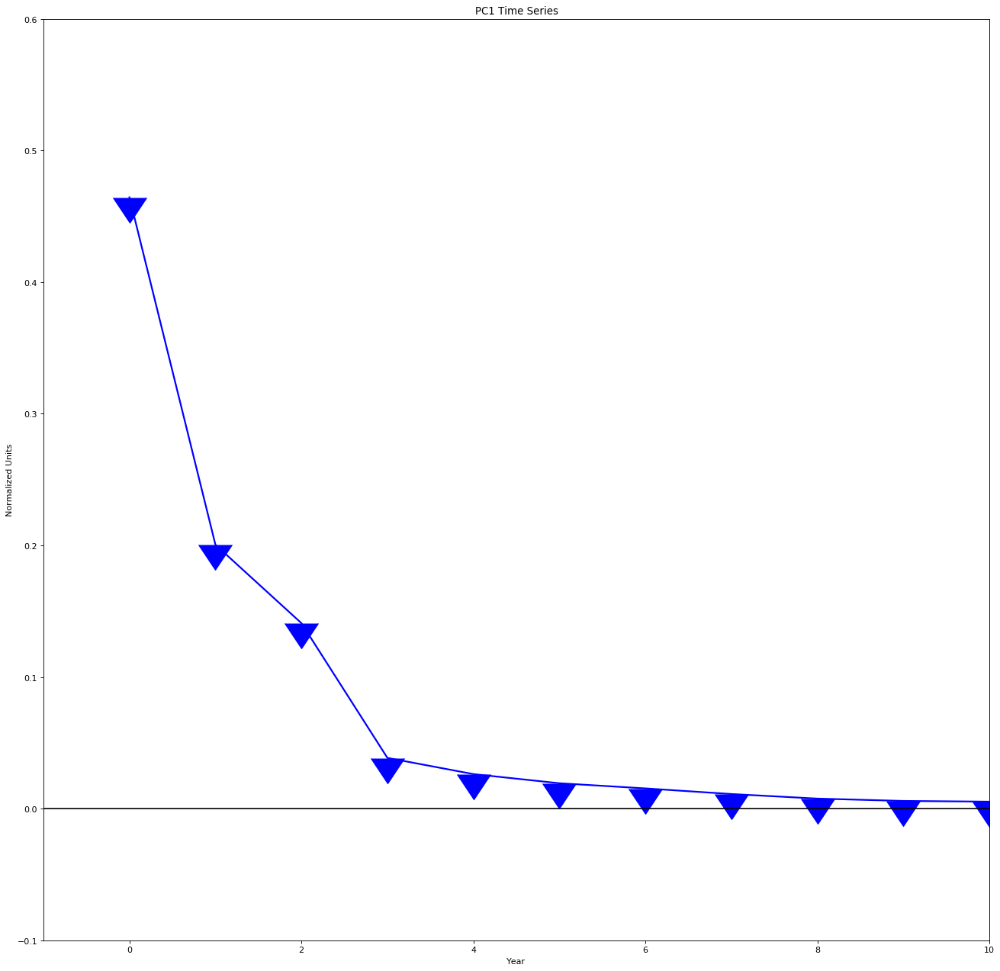

In [39]:
variance_fractions = solver.varianceFraction()

# Plot the leading PC time series.
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(variance_fractions, color='b', linewidth=2,marker=11,markersize=40)
plt.axhline(0, color='k')
plt.title('PC1 Time Series')
plt.xlabel('Year')
plt.ylabel('Normalized Units')
plt.ylim(-.1, .6)
plt.xlim(-1, 10)

plt.show()

In [40]:
np.sum(variance_fractions[0:5])


0.8708166447049077

In [41]:
np.sum(variance_fractions[0:5])
pc1.shape
pcs = solver.pcs(npcs=5, pcscaling=1)


In [42]:

dataPCS = {'PC1t2m':pcs[:,0],'PC2t2m':pcs[:,1], 'PC3t2m':pcs[:,2],'PC4t2m':pcs[:,3]}
dfPCSt2m = pd.DataFrame(dataPCS) 
dfPCSt2m
dfPCSt2m = dfPCSt2m.join(df['year'])
dfPCSt2m = dfPCSt2m.join(df['month'])
dfPCSt2m = dfPCSt2m.join(df['day'])
dfPCSt2m

,PC1t2m,PC2t2m,PC3t2m,PC4t2m,year,month,day
0,-0.328969,0.526346,0.712883,0.967075,1980.0,1.0,1.0
1,0.103770,0.624242,1.079661,1.101621,1980.0,1.0,2.0
2,0.394198,0.809016,1.404137,1.055968,1980.0,1.0,3.0
3,0.356422,0.735428,1.672939,1.112869,1980.0,1.0,4.0
4,0.427306,0.531887,1.924475,1.018130,1980.0,1.0,5.0
5,0.377382,0.733726,1.919805,0.735457,1980.0,1.0,6.0
6,0.096323,0.764074,1.867652,0.868871,1980.0,1.0,7.0
7,-0.127328,0.782529,1.965728,0.729496,1980.0,1.0,8.0
8,-0.232441,0.631374,2.188883,0.649555,1980.0,1.0,9.0
9,-0.345054,0.492438,2.289746,0.668958,1980.0,1.0,10.0


In [43]:
dfAAAA = pd.merge(left=dfAAA,right=dfPCSt2m, how='left', left_on=['year','month','day'], right_on=['year','month','day'])


In [44]:
dfAAAA

,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S,PC1t2m,PC2t2m,PC3t2m,PC4t2m
0,17347584.0,1980.0,1.0,1.0,0.59,-1.20,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453,-0.328969,0.526346,0.712883,0.967075
1,17347608.0,1980.0,1.0,2.0,0.59,-1.20,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016,0.103770,0.624242,1.079661,1.101621
2,17347632.0,1980.0,1.0,3.0,0.59,-1.20,5,0.663776,0.662733,0.037199,-0.980248,-0.239086,0.394198,0.809016,1.404137,1.055968
3,17347656.0,1980.0,1.0,4.0,0.59,-1.20,5,0.650896,0.614840,0.213630,-0.980062,-0.229728,0.356422,0.735428,1.672939,1.112869
4,17347680.0,1980.0,1.0,5.0,0.59,-1.20,5,0.857257,0.702877,0.490769,-0.979840,-0.215738,0.427306,0.531887,1.924475,1.018130
5,17347704.0,1980.0,1.0,6.0,0.59,-1.20,5,0.969876,0.758704,0.604175,-0.978136,-0.202001,0.377382,0.733726,1.919805,0.735457
6,17347728.0,1980.0,1.0,7.0,0.59,-1.20,5,0.774037,0.674902,0.379001,-0.975389,-0.188881,0.096323,0.764074,1.867652,0.868871
7,17347752.0,1980.0,1.0,8.0,0.59,-1.20,5,0.789400,0.764337,0.197338,-0.973250,-0.173835,-0.127328,0.782529,1.965728,0.729496
8,17347776.0,1980.0,1.0,9.0,0.59,-1.20,5,0.822878,0.795880,0.209051,-0.969617,-0.142236,-0.232441,0.631374,2.188883,0.649555
9,17347800.0,1980.0,1.0,10.0,0.59,-1.20,5,0.971901,0.937358,0.256808,-0.964225,-0.106519,-0.345054,0.492438,2.289746,0.668958


## Do SST

In [45]:
# SSTDirectory = '/data/downloaded/Forecasts/ECMWF/S2S_ML/SST_Daily/onedeg/'
# sst_file_names=sorted(os.listdir(SSTDirectory))

f = Dataset('/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/SST_global_onedeg_1979_2019.nc')
latSST = f.variables['lat'][:] 
lonSST = f.variables['lon'][:]
SSTo  = f.variables['SST'][0,:,:]

## IF you need to rewrite the file or start from scratch 
run these lines of code

In [46]:
# len(sst_file_names)

# SST = np.zeros([len(sst_file_names),SSTo.shape[0],SSTo.shape[1]])
# yearzSST =[]
# dayzSST = []
# monthzSST =[]

# for ii in range(len(sst_file_names)):
#     print(ii)
#     f = Dataset('/data/downloaded/Forecasts/ECMWF/S2S_ML/SST_Daily/onedeg/' + sst_file_names[ii])
    
#     yrstr = float(sst_file_names[ii][-11:-7])
#     daystr = float(sst_file_names[ii][-5:-3])
#     monstr = float(sst_file_names[ii][-7:-5])
    
#     yearzSST = np.append(yearzSST, yrstr)
#     dayzSST = np.append(dayzSST, daystr)
#     monthzSST = np.append(monthzSST, monstr)

#     # Get Land Mask and variables set to line up.
#     SSTtemp = f.variables['SST'][:,:]
#     SST[ii,:,:] = SSTtemp


In [47]:
#SSTall = copy.deepcopy(SST)

In [48]:
# dataSST = {'year':yearzSST,'month':monthzSST, 'day':dayzSST}
# dfSST = pd.DataFrame(dataSST) 
# dfSST

In [49]:
# #write netcdf SST file. 
# latTemp = f.variables['lat'][:]
# lonTemp = f.variables['lon'][:]
# latNEW = latTemp
# lonNEW = lonTemp
# filename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/SST_global_onedeg_1979_2019.nc'
# exists = os.path.isfile(filename)
# if exists:
#     os.remove(filename)
                
# dataset = Dataset(filename,'w',format='NETCDF4_CLASSIC')
# lat = dataset.createDimension('lat', latNEW.shape[0])
# lon = dataset.createDimension('lon', lonNEW.shape[0])
# time = dataset.createDimension('time', None)

# print(dataset.file_format)
# times = dataset.createVariable('time', np.float64, ('time',))
# lat = dataset.createVariable('lat', np.float32,('lat',))
# lon = dataset.createVariable('lon', np.float32,('lon',))

# # Create the actual 4-d variable
# SST = dataset.createVariable('SST', np.float32,('time','lat','lon'))
# lat.units = 'degree_north'
# lon.units = 'degrees_east'
# lon.gridtype= 'Latitude/Longitude'
# lat.gridtype = 'Latitude/Longitude'
# lat.standard_name = "latitude"
# lon.standard_name = "longitude"

# SST.units = 'K'
# SST.standard_name = 'Sea Surface Temperature'
# SST.gridtype= 'Latitude/Longitude'

# #make correct times: 
# dates = []
# times.units = 'hours since 0001-01-01 00:00:00'
# times.calendar = 'gregorian'
# for nn in range(dfSST.shape[0]):
#     dates.append(datetime(dfSST['year'][nn].astype(int), dfSST['month'][nn].astype(int), dfSST['day'][nn].astype(int)))
    

# lat[:] = latNEW
# lon[:] = lonNEW
# SST[:] = SSTall[:,:,:]
# times[:] = date2num(dates, units = times.units,calendar = times.calendar)
# dataset.close()

### Load from a saved file: (BE CAREFUL TO SUBSET! It's 3.5 GIGS!'))

Tropics first

In [50]:
SSTfilename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/SST_global_onedeg_1979_2019.nc'
f = Dataset(SSTfilename)
latTrop = f.variables['lat'][:] 
lonTrop = f.variables['lon'][:]

latTropE = [-10,10]
lonTropE = [50,180]

latTropW = [-10,10]
lonTropW = [-180,-82]

latSTe = np.argmin(np.abs(latTrop - latTropE[0])).astype(int)
latENe = np.argmin(np.abs(latTrop - latTropE[-1])).astype(int)
lonSTe = np.argmin(np.abs(lonTrop - lonTropE[0])).astype(int)
lonENe = np.argmin(np.abs(lonTrop - lonTropE[-1])).astype(int)

latSTw = np.argmin(np.abs(latTrop - latTropW[0])).astype(int)
latENw = np.argmin(np.abs(latTrop - latTropW[-1])).astype(int)
lonSTw = np.argmin(np.abs(lonTrop - lonTropW[0])).astype(int)
lonENw = np.argmin(np.abs(lonTrop - lonTropW[-1])).astype(int)

SSTe = f.variables['SST'][:,latSTe:latENe+1,lonSTe:lonENe+1]
SSTw = f.variables['SST'][:,latSTw:latENw+1,lonSTw:lonENw+1]
SSTtrop = np.concatenate((SSTe,SSTw),axis=2)
latTrop = latTrop[latSTe:latENe+1]
lonT1 = lonTrop[lonSTe:lonENe+1]-180
lonT2 = lonTrop[lonSTw:lonENw+1]+180



lonTrop = np.concatenate((lonT1,lonT2))

times = f.variables['time']
dates = num2date(times[:].data,units=times.units,calendar=times.calendar)
yearzSST =[]
dayzSST = []
monthzSST =[]



for jj in range(len(times)):
    yearzSST = np.append(yearzSST, dates[jj].year)
    dayzSST = np.append(dayzSST, dates[jj].day)
    monthzSST = np.append(monthzSST, dates[jj].month)
data = {'model time':times[:].data,'year':yearzSST,'month':monthzSST, 'day':dayzSST}
dfSST = pd.DataFrame(data) 
dfSST.head(15)



,model time,year,month,day
0,17338824.0,1979.0,1.0,1.0
1,17338848.0,1979.0,1.0,2.0
2,17338872.0,1979.0,1.0,3.0
3,17338896.0,1979.0,1.0,4.0
4,17338920.0,1979.0,1.0,5.0
5,17338944.0,1979.0,1.0,6.0
6,17338968.0,1979.0,1.0,7.0
7,17338992.0,1979.0,1.0,8.0
8,17339016.0,1979.0,1.0,9.0
9,17339040.0,1979.0,1.0,10.0


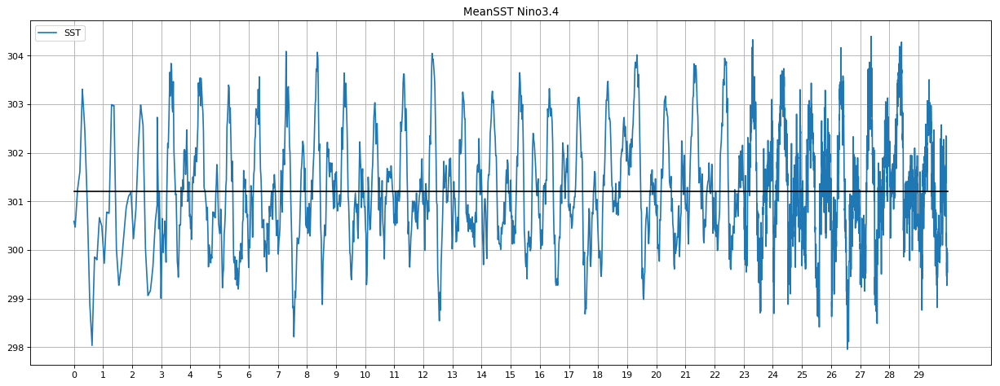

In [51]:
years = 30
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(SSTtrop[0:365*years,10,4])
mm = np.mean(SSTtrop[0:365*years,10,4])
plt.plot([0,365*years],[mm,mm],'k')

ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid('on')
plt.title('MeanSST Nino3.4')
plt.legend(['SST'], loc='upper left')
plt.show()

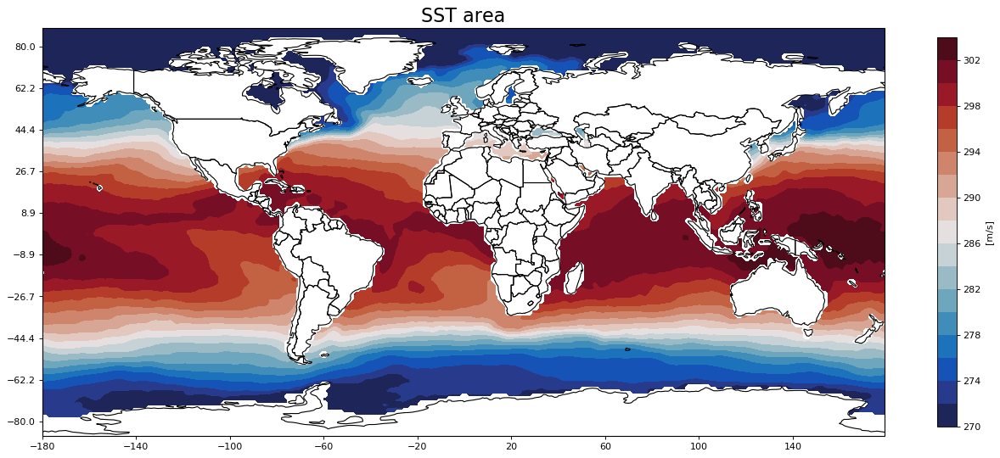

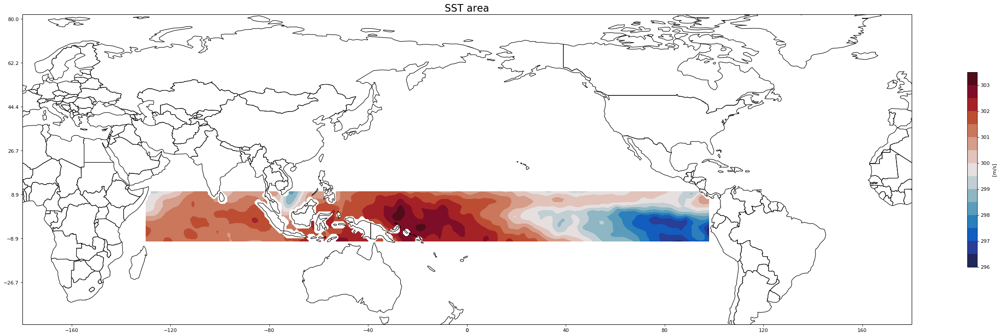

In [52]:

############################################

proj = ccrs.PlateCarree()
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
# ax.set_extent([-180, -46, 10, 70])

# scales =np.amax(np.abs(trendPlot))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonSST,latSST,SSTo,15,cmap=mappper)
cbar = plt.colorbar(ax = ax, shrink=0.38)
cbar.set_label('[m/s]',fontsize=10)
plt.title('SST area',fontsize=20)
plt.show()



############################################

proj = ccrs.PlateCarree(central_longitude=180)
plt.figure(figsize=(40,40), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-180-90, -46, -20, 70])

# scales =np.amax(np.abs(trendPlot))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonTrop,latTrop,SSTtrop[0,:,:],15,cmap=mappper)
cbar = plt.colorbar(ax = ax, shrink=0.18)
cbar.set_label('[m/s]',fontsize=10)
plt.title('SST area',fontsize=20)
plt.show()



In [53]:
## Demean and Detrend
SSTtrendPlot = np.zeros([SSTtrop.shape[1],SSTtrop.shape[2]])
SSTtrop_a = np.zeros(SSTtrop.shape)
N = 14

for ii in range(SSTtrendPlot.shape[0]):
    if ii % 10 == 0:
        print("latitude #:", ii,"of:",SSTtrendPlot.shape[0])
    for jj in range(SSTtrendPlot.shape[1]):
        [ms,ss] = removeSC(SSTtrop[:,ii,jj])
        SSTtrendPlot[ii,jj] = ss[1]
        SSTtropm = SSTtrop[:,ii,jj] - ms
        #now do 7day running mean
        SSTtrop_a[:,ii,jj] = pd.Series(SSTtropm).rolling(window=N,center=True,min_periods=1).mean().values 
  

latitude #: 0 of: 21
latitude #: 10 of: 21
latitude #: 20 of: 21


In [54]:
latTrop.shape

(21,)

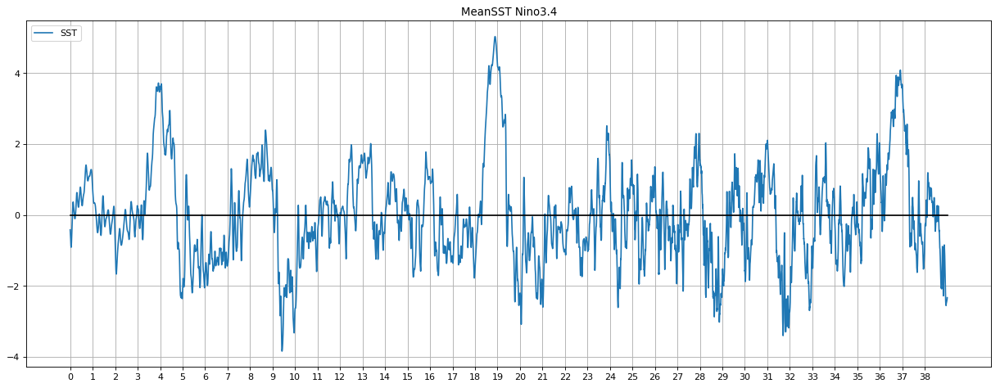

In [55]:
# # Sanity Check SST trop anom 

years = 39
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(SSTtrop_a[0:365*years,10,200])
mm = np.mean(SSTtrop_a[0:365*years,10,200])
plt.plot([0,365*years],[mm,mm],'k')

ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid('on')
plt.title('MeanSST Nino3.4')
plt.legend(['SST'], loc='upper left')
plt.show()

In [56]:
#  Read SST anomalies using the netCDF4 module. The file contains
# November-March averages of SST anomaly in the central and northern Pacific.

# Create an EOF solver to do the EOF analysis. Square-root of cosine of
# latitude weights are applied before the computation of EOFs.
coslat = np.cos(np.deg2rad(latTrop))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solver = Eof(SSTtrop_a,weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')

16.547348976135254 Seconds


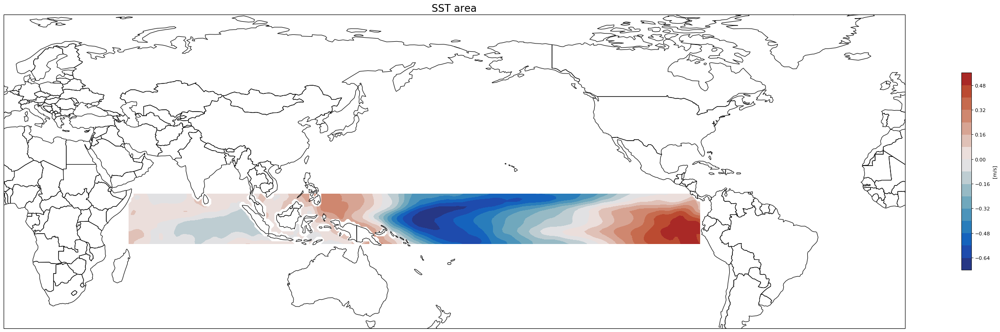

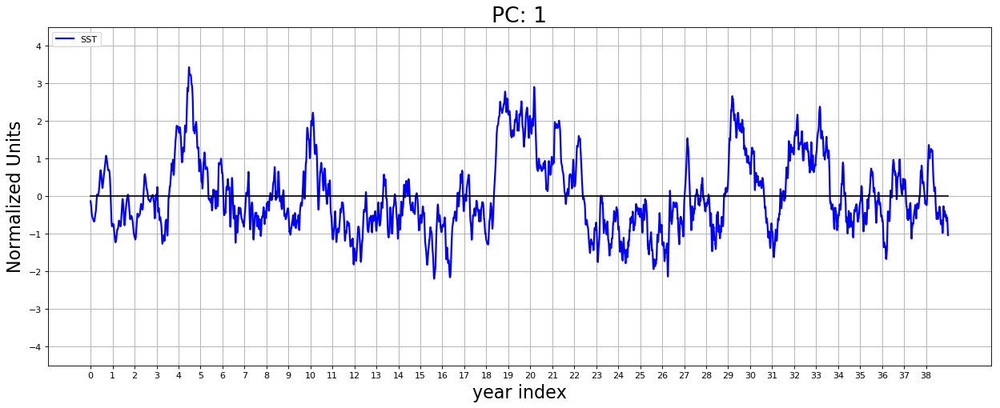

In [57]:
numdo=1
############################################
eoftrop = solver.eofsAsCorrelation(neofs=5)
pctrop = solver.pcs(npcs=5, pcscaling=1)

proj = ccrs.PlateCarree(central_longitude=180)
plt.figure(figsize=(40,40), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

# ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
# ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-180-90, -46, -20, 70])

scales = np.nanmax(np.abs(eof1[numdo,:,:]))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonTrop,latTrop,eoftrop[numdo,:,:],15,cmap=mappper,vmin=-scales,vmax=scales)
cbar = plt.colorbar(ax = ax, shrink=0.18)
cbar.set_label('[m/s]',fontsize=10)
plt.title('SST area',fontsize=20)
plt.show()

# Plot the leading PC time series.

years = 39
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(pctrop[0:365*years,numdo], color='b', linewidth=2)

mm = np.mean(pctrop[0:365*years,numdo])
plt.plot([0,365*years],[mm,mm],'k')

ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid('on')
plt.title('PC: %i' %numdo,FontSize=24)
plt.legend(['SST'], loc='upper left')
plt.ylim(-4.5, 4.5)
plt.ylabel('Normalized Units',FontSize=20)
plt.xlabel('year index',FontSize=20)
plt.show()




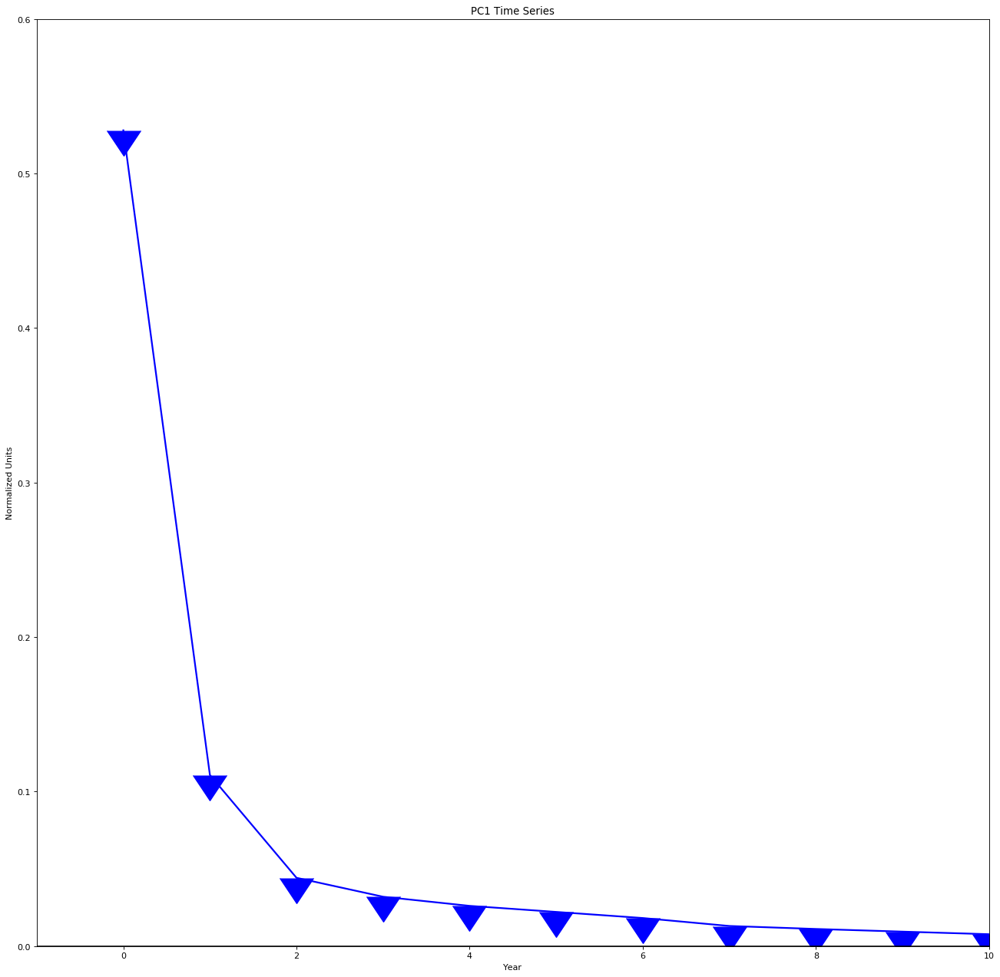

In [58]:
variance_fractions = solver.varianceFraction()

# Plot the leading PC time series.
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(variance_fractions, color='b', linewidth=2,marker=11,markersize=40)
plt.axhline(0, color='k')
plt.title('PC1 Time Series')
plt.xlabel('Year')
plt.ylabel('Normalized Units')
plt.ylim(0, .6)
plt.xlim(-1, 10)

plt.show()

In [59]:
dataPCS = {'PC1trop':pctrop[:,0],'PC2trop':pctrop[:,1], 'PC3trop':pctrop[:,2],'PC4trop':pctrop[:,3],'PC5trop':pctrop[:,4]}
dfPCStrop = pd.DataFrame(dataPCS) 
dfPCStrop
dfPCStrop = dfPCStrop.join(dfSST['year'])
dfPCStrop = dfPCStrop.join(dfSST['month'])
dfPCStrop = dfPCStrop.join(dfSST['day'])
dfPCStrop.head()

,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,year,month,day
0,-0.068816,-0.129000,-1.018307,0.580870,1.033433,1979.0,1.0,1.0
1,-0.071627,-0.141555,-1.005122,0.604250,1.056608,1979.0,1.0,2.0
2,-0.074541,-0.154099,-0.992376,0.627738,1.079378,1979.0,1.0,3.0
3,-0.077483,-0.166527,-0.980163,0.651163,1.101899,1979.0,1.0,4.0
4,-0.080540,-0.178970,-0.968499,0.674732,1.123989,1979.0,1.0,5.0


In [60]:
dfAAAAA = pd.merge(left=dfAAAA,right=dfPCStrop, how='left', left_on=['year','month','day'], 
                   right_on=['year','month','day'])


In [61]:
dfAAAAA.head()

,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S,PC1t2m,PC2t2m,PC3t2m,PC4t2m,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453,-0.328969,0.526346,0.712883,0.967075,0.544819,-0.763900,-0.432363,-0.296708,-0.262305
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016,0.103770,0.624242,1.079661,1.101621,0.540626,-0.760600,-0.435322,-0.255158,-0.278281
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2,5,0.663776,0.662733,0.037199,-0.980248,-0.239086,0.394198,0.809016,1.404137,1.055968,0.536102,-0.757366,-0.439763,-0.213668,-0.295370
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2,5,0.650896,0.614840,0.213630,-0.980062,-0.229728,0.356422,0.735428,1.672939,1.112869,0.531351,-0.754181,-0.445785,-0.172142,-0.313580
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2,5,0.857257,0.702877,0.490769,-0.979840,-0.215738,0.427306,0.531887,1.924475,1.018130,0.526277,-0.750966,-0.453187,-0.130679,-0.332916


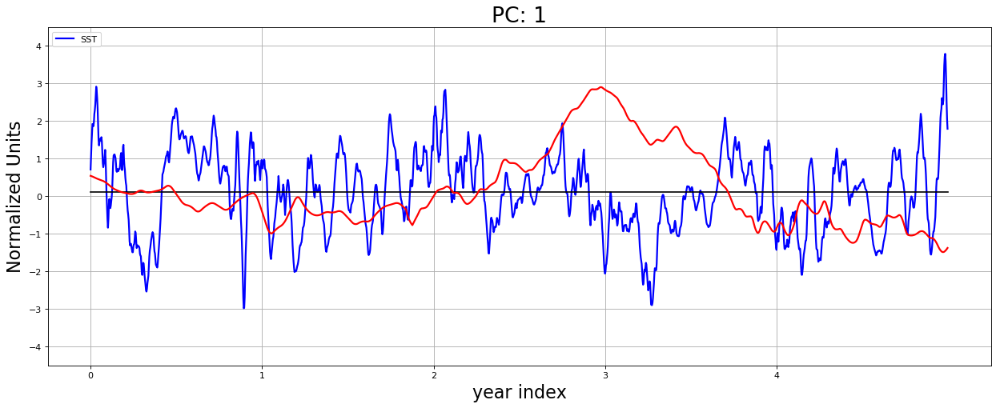

In [62]:
years = 5
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(dfAAAAA['PC3t2m'][0:365*years], color='b', linewidth=2)

mm = np.mean(dfAAAAA['PC3t2m'][0:365*years])
plt.plot([0,365*years],[mm,mm],'k')

plt.plot(dfAAAAA['PC1trop'][0:365*years], color='r', linewidth=2)

ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid('on')
plt.title('PC: %i' %numdo,FontSize=24)
plt.legend(['SST'], loc='upper left')
plt.ylim(-4.5, 4.5)
plt.ylabel('Normalized Units',FontSize=20)
plt.xlabel('year index',FontSize=20)
plt.show()




In [63]:
np.corrcoef(dfAAAAA['PC3t2m'][0:365*years],dfAAAAA['PC1trop'][0:365*years])

array([[ 1.        , -0.17026678],
       [-0.17026678,  1.        ]])

## Now the North pacific

In [64]:
SSTfilename = '/data/downloaded/Forecasts/ECMWF/S2S_ML/MERRA2/SST_global_onedeg_1979_2019.nc'
f = Dataset(SSTfilename)

latTropn = f.variables['lat'][:] 
lonTropn = f.variables['lon'][:]

latTropE = [-20,65]
lonTropE = [95,180]

latTropW = [-20,65]
lonTropW = [-180,-90]

latSTe = np.argmin(np.abs(latTropn - latTropE[0])).astype(int)
latENe = np.argmin(np.abs(latTropn - latTropE[-1])).astype(int)
lonSTe = np.argmin(np.abs(lonTropn - lonTropE[0])).astype(int)
lonENe = np.argmin(np.abs(lonTropn - lonTropE[-1])).astype(int)

latSTw = np.argmin(np.abs(latTropn - latTropW[0])).astype(int)
latENw = np.argmin(np.abs(latTropn - latTropW[-1])).astype(int)
lonSTw = np.argmin(np.abs(lonTropn - lonTropW[0])).astype(int)
lonENw = np.argmin(np.abs(lonTropn - lonTropW[-1])).astype(int)

SSTe = f.variables['SST'][:,latSTe:latENe+1,lonSTe:lonENe+1]
SSTw = f.variables['SST'][:,latSTw:latENw+1,lonSTw:lonENw+1]
SSTnp = np.concatenate((SSTe,SSTw),axis=2)

latNP = latTropn[latSTe:latENe+1]
lonT1 = lonTropn[lonSTe:lonENe+1]-180
lonT2 = lonTropn[lonSTw:lonENw+1]+180

lonNP = np.concatenate((lonT1,lonT2))



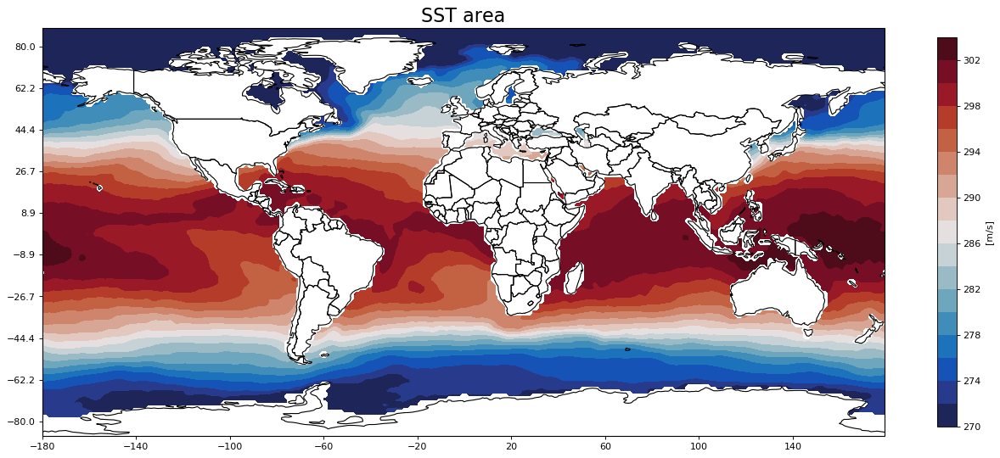

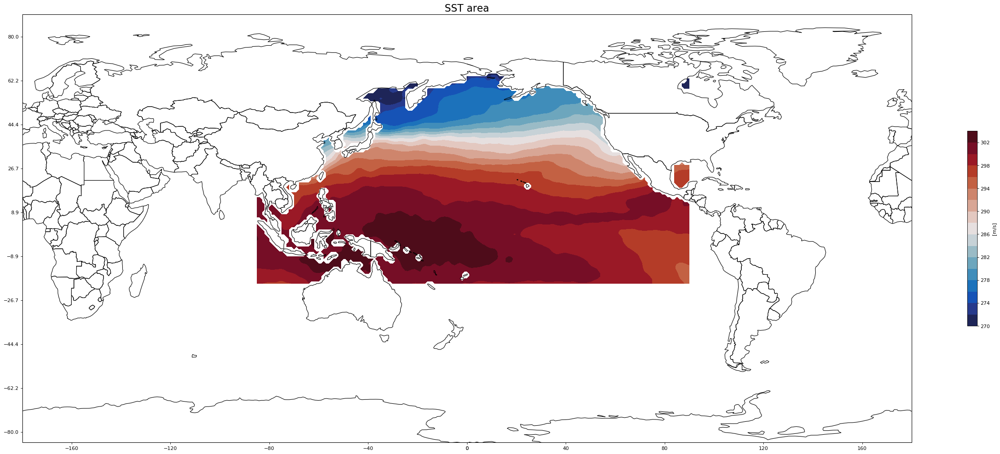

In [65]:

############################################

proj = ccrs.PlateCarree()
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
# ax.set_extent([-180, -46, 10, 70])

# scales =np.amax(np.abs(trendPlot))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonSST,latSST,SSTo,15,cmap=mappper)
cbar = plt.colorbar(ax = ax, shrink=0.38)
cbar.set_label('[m/s]',fontsize=10)
plt.title('SST area',fontsize=20)
plt.show()



############################################

proj = ccrs.PlateCarree(central_longitude=180)
plt.figure(figsize=(40,40), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-140-90, -46, -20, 70])

# scales =np.amax(np.abs(trendPlot))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonNP,latNP,SSTnp[0,:,:],15,cmap=mappper)
cbar = plt.colorbar(ax = ax, shrink=0.18)
cbar.set_label('[m/s]',fontsize=10)
plt.title('SST area',fontsize=20)
plt.show()



In [66]:
## Demean and Detrend
SSTtrendPlot = np.zeros([SSTnp.shape[1],SSTnp.shape[2]])
SSTnp_a = np.zeros(SSTnp.shape)
N = 14

for ii in range(SSTtrendPlot.shape[0]):
    if ii % 10 == 0:
        print("latitude #:", ii,"of:",SSTtrendPlot.shape[0])
    for jj in range(SSTtrendPlot.shape[1]):
        [ms,ss] = removeSC(SSTnp[:,ii,jj])
        SSTtrendPlot[ii,jj] = ss[1]
        SSTnpm = SSTnp[:,ii,jj] - ms
        #now do 7day running mean
        SSTnp_a[:,ii,jj] = pd.Series(SSTnpm).rolling(window=N,center=True,min_periods=1).mean().values 
  

latitude #: 0 of: 86
latitude #: 10 of: 86
latitude #: 20 of: 86
latitude #: 30 of: 86
latitude #: 40 of: 86
latitude #: 50 of: 86
latitude #: 60 of: 86
latitude #: 70 of: 86
latitude #: 80 of: 86


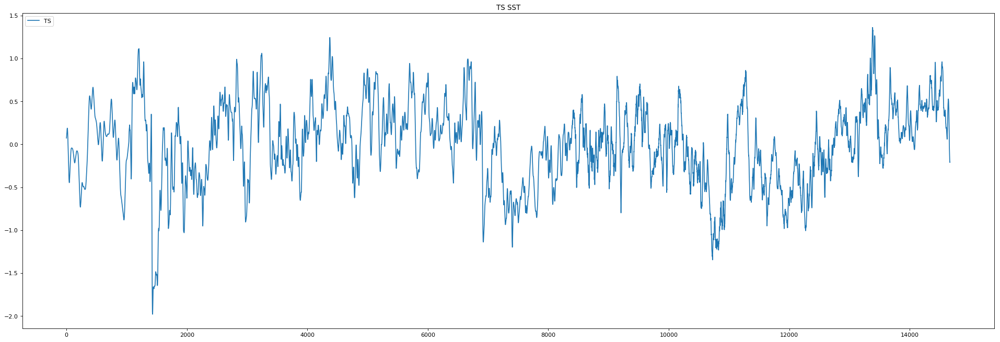

In [67]:
# Sanity Check SST np anom 
plt.figure(figsize=(30,10), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(SSTnp_a[:,30,100])

plt.title('TS SST')
plt.legend(['TS','Model'], loc='upper left')
plt.show()

In [68]:
#  Read SST anomalies using the netCDF4 module. The file contains
# November-March averages of SST anomaly in the central and northern Pacific.

# Create an EOF solver to do the EOF analysis. Square-root of cosine of
# latitude weights are applied before the computation of EOFs.
coslat = np.cos(np.deg2rad(latNP))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solver = Eof(SSTnp_a,weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')

184.76560640335083 Seconds


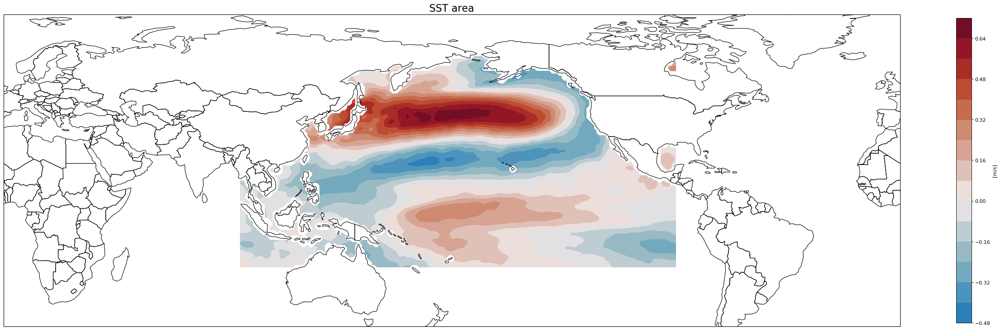

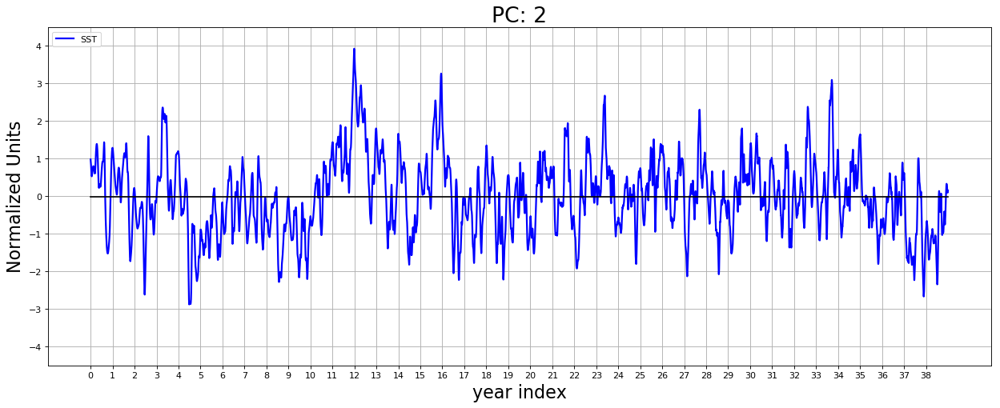

In [69]:
numdo=2
############################################
eofNP = solver.eofsAsCorrelation(neofs=5)
pcNP = solver.pcs(npcs=5, pcscaling=1)

proj = ccrs.PlateCarree(central_longitude=180)
plt.figure(figsize=(40,40), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

# ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
# ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-180-90, -46, -20, 70])

scales = np.nanmax(np.abs(eof1[numdo,:,:]))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonNP,latNP,eofNP[numdo,:,:],15,cmap=mappper,vmin=-scales,vmax=scales)
cbar = plt.colorbar(ax = ax, shrink=0.28)
cbar.set_label('[m/s]',fontsize=10)
plt.title('SST area',fontsize=20)
plt.show()

# Plot the leading PC time series.

years = 39
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(pcNP[0:365*years,numdo], color='b', linewidth=2)
mm = np.mean(pcNP[0:365*years,numdo])
plt.plot([0,365*years],[mm,mm],'k')
ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid('on')
plt.title('PC: %i' %numdo,FontSize=24)
plt.legend(['SST'], loc='upper left')
plt.ylim(-4.5, 4.5)
plt.ylabel('Normalized Units',FontSize=20)
plt.xlabel('year index',FontSize=20)
plt.show()


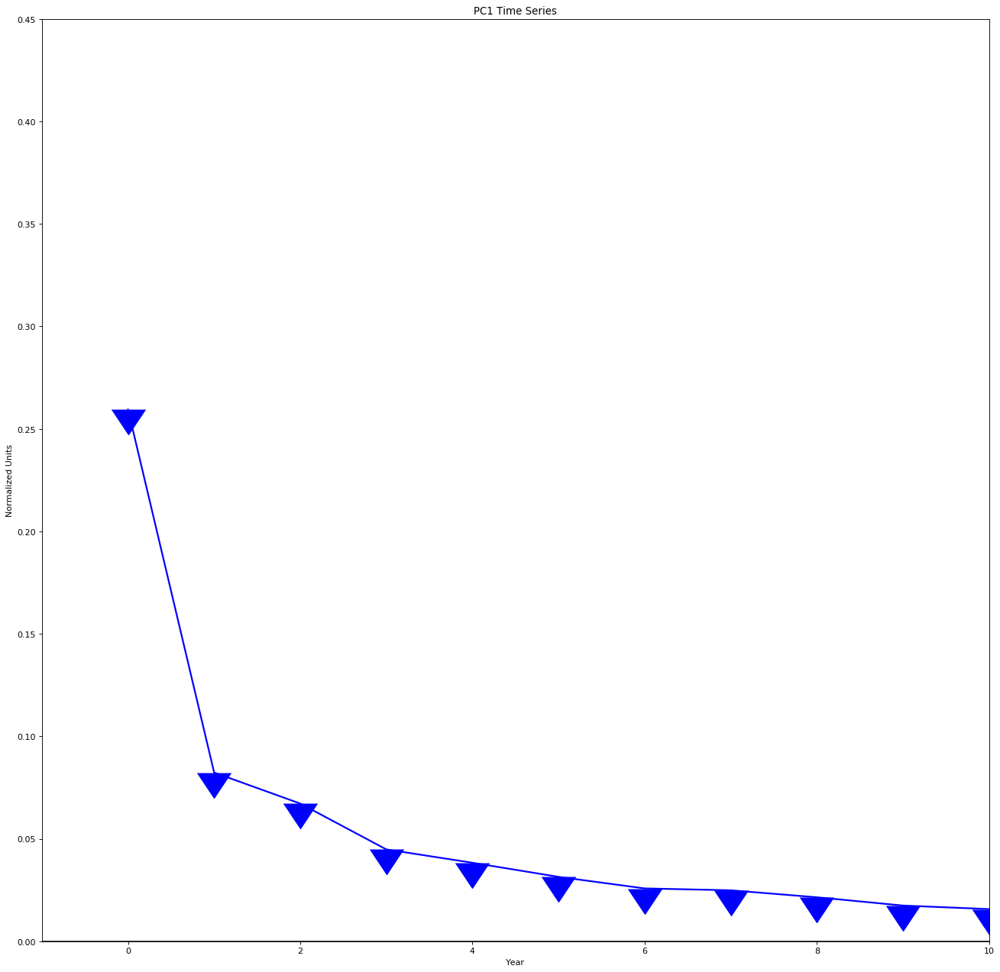

In [70]:
variance_fractions = solver.varianceFraction()

# Plot the leading PC time series.
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(variance_fractions, color='b', linewidth=2,marker=11,markersize=40)
plt.axhline(0, color='k')
plt.title('PC1 Time Series')
plt.xlabel('Year')
plt.ylabel('Normalized Units')
plt.ylim(0, .45)
plt.xlim(-1, 10)

plt.show()

In [71]:
dataPCS = {'PC1np':pcNP[:,0],'PC2np':pcNP[:,1], 'PC3np':pcNP[:,2],'PC4np':pcNP[:,3],'PC5np':pcNP[:,4]}
dfPCSNP = pd.DataFrame(dataPCS) 
dfPCSNP
dfPCSNP = dfPCSNP.join(dfSST['year'])
dfPCSNP = dfPCSNP.join(dfSST['month'])
dfPCSNP = dfPCSNP.join(dfSST['day'])
dfPCSNP.head()

,PC1np,PC2np,PC3np,PC4np,PC5np,year,month,day
0,0.128878,0.312598,0.982603,0.509146,0.144033,1979.0,1.0,1.0
1,0.128374,0.322321,0.963559,0.492668,0.127021,1979.0,1.0,2.0
2,0.128007,0.332080,0.944347,0.476481,0.110363,1979.0,1.0,3.0
3,0.127708,0.341678,0.924686,0.460877,0.093698,1979.0,1.0,4.0
4,0.127559,0.351121,0.904515,0.445781,0.076606,1979.0,1.0,5.0


In [72]:
dfAAAAAA = pd.merge(left=dfAAAAA,right=dfPCSNP, how='left', left_on=['year','month','day'], 
                   right_on=['year','month','day'])
dfAAAAAA =dfAAAAAA.dropna()

## Now we make our model

In [73]:
X1 =dfAAAAAA.iloc[:,4:11]
X2 =dfAAAAAA.iloc[:,15:-1]
X = X1.join(X2)
Y = dfAAAAAA.iloc[:,11:15]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.10, random_state=42)

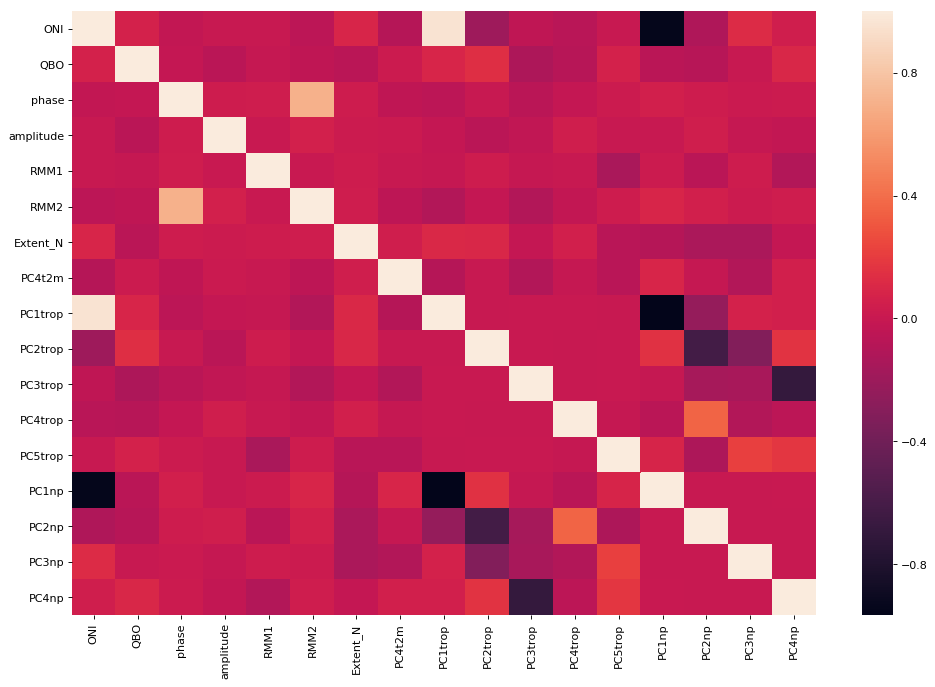

In [74]:
import seaborn as sns
plt.figure(figsize=(15,10), dpi= 80, facecolor='w', edgecolor='k')

corrA = X_train.corr()
sns.heatmap(corrA, 
            xticklabels=corrA.columns.values,
            yticklabels=corrA.columns.values)
plt.show()

In [75]:
#shuffle data 
X_train, y_train = shuffle(X_train,  y_train, random_state=0)
X_test.shape[1]

17

In [167]:
conv_activation = "relu"
learning_rate = 0.001

# Input data in shape (instance, y, x, variable)
dense_net_in = Input(shape=X_train.shape[1:])
# Flatten the last convolutional layer into a long feature vector
# Dense output layer, equivalent to a logistic regression on the last layer
conv_net = Dense(100)(dense_net_in)
conv_net = Activation(conv_activation)(conv_net)
conv_net = Dense(100)(conv_net)
conv_net = Activation(conv_activation)(conv_net)
# conv_net = BatchNormalization()(conv_net)
conv_net = Dense(100)(conv_net)
conv_net = Activation(conv_activation)(conv_net)
conv_net = BatchNormalization()(conv_net)
conv_net = Dense(200)(conv_net)
conv_net = Activation(conv_activation)(conv_net)
conv_net = Dense(200)(conv_net)
conv_net = Activation(conv_activation)(conv_net)
conv_net = Dense(200)(conv_net)
conv_net = Activation(conv_activation)(conv_net)
conv_net = Dense(y_train.shape[1])(conv_net)
conv_net = Activation("linear")(conv_net)
conv_model = Model(dense_net_in, conv_net)


# Use the Adam optimizer with default parameters
opt = Adam(lr=learning_rate)
conv_model.compile(opt, "mse")

conv_model.summary()



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 16)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 100)               1700      
_________________________________________________________________
activation_7 (Activation)    (None, 100)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 100)               10100     
_________________________________________________________________
activation_8 (Activation)    (None, 100)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 100)               10100     
_________________________________________________________________
activation_9 (Activation)    (None, 100)               0         
__________

In [76]:
## train model:  

## And Set Up Model Params: 

In [4]:
# Variable names.
oni = 'ONI'
MJO1 = 'RMM1'
MJO2 = 'RMM2'
pMJO = 'phase'
mMJO = 'amplitude'
iN = 'Extent_N'
iS = 'Extent_S'
PCt1 = 'PC1trop'
PCt2 = 'PC2trop'
PCt3 = 'PC3trop'
PCt4 = 'PC4trop'
PCt5 = 'PC5trop'
PCn1 = 'PC1np'
PCn2 = 'PC2np'
PCn3 = 'PC3np'
PCn4 = 'PC4np'
PCn5 = 'PC5np'

# NETCDF_V_WIND_NAME = 'V10_curr'

NETCDF_PREDICTOR_NAMES = [
    MJO1, MJO2,pMJO,mMJO,iN,iS,PCt1,PCt2,PCt3,PCt4,PCt5,PCn1,PCn2,PCn3,PCn4,oni,PCn5
]

NETCDF_PREDICTOR_NAMES = [
    mMJO,iN,iS,PCt1,PCt2,PCt3,PCt4,PCt5,PCn1,PCn2,PCn3,PCn4,PCn5
]

NETCDF_TARGET_NAMES = 'v10_hourly_out'

# Target Variable names.
PC1 = 'PC1t2m'
PC2 = 'PC2t2m'
PC3 = 'PC3t2m'
PC4 = 'PC4t2m'
PC5 = 'PC5t2m'

TARGET_NAMES = [
    PC1,PC2,PC3,PC4,PC5
]


# # Target Variable names.
# AnomT2M = 'AnomT2M'

# TARGET_NAMES = [
#     AnomT2M
# ]

# PREDICTOR_NAMES = [
#     MAT_Uin, MAT_Vin
# ]

DIR_NAME = '.'

MIN_XENTROPY_DECREASE_FOR_EARLY_STOP = 0.005
MIN_MSE_DECREASE_FOR_EARLY_STOP = 0.00001
NUM_EPOCHS_FOR_EARLY_STOPPING = 10
NUM_EPOCHS_FOR_REDUCE_LR = 5
FACTOR_REDUCE_LR = 0.7
MIN_LR_REDUCE_TO = 0.00005
MIN_MSE_DECREASE_FOR_REDUCE_LR = 0.0001

PREDICTOR_NAMES_KEY = 'predictor_names'
PREDICTOR_MATRIX_KEY = 'predictor_matrix'
TARGET_NAME_KEY = 'target_name'
TARGET_MATRIX_KEY = 'target_matrix'

TRAINING_FILES_KEY = 'training_file_names'
NORMALIZATION_DICT_KEY = 'normalization_dict'
TARGET_DICT_KEY = 'target_dict'
BINARIZATION_THRESHOLD_KEY = 'binarization_threshold'
NUM_EXAMPLES_PER_BATCH_KEY = 'num_examples_per_batch'
NUM_TRAINING_BATCHES_KEY = 'num_training_batches_per_epoch'
VALIDATION_FILES_KEY = 'validation_file_names'
NUM_VALIDATION_BATCHES_KEY = 'num_validation_batches_per_epoch'
CNN_FILE_KEY = 'cnn_file_name'
CNN_FEATURE_LAYER_KEY = 'cnn_feature_layer_name'


# Machine-learning constants.
L1_WEIGHT = 0.0
L2_WEIGHT = 0.01
NUM_PREDICTORS_TO_FIRST_NUM_FILTERS = 2
NUM_CONV_LAYER_SETS = 0
NUM_CONV_LAYERS_PER_SET = 0
NUM_CONV_FILTER_ROWS = 0
NUM_CONV_FILTER_COLUMNS = 0
CONV_LAYER_DROPOUT_FRACTION = None
USE_BATCH_NORMALIZATION = True
SLOPE_FOR_RELU = 0.1
NUM_POOLING_ROWS = 0
NUM_POOLING_COLUMNS = 0
NUM_DENSE_LAYERS = 9
DENSE_LAYER_DROPOUT_FRACTION = 0.2

LIST_OF_METRIC_FUNCTIONS = [
    keras_metrics.accuracy
]

METRIC_FUNCTION_DICT = {
    'accuracy': keras_metrics.accuracy,
}


In [5]:
def setup_dense(X_test,num_outputs_by_dense_layer,num_classes):
    """Sets up (but does not train) DNN (dense neural net).
    :param num_grid_rows: Number of rows in each predictor image.
    :param num_grid_columns: Number of columns in each predictor image.
    :return: dense_model_object: Untrained instance of `keras.models.Model`.
    """

#     regularizer_object = keras.regularizers.l1_l2(l1=L1_WEIGHT, l2=L2_WEIGHT)

    num_predictors = X_test.shape[1]
    input_layer_object = keras.layers.Input(
        shape=((num_predictors,))
    )

    current_num_filters = None
    current_layer_object = input_layer_object
    
    current_layer_object = input_layer_object
    these_dimensions = np.array(current_layer_object.get_shape().as_list()[1:], dtype=int)
    num_features = np.prod(these_dimensions)

    for k in range(NUM_DENSE_LAYERS - 1):
#         current_layer_object = keras.layers.Dense(
#             num_outputs_by_dense_layer[k], activation=None, use_bias=True,
#             kernel_initializer='glorot_uniform', bias_initializer='zeros',
#             kernel_regularizer=regularizer_object
#         )(current_layer_object)
        
        current_layer_object = keras.layers.Dense(
            num_outputs_by_dense_layer[k], activation=None, use_bias=True,
            kernel_initializer='glorot_uniform', bias_initializer='zeros'
        )(current_layer_object)

        current_layer_object = keras.layers.LeakyReLU(
            alpha=SLOPE_FOR_RELU
        )(current_layer_object)

        if DENSE_LAYER_DROPOUT_FRACTION is not None:
            current_layer_object = keras.layers.Dropout(
                rate=DENSE_LAYER_DROPOUT_FRACTION
            )(current_layer_object)

        if USE_BATCH_NORMALIZATION:
            current_layer_object = keras.layers.BatchNormalization(
                axis=-1, center=True, scale=True
            )(current_layer_object)

    # Add output layer (also dense).
#     current_layer_object = keras.layers.Dense(
#         num_classes, activation=None, use_bias=True,
#         kernel_initializer='glorot_uniform', bias_initializer='zeros',
#         kernel_regularizer=regularizer_object
#     )(current_layer_object)
    
    current_layer_object = keras.layers.Dense(
        num_classes, activation=None, use_bias=True,
        kernel_initializer='glorot_uniform', bias_initializer='zeros'
    )(current_layer_object)

    current_layer_object = keras.layers.Activation(
        'softmax'
    )(current_layer_object)

    if DENSE_LAYER_DROPOUT_FRACTION is not None and NUM_DENSE_LAYERS == 1:
        current_layer_object = keras.layers.Dropout(
            rate=DENSE_LAYER_DROPOUT_FRACTION
        )(current_layer_object)
        
    

    # Put the whole thing together and compile.
    cnn_model_object = keras.models.Model(
        inputs=input_layer_object, outputs=current_layer_object)

    cnn_model_object.compile(
        loss=keras.losses.categorical_crossentropy,
        optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

    cnn_model_object.summary()
    return cnn_model_object

In [6]:
def read_keras_model(hdf5_file_name):
    """Reads Keras model from HDF5 file.
    :param hdf5_file_name: Path to input file.
    :return: model_object: Instance of `keras.models.Model`.
    """

    return keras.models.load_model(
        hdf5_file_name, custom_objects=METRIC_FUNCTION_DICT)

In [7]:
def apply_cnn(cnn_model_object, predictor_matrix, verbose=True,
              output_layer_name=None):
    """Applies trained CNN (convolutional neural net) to new data.
    E = number of examples (
    M = number of rows in eachgrid
    N = number of columns in each grid
    C = number of channels (predictor variables)

    :param cnn_model_object: Trained instance of `keras.models.Model`.
    :param predictor_matrix: E-by-M-by-N-by-C numpy array of predictor values.
    :param verbose: Boolean flag.  If True, progress messages will be printed.
    :param output_layer_name: Name of output layer.  If
        `output_layer_name is None`, this method will use the actual output
        layer, so will return predictions.  If `output_layer_name is not None`,
        will return "features" (outputs from the given layer).
    If `output_layer_name is None`...
    :return: forecast_probabilities: length-E numpy array with forecast
        probabilities of positive class (label = 1).
    If `output_layer_name is not None`...
    :return: feature_matrix: numpy array of features (outputs from the given
        layer).  There is no guarantee on the shape of this array, except that
        the first axis has length E.
    """

    num_examples = predictor_matrix.shape[0]
    num_examples_per_batch = 40

    if output_layer_name is None:
        model_object_to_use = cnn_model_object
    else:
        model_object_to_use = keras.models.Model(
            inputs=cnn_model_object.input,
            outputs=cnn_model_object.get_layer(name=output_layer_name).output
        )

    output_array = None

    for i in range(0, num_examples, num_examples_per_batch):
        this_first_index = i
        this_last_index = min(
            [i + num_examples_per_batch - 1, num_examples - 1]
        )

        if verbose:
            print('Applying model to examples {0:d}-{1:d} of {2:d}...'.format(
                this_first_index, this_last_index, num_examples
            ))

        these_indices = numpy.linspace(
            this_first_index, this_last_index,
            num=this_last_index - this_first_index + 1, dtype=int)

        this_output_array = model_object_to_use.predict(
            predictor_matrix[these_indices, ...],
            batch_size=num_examples_per_batch)

        if output_layer_name is None:
            this_output_array = this_output_array

        if output_array is None:
            output_array = this_output_array + 0.
        else:
            output_array = numpy.concatenate(
                (output_array, this_output_array), axis=0
            )

    return output_array

In [8]:
def _create_directory(directory_name=None, file_name=None):
    """Creates directory (along with parents if necessary).
    This method creates directories only when necessary, so you don't have to
    worry about it overwriting anything.
    :param directory_name: Name of desired directory.
    :param file_name: [used only if `directory_name is None`]
        Path to desired file.  All directories in path will be created.
    """

    if directory_name is None:
        directory_name = os.path.split(file_name)[0]

    try:
        os.makedirs(directory_name)
    except OSError as this_error:
        if this_error.errno == errno.EEXIST and os.path.isdir(directory_name):
            pass
        else:
            raise

In [9]:
def train_nn(nn_model_object,train_x,train_y, num_epochs,
        batch_nums, output_model_file_name,X_val,Y_val):
    """Trains NN (neural net).
    :param nn_model_object: Untrained instance of `keras.models.Model` (may be
        created by `setup_cnn`).
    :param training_file_names: 1-D list of paths to training files (must be
        readable by `read_image_file`).
    :param normalization_dict: See doc for `deep_learning_generator`.
    :param num_examples_per_batch: Same.
    :param num_epochs: Number of epochs.
    :param num_training_batches_per_epoch: Number of training batches furnished
        to model in each epoch.
    :param output_model_file_name: Path to output file.  The model will be saved
        as an HDF5 file (extension should be ".h5", but this is not enforced).
    :param validation_file_names: 1-D list of paths to training files (must be
        readable by `read_image_file`).  If `validation_file_names is None`,
        will omit on-the-fly validation.
    :param num_validation_batches_per_epoch:
        [used only if `validation_file_names is not None`]
        Number of validation batches furnished to model in each epoch.
    :return: cnn_metadata_dict: Dictionary with the following keys.
    cnn_metadata_dict['training_file_names']: See input doc.
    cnn_metadata_dict['normalization_dict']: Same.
    cnn_metadata_dict['binarization_threshold']: Same.
    cnn_metadata_dict['num_examples_per_batch']: Same.
    cnn_metadata_dict['num_training_batches_per_epoch']: Same.
    cnn_metadata_dict['validation_file_names']: Same.
    cnn_metadata_dict['num_validation_batches_per_epoch']: Same.
    """

    _create_directory(file_name=output_model_file_name)

    
    checkpoint_object = keras.callbacks.ModelCheckpoint(
        filepath=output_model_file_name, monitor='val_acc', verbose=1,
        save_best_only=True, save_weights_only=False, mode='max',
        period=1)

    list_of_callback_objects = [checkpoint_object]

    early_stopping_object = keras.callbacks.EarlyStopping(
        monitor='val_acc', min_delta=MIN_MSE_DECREASE_FOR_EARLY_STOP,
        patience=NUM_EPOCHS_FOR_EARLY_STOPPING, verbose=1, mode='max')

    list_of_callback_objects.append(early_stopping_object)

    reduce_on_plateau_object = keras.callbacks.ReduceLROnPlateau(
        monitor='val_acc', min_delta=MIN_MSE_DECREASE_FOR_REDUCE_LR,factor = FACTOR_REDUCE_LR,
        patience=NUM_EPOCHS_FOR_REDUCE_LR, verbose=1, mode='max',min_lr=MIN_LR_REDUCE_TO)

    list_of_callback_objects.append(reduce_on_plateau_object)

    nn_model_object.fit(
        train_x,
        train_y,
        batch_size = batch_nums,
        epochs=num_epochs,
        verbose=1, 
        callbacks=list_of_callback_objects,
        validation_data=(X_val,Y_val))

    return

In [10]:
# outfilename = '/home/wchapman/S2S/T2mENSOmjo/models/test_dense_MSE.h5'

# train_nn(dense_model,X_train,y_train,60,40,outfilename,(X_train,y_train))

1
2
3
4
5
6
7
8
9
10
11
12
latitude #: 0 of: 53
latitude #: 30 of: 53


/home/wchapman/.conda/envs/MJOenso/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


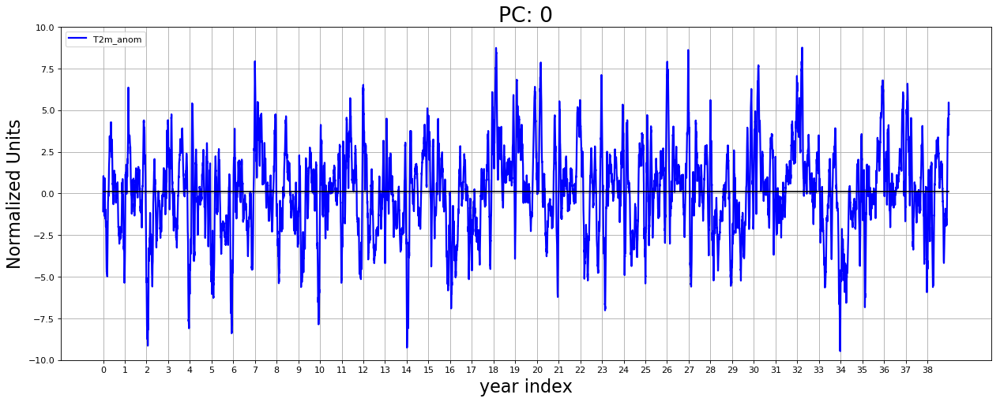

In [83]:
# Month Day climatology 1981-2010: 
# Climo_T2m = np.zeros(shape)
numdo=0
dayClimo=[]
monClimo=[]

T2mClimo = np.zeros([366,T2m.shape[1],T2m.shape[2]])
T2m_MeanAnom = np.zeros(T2m.shape)


count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(df.loc[(df['month'] == ii) & (df['day'] ==jj)& (df['year']<2010)].index.tolist())
        indicT2m = np.array(df.loc[(df['month'] == ii) & (df['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        T2mClimo[count,:,:]= np.nanmean(T2m[indicMONDAY,:,:],axis=0)
        T2m_MeanAnom[indicT2m,:,:] = T2m[indicT2m,:,:] - T2mClimo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 

## Demean and Detrend
N = 30
for ii in range(T2m_MeanAnom.shape[1]):
    if ii % 30 == 0:
        print("latitude #:", ii,"of:",T2m_MeanAnom.shape[1])
    for jj in range(T2m_MeanAnom.shape[2]):
        #now do 14day running mean
        T2m_MeanAnom[:,ii,jj] = pd.Series(T2m_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values 

        
years = 39
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(T2m_MeanAnom[:,ii,jj][0:365*years], color='b', linewidth=2)

mm = np.mean(T2m_MeanAnom[:,ii,jj][0:365*years])
plt.plot([0,365*years],[mm,mm],'k')

# plt.plot(dfAAAAA['PC2trop'][0:365*years], color='r', linewidth=2)

ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid('on')
plt.title('PC: %i' %numdo,FontSize=24)
plt.legend(['T2m_anom'], loc='upper left')
plt.ylim(-10, 10)
plt.ylabel('Normalized Units',FontSize=20)
plt.xlabel('year index',FontSize=20)
plt.show()


In [84]:
dfClimo.head()

,day,month
0,1.0,1.0
1,2.0,1.0
2,3.0,1.0
3,4.0,1.0
4,5.0,1.0


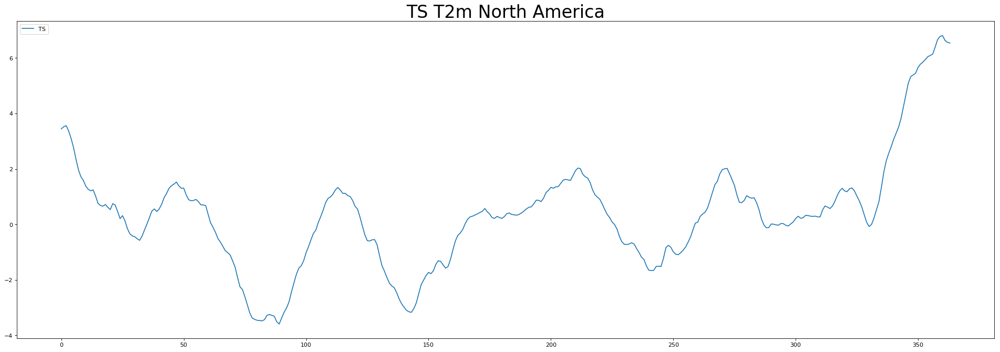

39.0
-111.25


In [85]:
# Sanity Check T2m np anom 
plt.figure(figsize=(30,10), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(T2m_MeanAnom[1:365,30,30])

plt.title('TS T2m North America', FontSize=30)
plt.legend(['TS','Model'], loc='upper left')
plt.show()
print(latT[30])
print(lonT[30])

## Create Anomalies 

In [86]:
print(T2m.shape)
print(GPH250.shape)
print(SSTnp.shape)
print(SSTtrop.shape)
print(dfAAA.shape)
print(dfSST.shape)


#here we go. 
#reserve testing data: 

N = 14 #2 week averages
# Month Day climatology 1981-2010: 
dayClimo=[]
monClimo=[]

T2mClimo = np.zeros([366,T2m.shape[1],T2m.shape[2]])
T2m_MeanAnom = np.zeros(T2m.shape)


count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(df.loc[(df['month'] == ii) & (df['day'] ==jj)& (df['year']<2010)].index.tolist())
        indicT2m = np.array(df.loc[(df['month'] == ii) & (df['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        T2mClimo[count,:,:]= np.nanmean(T2m[indicMONDAY,:,:],axis=0)
        T2m_MeanAnom[indicT2m,:,:] = T2m[indicT2m,:,:] - T2mClimo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 

## Demean and Detrend
for ii in range(T2m_MeanAnom.shape[1]):
    if ii % 30 == 0:
        print("latitude #:", ii,"of:",T2m_MeanAnom.shape[1])
    for jj in range(T2m_MeanAnom.shape[2]):
        #now do 14day running mean
        T2m_MeanAnom[:,ii,jj] = pd.Series(T2m_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values      



##########################################################################
dayClimo=[]
monClimo=[]

SSTtropClimo = np.zeros([366,SSTtrop.shape[1],SSTtrop.shape[2]])
SSTtrop_MeanAnom = np.zeros(SSTtrop.shape)


count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(dfSST.loc[(dfSST['month'] == ii) & (dfSST['day'] ==jj)& (dfSST['year']<2010)].index.tolist())
        indicSST = np.array(dfSST.loc[(dfSST['month'] == ii) & (dfSST['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        SSTtropClimo[count,:,:]= np.nanmean(SSTtrop[indicMONDAY,:,:],axis=0)
        SSTtrop_MeanAnom[indicSST,:,:] = SSTtrop[indicSST,:,:] - SSTtropClimo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 

## Demean and Detrend
for ii in range(SSTtrop_MeanAnom.shape[1]):
    if ii % 10 == 0:
        print("latitude #:", ii,"of:",SSTtrop_MeanAnom.shape[1])
    for jj in range(SSTtrop_MeanAnom.shape[2]):
        #now do 14day running mean
        SSTtrop_MeanAnom[:,ii,jj] = pd.Series(SSTtrop_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values 

##########################################################################
dayClimo=[]
monClimo=[]

SSTnpClimo = np.zeros([366,SSTnp.shape[1],SSTnp.shape[2]])
SSTnp_MeanAnom = np.zeros(SSTnp.shape)

count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(dfSST.loc[(dfSST['month'] == ii) & (dfSST['day'] ==jj)& (dfSST['year']<2010)].index.tolist())
        indicSST = np.array(dfSST.loc[(dfSST['month'] == ii) & (dfSST['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        SSTnpClimo[count,:,:]= np.nanmean(SSTnp[indicMONDAY,:,:],axis=0)
        SSTnp_MeanAnom[indicSST,:,:] = SSTnp[indicSST,:,:] - SSTnpClimo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 

## Demean and Detrend
for ii in range(SSTnp_MeanAnom.shape[1]):
    if ii % 10 == 0:
        print("latitude #:", ii,"of:",SSTnp_MeanAnom.shape[1])
    for jj in range(SSTnp_MeanAnom.shape[2]):
        #now do 14day running mean
        SSTnp_MeanAnom[:,ii,jj] = pd.Series(SSTnp_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values 

##########################################################################
lonGPH,latGPH,GPH250

dayClimo=[]
monClimo=[]

GPH250Climo = np.zeros([366,GPH250.shape[1],GPH250.shape[2]])
GPH250_MeanAnom = np.zeros(GPH250.shape)

count =0

for ii in range(1,13):
    print(ii)
    for jj in range(1,32):
        indicMONDAY = np.array(dfGPH.loc[(dfGPH['month'] == ii) & (dfGPH['day'] ==jj)& (dfGPH['year']<2010)].index.tolist())
        indicGPH = np.array(dfGPH.loc[(dfGPH['month'] == ii) & (dfGPH['day'] ==jj)].index.tolist())
        if indicMONDAY.size == 0:
            continue
        dayClimo = np.append(dayClimo, jj)
        monClimo = np.append(monClimo,ii)
        
        GPH250Climo[count,:,:]= np.nanmean(GPH250[indicMONDAY,:,:],axis=0)
        GPH250_MeanAnom[indicGPH,:,:] = GPH250[indicGPH,:,:] - GPH250Climo[count,:,:]
        count = count+1

data = {'day':dayClimo,'month':monClimo}
dfClimo = pd.DataFrame(data) 


#now do a 14 day smoothing: 
print('Do Geopotential Height')
## Demean and Detrend
for ii in range(GPH250_MeanAnom.shape[1]):
    if ii % 10 == 0:
        print("latitude #:", ii,"of:",GPH250_MeanAnom.shape[1])
    for jj in range(SSTnp_MeanAnom.shape[2]):
        #now do 14day running mean
        GPH250_MeanAnom[:,ii,jj] = pd.Series(GPH250_MeanAnom[:,ii,jj]).rolling(window=N,center=True,min_periods=1).mean().values 

        

(14326, 53, 62)
(14326, 76, 296)
(14669, 86, 176)
(14669, 21, 229)
(14326, 12)
(14669, 4)
1
2
3
4
5
6
7
8
9
10
11
12
latitude #: 0 of: 53
latitude #: 30 of: 53
1
2


/home/wchapman/.conda/envs/MJOenso/lib/python3.6/site-packages/ipykernel/__main__.py:73: RuntimeWarning: Mean of empty slice


3
4
5
6
7
8
9
10
11
12
latitude #: 0 of: 21
latitude #: 10 of: 21
latitude #: 20 of: 21
1


/home/wchapman/.conda/envs/MJOenso/lib/python3.6/site-packages/ipykernel/__main__.py:110: RuntimeWarning: Mean of empty slice


2
3
4
5
6
7
8
9
10
11
12
latitude #: 0 of: 86
latitude #: 10 of: 86
latitude #: 20 of: 86
latitude #: 30 of: 86
latitude #: 40 of: 86
latitude #: 50 of: 86
latitude #: 60 of: 86
latitude #: 70 of: 86
latitude #: 80 of: 86
1
2
3
4
5
6
7
8
9
10
11
12
Do Geopotential Height
latitude #: 0 of: 76
latitude #: 10 of: 76
latitude #: 20 of: 76
latitude #: 30 of: 76
latitude #: 40 of: 76
latitude #: 50 of: 76
latitude #: 60 of: 76
latitude #: 70 of: 76


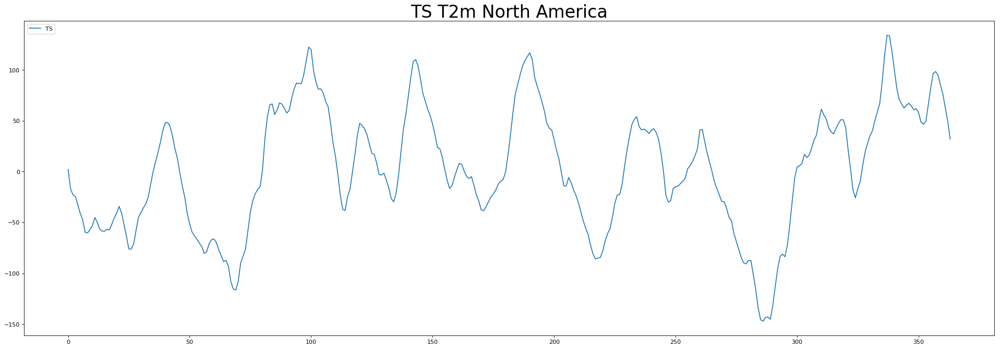

39.0
-111.25


In [87]:
# Sanity Check T2m np anom 
plt.figure(figsize=(30,10), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(GPH250_MeanAnom[1:365,46,16])

plt.title('TS T2m North America', FontSize=30)
plt.legend(['TS','Model'], loc='upper left')
plt.show()
print(latT[30])
print(lonT[30])

## Get PC loadings for 1981- 2010

In [88]:
indicSST1981 = np.array(dfSST.loc[(dfSST['month'] == 1) & (dfSST['day'] == 1) 
                                       &(dfSST['year'] == 1981)].index.tolist())

indicT2m1981 = np.array(df.loc[(df['month'] == 1) & (df['day'] == 1) 
                                       &(df['year'] == 1981)].index.tolist())


indicSST2010 = np.array(dfSST.loc[(dfSST['month'] == 12) & (dfSST['day'] == 31) 
                                       &(dfSST['year'] == 2010)].index.tolist())

indicT2m2010 = np.array(df.loc[(df['month'] == 12) & (df['day'] == 31) 
                                       &(df['year'] == 2010)].index.tolist())

# Create an EOF solver to do the EOF analysis. Square-root of cosine of
# latitude weights are applied before the computation of EOFs.
print('EOF SST tropics start:')
coslat = np.cos(np.deg2rad(latTrop))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solverTROP = Eof(SSTtrop_MeanAnom[indicSST1981[0]:indicSST2010[0],:,:],weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')


print('EOF SST NP start:')
coslat = np.cos(np.deg2rad(latNP))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solverNP = Eof(SSTnp_MeanAnom[indicSST1981[0]:indicSST2010[0],:,:],weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')


print('EOF T2m NP start:')
coslat = np.cos(np.deg2rad(latT))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solverT2m = Eof(T2m_MeanAnom[indicT2m1981[0]:indicT2m2010[0],:,:],weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')

print('EOF GPH250 start:')
coslat = np.cos(np.deg2rad(latGPH))
wgts = np.sqrt(coslat)[..., np.newaxis]
start_time = time.time()
solverGPH250 = Eof(GPH250_MeanAnom[indicT2m1981[0]:indicT2m2010[0],:,:],weights=wgts)
elapsed_time = time.time() - start_time
print(elapsed_time,'Seconds')

EOF SST tropics start:
14.844771385192871 Seconds
EOF SST NP start:
136.96949744224548 Seconds
EOF T2m NP start:
8.142902851104736 Seconds
EOF GPH250 start:
176.57656526565552 Seconds


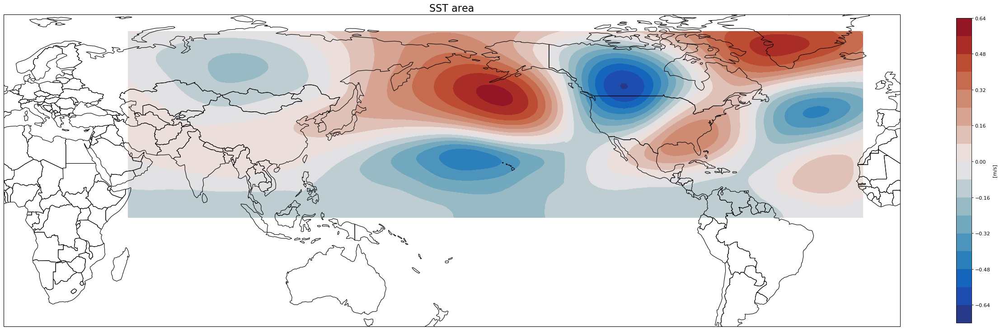

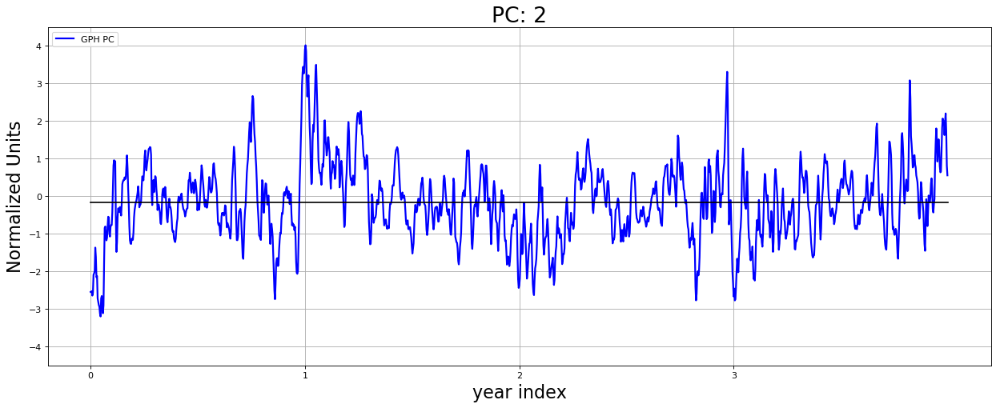

In [90]:
numdo=2
############################################
eofGPH250 = solverGPH250.eofsAsCorrelation(neofs=5)
pcGPH250 = solverGPH250.pcs(npcs=5, pcscaling=1)

proj = ccrs.PlateCarree(central_longitude=180)
plt.figure(figsize=(40,40), dpi= 80, facecolor='w', edgecolor='k')
ax = plt.subplot(1, 1, 1,projection = proj)
proj = ccrs.PlateCarree()
ax.add_feature(cf.BORDERS)

# ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
# ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)

ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines()
ax.add_feature(cf.BORDERS)
ax.set_extent([-180-90, -46, -20, 70])

scales = np.nanmax(np.abs(eof1[numdo,:,:]))

mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap


plt.contourf(lonGPH,latGPH,eofGPH250[numdo,:,:],15,cmap=mappper,vmin=-scales,vmax=scales)
cbar = plt.colorbar(ax = ax, shrink=0.28)
cbar.set_label('[m/s]',fontsize=10)
plt.title('SST area',fontsize=20)
plt.show()

# Plot the leading PC time series.

years = 4
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(pcGPH250[0:365*years,numdo], color='b', linewidth=2)
mm = np.mean(pcGPH250[0:365*years,numdo])
plt.plot([0,365*years],[mm,mm],'k')
ax1.set_xticks(np.arange(0,365*years,365))
ax1.set_xticklabels(range(years))
ax1.grid(True)
plt.title('PC: %i' %numdo,FontSize=24)
plt.legend(['GPH PC'], loc='upper left')
plt.ylim(-4.5, 4.5)
plt.ylabel('Normalized Units',FontSize=20)
plt.xlabel('year index',FontSize=20)
plt.show()

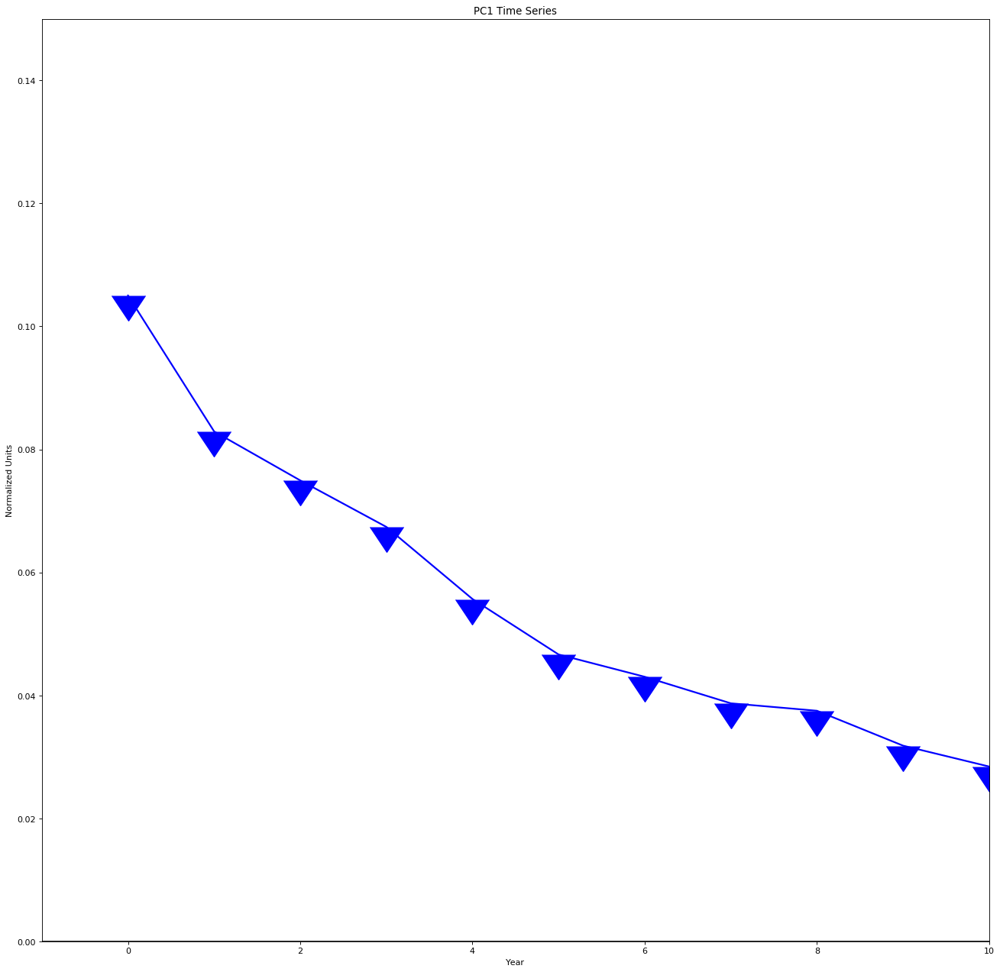

In [91]:
variance_fractions = solverGPH250.varianceFraction()

# Plot the leading PC time series.
plt.figure(figsize=(20,20), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(variance_fractions, color='b', linewidth=2,marker=11,markersize=40)
plt.axhline(0, color='k')
plt.title('PC1 Time Series')
plt.xlabel('Year')
plt.ylabel('Normalized Units')
plt.ylim(0, .15)
plt.xlim(-1, 10)

plt.show()

# Frame Work for Doing it All: 

#### Here's the Data I have and in the right form: 

In [92]:
dfAAA

,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S
0,17347584.0,1980.0,1.0,1.0,0.59,-1.20,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453
1,17347608.0,1980.0,1.0,2.0,0.59,-1.20,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016
2,17347632.0,1980.0,1.0,3.0,0.59,-1.20,5,0.663776,0.662733,0.037199,-0.980248,-0.239086
3,17347656.0,1980.0,1.0,4.0,0.59,-1.20,5,0.650896,0.614840,0.213630,-0.980062,-0.229728
4,17347680.0,1980.0,1.0,5.0,0.59,-1.20,5,0.857257,0.702877,0.490769,-0.979840,-0.215738
5,17347704.0,1980.0,1.0,6.0,0.59,-1.20,5,0.969876,0.758704,0.604175,-0.978136,-0.202001
6,17347728.0,1980.0,1.0,7.0,0.59,-1.20,5,0.774037,0.674902,0.379001,-0.975389,-0.188881
7,17347752.0,1980.0,1.0,8.0,0.59,-1.20,5,0.789400,0.764337,0.197338,-0.973250,-0.173835
8,17347776.0,1980.0,1.0,9.0,0.59,-1.20,5,0.822878,0.795880,0.209051,-0.969617,-0.142236
9,17347800.0,1980.0,1.0,10.0,0.59,-1.20,5,0.971901,0.937358,0.256808,-0.964225,-0.106519


In [93]:
# These need to all print to proceed _
dfT2m = dfAAA

print(dfAAA.shape)
print(dfSST.shape)
print(T2m_MeanAnom.shape)
print(SSTtrop_MeanAnom.shape)
print(SSTnp_MeanAnom.shape)
print(solverNP)
print(solverTROP)
print(solverT2m)

#here we go. 
#reserve testing data: 

testingyear = 2018
N = 14 #2 week averages

indicTestingT2m = np.array(dfAAA.loc[(dfAAA['year']==testingyear)].index.tolist())
indicTrainingT2m = np.array(dfAAA.loc[(dfAAA['year']!=testingyear)].index.tolist())

indicTestingSST = np.array(dfSST.loc[(dfSST['year']==testingyear)].index.tolist())
indicTrainingSST = np.array(dfSST.loc[(dfSST['year']!=testingyear)].index.tolist())

T2m_Seat = np.squeeze(T2m_MeanAnom[:,46,16])

print('Projecting PCs')
pcTrop = solverTROP.projectField(SSTtrop_MeanAnom,neofs=5,eofscaling=1)  # get the psuedo pcs from the testing data. 
pcNP= solverNP.projectField(SSTnp_MeanAnom,neofs=5,eofscaling=1)  # get the psuedo pcs from the testing data. 
pcT2m = solverT2m.projectField(T2m_MeanAnom,neofs=5,eofscaling=1)  # get the psuedo pcs from the testing data. 
pcGPH250= solverGPH250.projectField(GPH250_MeanAnom,neofs=5,eofscaling=1)  # get the psuedo pcs from the testing data. 

print('Done Projecting PCs')

##########################################################################
### MERGE all of the data frames to make testing and training sets.   
##########################################################################

# merge all df for sst and t2m
print('merging data frames')

dataPCS = {'PC1np':pcNP[:,0],'PC2np':pcNP[:,1], 'PC3np':pcNP[:,2],'PC4np':pcNP[:,3],'PC5np':pcNP[:,4]}
dfPCSNP = pd.DataFrame(dataPCS) 
dfPCSNP
dfPCSNP = dfPCSNP.join(dfSST['year'])
dfPCSNP = dfPCSNP.join(dfSST['month'])
dfPCSNP = dfPCSNP.join(dfSST['day'])
dfPCSNP


dataPCS = {'PC1trop':pcTrop[:,0],'PC2trop':pcTrop[:,1], 'PC3trop':pcTrop[:,2],'PC4trop':pcTrop[:,3],'PC5trop':pcTrop[:,4]}
dfPCStrop = pd.DataFrame(dataPCS) 
dfPCStrop
dfPCStrop = dfPCStrop.join(dfSST['year'])
dfPCStrop = dfPCStrop.join(dfSST['month'])
dfPCStrop = dfPCStrop.join(dfSST['day'])
dfPCStrop


dataPCS = {'PC1GPH250':pcGPH250[:,0],'PC2GPH250':pcGPH250[:,1], 'PC3GPH250':pcGPH250[:,2],'PC4GPH250':pcGPH250[:,3],'PC5GPH250':pcGPH250[:,4]}
dfPCSGPH250 = pd.DataFrame(dataPCS) 
dfPCSGPH250
dfPCSGPH250 = dfPCSGPH250.join(dfGPH['year'])
dfPCSGPH250 = dfPCSGPH250.join(dfGPH['month'])
dfPCSGPH250 = dfPCSGPH250.join(dfGPH['day'])
dfPCSGPH250


dataPCS = {'PC1T2m':pcT2m[:,0],'PC2T2m':pcT2m[:,1], 'PC3T2m':pcT2m[:,2],'PC4T2m':pcT2m[:,3],'PC5T2m':pcT2m[:,4],'AnomSeat':T2m_Seat}
dfPCST2m = pd.DataFrame(dataPCS) 
dfPCST2m
dfPCST2m = dfPCST2m.join(dfT2m['year'])
dfPCST2m = dfPCST2m.join(dfT2m['month'])
dfPCST2m = dfPCST2m.join(dfT2m['day'])
dfPCST2m



#merge them all. 

dfT2mA = pd.merge(left=dfAAA,right=dfPCSNP, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfT2mAA= pd.merge(left=dfT2mA,right=dfPCStrop, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfT2mAAA= pd.merge(left=dfT2mAA,right=dfPCSGPH250, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfT2mAAAA = pd.merge(left=dfT2mAAA,right=dfPCST2m, how='left', left_on=['year','month','day'], right_on=['year','month','day'])
dfALL = dfT2mAAAA

dfALL.head(20)

(14326, 12)
(14669, 4)
(14326, 53, 62)
(14669, 21, 229)
(14669, 86, 176)
Projecting PCs
Done Projecting PCs
merging data frames


,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S,PC1np,PC2np,PC3np,PC4np,PC5np,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,PC1GPH250,PC2GPH250,PC3GPH250,PC4GPH250,PC5GPH250,PC1T2m,PC2T2m,PC3T2m,PC4T2m,PC5T2m,AnomSeat
0,17347584.0,1980.0,1.0,1.0,0.59,-1.2,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453,0.850112,0.799715,-0.473201,0.089436,1.448883,-0.512240,-0.660402,1.289919,-0.153238,0.456217,-1.064389,0.100579,1.285830,0.010585,-0.092857,0.092132,-0.706427,-0.249733,-1.093785,-0.592293,-1.176749
1,17347608.0,1980.0,1.0,2.0,0.59,-1.2,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016,0.846479,0.789084,-0.492778,0.068741,1.450535,-0.513102,-0.665181,1.276688,-0.130038,0.468264,-0.505258,0.408556,1.071343,0.107771,-0.524574,-0.364662,-0.758483,-0.647364,-1.229946,-0.704721,-2.017464
2,17347632.0,1980.0,1.0,3.0,0.59,-1.2,5,0.663776,0.662733,0.037199,-0.980248,-0.239086,0.842329,0.777503,-0.511113,0.050636,1.452295,-0.513509,-0.667807,1.269229,-0.108040,0.481071,-0.160355,0.869647,1.006652,0.453565,-0.840510,-0.662139,-0.889044,-0.963083,-1.250192,-0.798741,-3.102237
3,17347656.0,1980.0,1.0,4.0,0.59,-1.2,5,0.650896,0.614840,0.213630,-0.980062,-0.229728,0.837768,0.766117,-0.527168,0.032644,1.453298,-0.513395,-0.669675,1.264381,-0.086489,0.494414,-0.277903,1.253157,1.431756,0.453610,0.337753,-0.630979,-0.727722,-1.240653,-1.360902,-0.916159,-3.690021
4,17347680.0,1980.0,1.0,5.0,0.59,-1.2,5,0.857257,0.702877,0.490769,-0.979840,-0.215738,0.833692,0.755282,-0.540636,0.014279,1.452916,-0.513664,-0.670141,1.260560,-0.064438,0.509185,0.014535,1.170604,1.760734,-0.231799,0.526767,-0.725881,-0.479576,-1.477852,-1.224439,-1.171083,-3.868577
5,17347704.0,1980.0,1.0,6.0,0.59,-1.2,5,0.969876,0.758704,0.604175,-0.978136,-0.202001,0.829271,0.746664,-0.553035,-0.002917,1.451584,-0.513483,-0.669731,1.262108,-0.037573,0.524631,0.301924,1.517815,1.699744,0.095060,0.487170,-0.674076,-0.701071,-1.499759,-0.915496,-1.326343,-3.335602
6,17347728.0,1980.0,1.0,7.0,0.59,-1.2,5,0.774037,0.674902,0.379001,-0.975389,-0.188881,0.824854,0.737925,-0.563904,-0.019604,1.448516,-0.513327,-0.668224,1.267465,-0.011615,0.539503,0.755951,1.283565,2.223430,0.432052,1.106635,-0.381329,-0.707295,-1.505057,-1.033184,-1.251181,-2.940857
7,17347752.0,1980.0,1.0,8.0,0.59,-1.2,5,0.789400,0.764337,0.197338,-0.973250,-0.173835,0.820984,0.729474,-0.573421,-0.034930,1.445817,-0.513932,-0.664566,1.275823,0.014065,0.552197,1.136881,1.307755,2.517864,0.380168,0.547431,-0.151545,-0.682987,-1.641201,-0.896981,-1.198736,-2.672594
8,17347776.0,1980.0,1.0,9.0,0.59,-1.2,5,0.822878,0.795880,0.209051,-0.969617,-0.142236,0.813952,0.726419,-0.578456,-0.045465,1.445292,-0.510216,-0.656673,1.293337,0.046676,0.563497,1.560163,1.076465,2.478007,0.846925,1.032051,-0.033000,-0.483970,-1.869588,-0.813675,-1.149685,-2.866653
9,17347800.0,1980.0,1.0,10.0,0.59,-1.2,5,0.971901,0.937358,0.256808,-0.964225,-0.106519,0.806497,0.724269,-0.581391,-0.057163,1.444621,-0.505936,-0.647816,1.315247,0.081289,0.575611,1.678636,0.031764,2.422239,1.345685,1.618517,0.107049,-0.339751,-1.974383,-0.809649,-1.095148,-3.007063


## Kmeans Cluster:

In [4]:

# Find cosine similarity: 
###
T2m_MeanAnom.shape
T2m_MeanAnomF = np.reshape(T2m_MeanAnom,[T2m_MeanAnom.shape[0],T2m_MeanAnom.shape[1]*T2m_MeanAnom.shape[2]])
K = range(1,15)
distortions = []
Cos_Similars = []


for k in K:
    print(k)
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(T2m_MeanAnomF)
    kmeanModel.fit(T2m_MeanAnomF)
    distortions.append(sum(np.min(cdist(T2m_MeanAnomF, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / T2m_MeanAnomF.shape[0])
    Z = kmeanModel.predict(T2m_MeanAnomF)
    dfALL['Kclass'] = Z
    
    num_classes = k
    Map_Pred = np.zeros([num_classes,latT.shape[0],lonT.shape[0]])
    
    for count in range(num_classes):
        dfk1 = dfALL[dfALL['Kclass']==count]
        plotter = np.mean(T2m_MeanAnom[dfk1.index,:,:],axis=0);
        Map_Pred[count,:,:] = plotter
    
    Map_Preds = np.zeros([Z.shape[0],latT.shape[0],lonT.shape[0]])

    for jj in range(Map_Preds.shape[0]):
        Map_Preds[jj,:,:] = Map_Pred[Z[jj],:,:]

    Map_True=T2m_MeanAnom

    Cos_Vals = np.zeros((Map_True.shape[0]))

    for ii in range(Map_True.shape[0]):
        r1 = np.reshape(np.squeeze(Map_Preds[ii,:,:])*Lands,(1,-1))
        r2 = np.reshape(np.squeeze(Map_True[ii,:,:])*Lands,(1,-1))
        r1 = r1[np.logical_not(np.isnan(r1))]
        r1 = np.expand_dims(r1,axis=0)
        r2 = r2[np.logical_not(np.isnan(r2))]
        r2 = np.expand_dims(r2,axis=0)
        Cos_Vals[ii] = Cos_Sim(r1,r2) 
    Cos_Similars.append(np.mean(Cos_Vals))
    
# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

# Plot the elbow
plt.plot(K, Cos_Similars, 'bx-')
plt.xlabel('k')
plt.ylabel('Cosine Similarity')
plt.title('The Elbow Method showing the optimal Cosine Similarity')
plt.show()

1


KeyboardInterrupt: 

In [278]:
Cos_Similars

[0.06048885149794911,
 0.5213001882027757,
 0.4302377923460058,
 0.6008440443337315,
 0.6350647814997471,
 0.6625643046663942,
 0.6890553076525983,
 0.7053376630024686,
 0.7184781483742098,
 0.710404140887966,
 0.7162617191920089,
 0.7341532151792289]

In [271]:
Map_Pred.shape

(1, 53, 62)

In [55]:
T2m_MeanAnom.shape
T2m_MeanAnomF = np.reshape(T2m_MeanAnom,[T2m_MeanAnom.shape[0],T2m_MeanAnom.shape[1]*T2m_MeanAnom.shape[2]])
num_classes=12

kmeans = KMeans(n_clusters=num_classes, random_state=0).fit(T2m_MeanAnomF)
Z = kmeans.predict(T2m_MeanAnomF)


In [56]:
dfALL['Kclass'] = Z
dfALL.head(40)

,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S,PC1np,PC2np,PC3np,PC4np,PC5np,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,PC1GPH250,PC2GPH250,PC3GPH250,PC4GPH250,PC5GPH250,PC1T2m,PC2T2m,PC3T2m,PC4T2m,PC5T2m,AnomSeat,Kclass
0,17347584.0,1980.0,1.0,1.0,0.59,-1.20,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453,0.850112,0.799715,-0.473201,0.089436,1.448883,-0.512240,-0.660402,1.289919,-0.153238,0.456217,-1.064389,0.100579,1.285830,0.010585,-0.092857,0.092132,-0.706427,-0.249733,-1.093785,-0.592293,-1.176749,1
1,17347608.0,1980.0,1.0,2.0,0.59,-1.20,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016,0.846479,0.789084,-0.492778,0.068741,1.450535,-0.513102,-0.665181,1.276688,-0.130038,0.468264,-0.505258,0.408556,1.071343,0.107771,-0.524574,-0.364662,-0.758483,-0.647364,-1.229946,-0.704721,-2.017464,1
2,17347632.0,1980.0,1.0,3.0,0.59,-1.20,5,0.663776,0.662733,0.037199,-0.980248,-0.239086,0.842329,0.777503,-0.511113,0.050636,1.452295,-0.513509,-0.667807,1.269229,-0.108040,0.481071,-0.160355,0.869647,1.006652,0.453565,-0.840510,-0.662139,-0.889044,-0.963083,-1.250192,-0.798741,-3.102237,6
3,17347656.0,1980.0,1.0,4.0,0.59,-1.20,5,0.650896,0.614840,0.213630,-0.980062,-0.229728,0.837768,0.766117,-0.527168,0.032644,1.453298,-0.513395,-0.669675,1.264381,-0.086489,0.494414,-0.277903,1.253157,1.431756,0.453610,0.337753,-0.630979,-0.727722,-1.240653,-1.360902,-0.916159,-3.690021,6
4,17347680.0,1980.0,1.0,5.0,0.59,-1.20,5,0.857257,0.702877,0.490769,-0.979840,-0.215738,0.833692,0.755282,-0.540636,0.014279,1.452916,-0.513664,-0.670141,1.260560,-0.064438,0.509185,0.014535,1.170604,1.760734,-0.231799,0.526767,-0.725881,-0.479576,-1.477852,-1.224439,-1.171083,-3.868577,6
5,17347704.0,1980.0,1.0,6.0,0.59,-1.20,5,0.969876,0.758704,0.604175,-0.978136,-0.202001,0.829271,0.746664,-0.553035,-0.002917,1.451584,-0.513483,-0.669731,1.262108,-0.037573,0.524631,0.301924,1.517815,1.699744,0.095060,0.487170,-0.674076,-0.701071,-1.499759,-0.915496,-1.326343,-3.335602,6
6,17347728.0,1980.0,1.0,7.0,0.59,-1.20,5,0.774037,0.674902,0.379001,-0.975389,-0.188881,0.824854,0.737925,-0.563904,-0.019604,1.448516,-0.513327,-0.668224,1.267465,-0.011615,0.539503,0.755951,1.283565,2.223430,0.432052,1.106635,-0.381329,-0.707295,-1.505057,-1.033184,-1.251181,-2.940857,6
7,17347752.0,1980.0,1.0,8.0,0.59,-1.20,5,0.789400,0.764337,0.197338,-0.973250,-0.173835,0.820984,0.729474,-0.573421,-0.034930,1.445817,-0.513932,-0.664566,1.275823,0.014065,0.552197,1.136881,1.307755,2.517864,0.380168,0.547431,-0.151545,-0.682987,-1.641201,-0.896981,-1.198736,-2.672594,5
8,17347776.0,1980.0,1.0,9.0,0.59,-1.20,5,0.822878,0.795880,0.209051,-0.969617,-0.142236,0.813952,0.726419,-0.578456,-0.045465,1.445292,-0.510216,-0.656673,1.293337,0.046676,0.563497,1.560163,1.076465,2.478007,0.846925,1.032051,-0.033000,-0.483970,-1.869588,-0.813675,-1.149685,-2.866653,5
9,17347800.0,1980.0,1.0,10.0,0.59,-1.20,5,0.971901,0.937358,0.256808,-0.964225,-0.106519,0.806497,0.724269,-0.581391,-0.057163,1.444621,-0.505936,-0.647816,1.315247,0.081289,0.575611,1.678636,0.031764,2.422239,1.345685,1.618517,0.107049,-0.339751,-1.974383,-0.809649,-1.095148,-3.007063,0


In [57]:
dfk1 = dfALL[dfALL['Kclass']==0]
dfk1.index

Int64Index([    9,    10,    11,    12,    13,    14,    15,    16,    17,    18,
            ...
            14136, 14248, 14249, 14250, 14251, 14253, 14322, 14323, 14324, 14325], dtype='int64', length=1747)

(1747, 34)
(1772, 34)
(928, 34)
(662, 34)
(1225, 34)
(868, 34)
(1204, 34)
(1118, 34)
(1163, 34)
(366, 34)


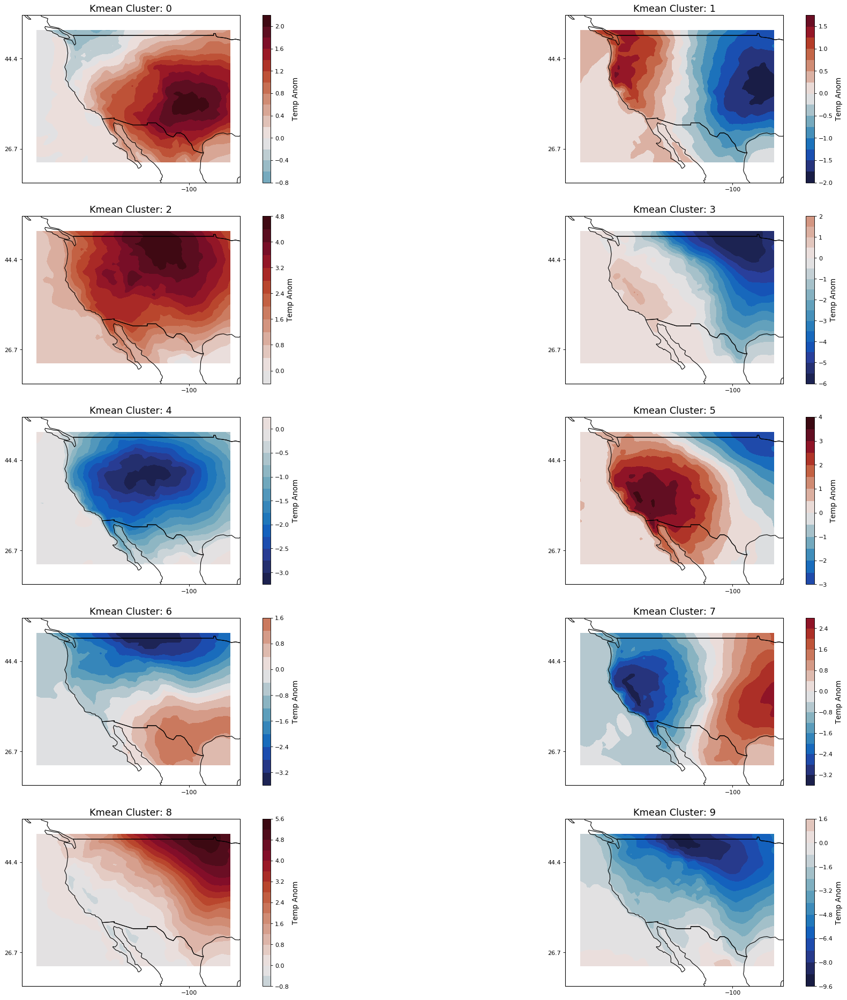

In [58]:


dfALL['Kclass'] = Z
dfALL.head(40)


# plot the different k clusters to look at the diversity of temperature shit
proj = ccrs.PlateCarree()
count = 0 
plots = []

plt.figure(figsize=(30,30), dpi= 80, facecolor='w', edgecolor='k')

Map_Pred = np.zeros([num_classes,latT.shape[0],lonT.shape[0]])
num_cat = np.zeros((num_classes))
perc_cat = np.zeros((num_classes))

for i in range(5):
    for j in range(2):
        dfk1 = dfALL[dfALL['Kclass']==count]
        print(dfk1.shape)
        num_cat[count] = dfk1.shape[0]
        perc_cat[count] = dfk1.shape[0]/dfALL.shape[0]
        
        ax = plt.subplot(5, 2, count+1,projection = proj)
        ax.set_xticks(np.linspace(-180,180, 10), crs=proj)
        ax.set_yticks(np.linspace(-80, 80, 10), crs=proj)
        ax.add_feature(cf.BORDERS)

        ax.add_feature(cf.NaturalEarthFeature(
                       category='cultural',
                       name='admin_1_states_provinces_lines',
                       scale='50m',
                       facecolor='none'))

        ax.coastlines()
        ax.add_feature(cf.BORDERS)
        ax.set_extent([-133, -90, 20, 51])

        mappper = palettable.cmocean.diverging.Balance_20.mpl_colormap

        plotter = np.mean(T2m_MeanAnom[dfk1.index,:,:],axis=0); 
        scales =np.amax(np.abs(plotter))
        
        Map_Pred[count,:,:] = plotter

        fill = plt.contourf(lonT,latT,plotter,15,cmap=mappper,vmin=-scales,vmax=scales)

        cb = plt.colorbar(ax = ax, shrink=1)
        cb.set_label('Temp Anom', fontsize=12)

        plt.title('Kmean Cluster: %s' % count, fontsize=16)
        
        
        count+=1
plt.show()


In [59]:
perc_cat

array([0.12194611, 0.12369119, 0.06477733, 0.04620969, 0.08550887,
       0.06058914, 0.084043  , 0.07803993, 0.08118107, 0.02554795,
       0.        , 0.        ])

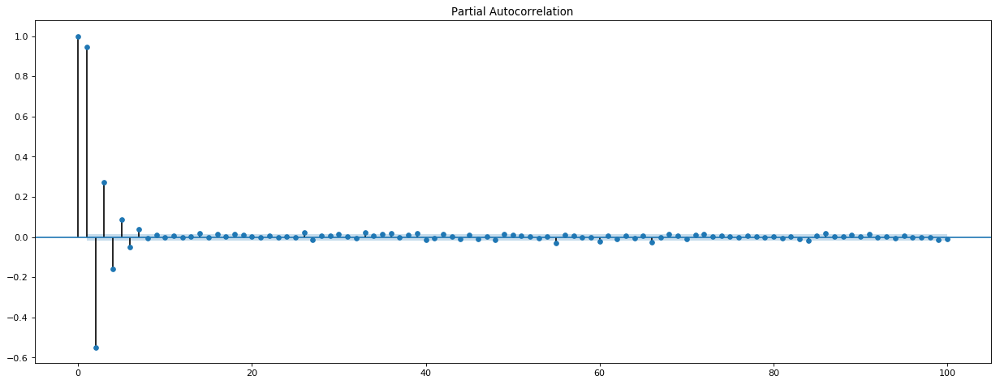

In [60]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
plot_pacf(dfALL['PC1GPH250'],lags=100,ax=ax1)
plt.show()

In [61]:
dfALL.columns

Index(['model time', 'year', 'month', 'day', 'ONI', 'QBO', 'phase', 'amplitude', 'RMM1', 'RMM2', 'Extent_N', 'Extent_S', 'PC1np', 'PC2np', 'PC3np', 'PC4np', 'PC5np', 'PC1trop', 'PC2trop', 'PC3trop', 'PC4trop', 'PC5trop', 'PC1GPH250', 'PC2GPH250', 'PC3GPH250', 'PC4GPH250', 'PC5GPH250', 'PC1T2m', 'PC2T2m', 'PC3T2m', 'PC4T2m', 'PC5T2m', 'AnomSeat', 'Kclass'], dtype='object')

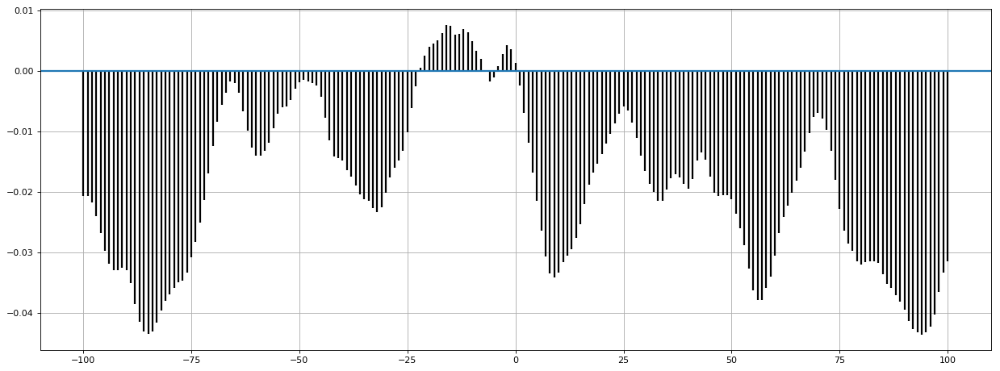

In [62]:
# What lag time best correspondsd with the first mode? 
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
ax1.xcorr(-dfALL['PC3GPH250'], dfALL['Kclass'], usevlines=True, maxlags=100, normed=True, lw=2)
ax1.grid(True)

In [287]:
#now do shifting:
dfBuild = buildLaggedFeaturesBack(dfALL,lag=0,dropna=False)

dfBuild = buildLaggedFeaturesFor(dfBuild,'Kclass',lag=10,dropna=False)
dfBuild



,model time,year,month,day,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S,PC1np,PC2np,PC3np,PC4np,PC5np,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,PC1GPH250,PC2GPH250,PC3GPH250,PC4GPH250,PC5GPH250,PC1T2m,PC2T2m,PC3T2m,PC4T2m,PC5T2m,AnomSeat,Kclass,Kclass_for10
0,17347584.0,1980.0,1.0,1.0,0.59,-1.20,4,0.814303,0.811586,-0.066468,-0.983727,-0.253453,0.850112,0.799715,-0.473201,0.089436,1.448883,-0.512240,-0.660402,1.289919,-0.153238,0.456217,-1.064389,0.100579,1.285830,0.010585,-0.092857,0.092132,-0.706427,-0.249733,-1.093785,-0.592293,-1.176749,3,3.0
1,17347608.0,1980.0,1.0,2.0,0.59,-1.20,4,0.705712,0.705088,-0.029684,-0.981393,-0.244016,0.846479,0.789084,-0.492778,0.068741,1.450535,-0.513102,-0.665181,1.276688,-0.130038,0.468264,-0.505258,0.408556,1.071343,0.107771,-0.524574,-0.364662,-0.758483,-0.647364,-1.229946,-0.704721,-2.017464,1,3.0
2,17347632.0,1980.0,1.0,3.0,0.59,-1.20,5,0.663776,0.662733,0.037199,-0.980248,-0.239086,0.842329,0.777503,-0.511113,0.050636,1.452295,-0.513509,-0.667807,1.269229,-0.108040,0.481071,-0.160355,0.869647,1.006652,0.453565,-0.840510,-0.662139,-0.889044,-0.963083,-1.250192,-0.798741,-3.102237,1,2.0
3,17347656.0,1980.0,1.0,4.0,0.59,-1.20,5,0.650896,0.614840,0.213630,-0.980062,-0.229728,0.837768,0.766117,-0.527168,0.032644,1.453298,-0.513395,-0.669675,1.264381,-0.086489,0.494414,-0.277903,1.253157,1.431756,0.453610,0.337753,-0.630979,-0.727722,-1.240653,-1.360902,-0.916159,-3.690021,1,2.0
4,17347680.0,1980.0,1.0,5.0,0.59,-1.20,5,0.857257,0.702877,0.490769,-0.979840,-0.215738,0.833692,0.755282,-0.540636,0.014279,1.452916,-0.513664,-0.670141,1.260560,-0.064438,0.509185,0.014535,1.170604,1.760734,-0.231799,0.526767,-0.725881,-0.479576,-1.477852,-1.224439,-1.171083,-3.868577,1,4.0
5,17347704.0,1980.0,1.0,6.0,0.59,-1.20,5,0.969876,0.758704,0.604175,-0.978136,-0.202001,0.829271,0.746664,-0.553035,-0.002917,1.451584,-0.513483,-0.669731,1.262108,-0.037573,0.524631,0.301924,1.517815,1.699744,0.095060,0.487170,-0.674076,-0.701071,-1.499759,-0.915496,-1.326343,-3.335602,1,4.0
6,17347728.0,1980.0,1.0,7.0,0.59,-1.20,5,0.774037,0.674902,0.379001,-0.975389,-0.188881,0.824854,0.737925,-0.563904,-0.019604,1.448516,-0.513327,-0.668224,1.267465,-0.011615,0.539503,0.755951,1.283565,2.223430,0.432052,1.106635,-0.381329,-0.707295,-1.505057,-1.033184,-1.251181,-2.940857,1,4.0
7,17347752.0,1980.0,1.0,8.0,0.59,-1.20,5,0.789400,0.764337,0.197338,-0.973250,-0.173835,0.820984,0.729474,-0.573421,-0.034930,1.445817,-0.513932,-0.664566,1.275823,0.014065,0.552197,1.136881,1.307755,2.517864,0.380168,0.547431,-0.151545,-0.682987,-1.641201,-0.896981,-1.198736,-2.672594,3,4.0
8,17347776.0,1980.0,1.0,9.0,0.59,-1.20,5,0.822878,0.795880,0.209051,-0.969617,-0.142236,0.813952,0.726419,-0.578456,-0.045465,1.445292,-0.510216,-0.656673,1.293337,0.046676,0.563497,1.560163,1.076465,2.478007,0.846925,1.032051,-0.033000,-0.483970,-1.869588,-0.813675,-1.149685,-2.866653,3,4.0
9,17347800.0,1980.0,1.0,10.0,0.59,-1.20,5,0.971901,0.937358,0.256808,-0.964225,-0.106519,0.806497,0.724269,-0.581391,-0.057163,1.444621,-0.505936,-0.647816,1.315247,0.081289,0.575611,1.678636,0.031764,2.422239,1.345685,1.618517,0.107049,-0.339751,-1.974383,-0.809649,-1.095148,-3.007063,3,4.0


# OR START THIS ALL HERE AND LOAD THE DATA FRAME: 

In [87]:
# load data frame here: 
dfTesting.head(50)

,month,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S,PC1np,PC2np,PC3np,PC4np,PC5np,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,PC1GPH250,PC2GPH250,PC3GPH250,PC4GPH250,PC5GPH250,PC1T2m,PC2T2m,PC3T2m,PC4T2m,PC5T2m,AnomSeat,Kclass,ONI_lag5,PC1T2m_lag5,PC1T2m_lag20,PC1GPH250_lag5,PC1GPH250_lag20,PC3GPH250_lag5,PC3GPH250_lag20,PC2GPH250_lag5,PC2GPH250_lag20,PC1trop_lag5,PC1trop_lag20,PC3trop_lag5,PC3trop_lag20,PC2trop_lag5,PC2trop_lag20,PC1np_lag5,PC1np_lag20,PC3np_lag5,PC3np_lag20,PC2np_lag5,PC2np_lag20,RMM1_lag5,RMM1_lag20,RMM2_lag5,RMM2_lag20,Kclass_for30
8061,1.0,-0.87,-0.06,2,1.655467,-0.853389,-1.418555,-0.171377,-1.695499,-0.997096,0.770398,-1.089810,-0.979736,0.615128,1.201088,-1.066586,-1.107602,0.239851,0.214150,0.543497,1.465778,-1.344005,-0.899105,0.306541,-1.342332,-3.853291,-1.678176,-2.156641,0.232574,-1.081194,4,-0.97,-1.403133,1.191203,0.081678,-0.254279,0.374648,-2.806457,1.436934,1.527210,1.253824,1.282068,-1.074383,-1.049659,-0.991214,-0.552131,-1.044262,-1.111433,-1.010533,-0.813636,0.809733,0.594778,-1.210917,-0.247075,0.003392,0.884180,3.0
8062,1.0,-0.87,-0.06,2,1.429385,-0.695064,-1.249010,-0.195520,-1.698503,-0.995950,0.772121,-1.100853,-0.989118,0.585555,1.197055,-1.082285,-1.127935,0.244532,0.218376,0.525771,1.512719,-1.807783,-0.667425,0.154676,-1.042038,-3.732585,-1.469981,-2.004864,0.313860,-0.559505,4,-0.97,-1.610964,1.403657,0.316847,-0.336195,0.117787,-2.183574,1.068465,1.469889,1.238008,1.298122,-1.077983,-1.059971,-1.007228,-0.596430,-1.029388,-1.119618,-1.028972,-0.816868,0.795321,0.635121,-1.391252,-0.088195,-0.324605,1.066611,3.0
8063,1.0,-0.87,-0.06,2,1.533102,-0.798001,-1.309044,-0.214003,-1.702685,-0.994168,0.769912,-1.110155,-0.991891,0.552468,1.194401,-1.095510,-1.139723,0.239627,0.239955,0.385564,1.535334,-1.875062,-0.477164,0.084863,-0.590362,-3.591442,-1.219204,-1.933724,0.231637,0.140533,4,-0.97,-1.666181,1.569459,0.372400,-1.262967,-0.283245,-1.495661,1.094628,2.298333,1.224592,1.313345,-1.080465,-1.073935,-1.031391,-0.638931,-1.013964,-1.126274,-1.047372,-0.820623,0.784172,0.679761,-1.191245,-0.076062,-0.711859,1.456565,4.0
8064,1.0,-0.87,-0.06,2,1.526386,-0.849397,-1.268219,-0.230807,-1.712533,-0.990464,0.762909,-1.113193,-0.995087,0.523204,1.192278,-1.106094,-1.146291,0.230987,0.277987,0.019784,1.115491,-1.537564,-0.576381,-1.713872,-0.189234,-3.189548,-1.159862,-1.924955,0.090664,0.753730,4,-0.97,-1.667240,1.680405,0.604867,-0.912867,-0.213816,-1.037033,1.009189,1.912504,1.214707,1.324963,-1.085176,-1.099476,-1.044870,-0.680496,-1.004970,-1.130654,-1.065766,-0.824618,0.775512,0.725062,-1.129410,-0.166910,-1.261639,1.896268,4.0
8065,1.0,-0.87,-0.06,2,1.715296,-0.977463,-1.409541,-0.240905,-1.721528,-0.982634,0.756319,-1.110599,-0.996703,0.491218,1.186605,-1.114227,-1.146673,0.221395,0.321142,-1.328977,1.395290,-1.537324,0.570856,-1.804345,-0.148544,-2.891578,-1.234857,-1.576471,0.027308,1.113120,4,-0.97,-1.574793,1.669864,0.665606,-0.060345,-0.646327,-0.778432,1.234782,1.111666,1.206684,1.332739,-1.093049,-1.124646,-1.055854,-0.720779,-0.999512,-1.132577,-1.080871,-0.826477,0.771951,0.764419,-1.063015,-0.411046,-1.591000,1.949503,4.0
8066,1.0,-0.87,-0.06,2,2.088702,-1.061881,-1.798634,-0.246195,-1.730287,-0.972951,0.751587,-1.102941,-0.991795,0.449069,1.179308,-1.119086,-1.137807,0.205931,0.378527,-1.281072,1.142136,-1.497642,0.607755,0.126421,-0.259457,-2.939015,-1.136488,-1.427273,-0.040595,1.168947,4,-0.87,-1.342332,1.596763,0.543497,0.115906,-1.344005,-0.402235,1.465778,0.072965,1.201088,1.336195,-1.107602,-1.140821,-1.066586,-0.756557,-0.997096,-1.130128,-1.089810,-0.828422,0.770398,0.795396,-0.853389,-0.716492,-1.418555,1.855756,4.0
8067,1.0,-0.87,-0.06,2,2.148469,-0.971239,-1.916406,-0.246422,-1.746277,-0.964096,0.745369,-1.089478,-0.980769,0.406210,1.173211,-1.120067,-1.118902,0.176037,0.446091,-0.257965,0.276561,-1.117088,0.174716,0.904535,-0.196238,-2.934310,-0.895233,-1.361624,-0.270645,1.152775,4,-0.87,-1.042038,1.425240,0.525771,0.838931,-1.807783,0.087321,1.512719,-

# Dataset for training model:

In [15]:
testingyear = 2016
num_classes=9

#now do shifting:
dfBuild = buildLaggedFeaturesBack1(dfALL,'ONI',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1T2m',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1T2m',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1T2m',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1GPH250',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1GPH250',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1GPH250',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3GPH250',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3GPH250',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3GPH250',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2GPH250',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2GPH250',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2GPH250',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1trop',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1trop',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1trop',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3trop',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3trop',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3trop',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2trop',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2trop',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2trop',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1np',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1np',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC1np',lag=20,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3np',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3np',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC3np',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2np',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2np',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'PC2np',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM1',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM1',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM1',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM2',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM2',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'RMM2',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesBack1(dfBuild,'Kclass',lag=5,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'Kclass',lag=10,dropna=False)
dfBuild = buildLaggedFeaturesBack1(dfBuild,'Kclass',lag=20,dropna=False)

dfBuild = buildLaggedFeaturesFor(dfBuild,'Kclass',lag=28,dropna=False)



indicWint = np.array(dfBuild.loc[(
                        (dfBuild['month'] == 1)  | 
                        (dfBuild['month'] == 2)  |
                        (dfBuild['month'] == 3)  |
                        (dfBuild['month'] == 4)  |
                        (dfBuild['month'] == 5)  |
                        (dfBuild['month'] == 6)  |
                        (dfBuild['month'] == 7)  |
                        (dfBuild['month'] == 8)  |
                        (dfBuild['month'] == 9)  |
                        (dfBuild['month'] == 10) | 
                        (dfBuild['month'] == 11) |
                        (dfBuild['month'] == 12))].index.tolist())

dfBuild = dfBuild.iloc[indicWint,:]
dfBuild = dfBuild.reset_index(drop=True)

#find indices of desired testing year:
indicTesting = np.array(dfBuild.loc[(dfBuild['year']==testingyear)].index.tolist())
indicTraining = np.array(dfBuild.loc[(dfBuild['year']!=testingyear)].index.tolist())


dfBuild = dfBuild.drop(columns="model time")
dfBuild = dfBuild.drop(columns="year")
dfBuild = dfBuild.drop(columns="day")

dfTraining = dfBuild.iloc[indicTraining,:]
dfTesting = dfBuild.iloc[indicTesting,:]

#find indices of desired testing year


dfTraining = dfTraining.dropna()
dfTesting = dfTesting.dropna()

X_test = dfTesting.drop(columns="Kclass_for28")

Y_test = dfTesting['Kclass_for28']


valind = np.round(dfTraining.shape[0]*0.1).astype(int)

X_train = dfTraining.drop(columns="Kclass_for28")
Y_train = dfTraining['Kclass_for28']

X_val = X_train.iloc[-valind:,:]
Y_val = Y_train.iloc[-valind:]

X_train = X_train.iloc[0:-valind,:]
Y_train = Y_train.iloc[0:-valind]


X_train, Y_train = shuffle(X_train,  Y_train, random_state=10)

# convert class vectors to binary class matrices
Y_train = keras.utils.to_categorical(Y_train, num_classes)
Y_test = keras.utils.to_categorical(Y_test, num_classes)
Y_val = keras.utils.to_categorical(Y_val, num_classes)



scale = StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)
X_val = scale.transform(X_val)


In [16]:
X_test[1,:]

array([-1.59097259,  3.02875835,  0.73412409,  1.11894759,  1.67987806,
       -0.78592771,  2.21525933,  0.10447623, -1.62613474,  2.30334089,
       -2.08468397, -0.27608877, -0.20479406, -1.47137492, -2.80077752,
        0.37776039, -1.87985033, -1.73952523,  0.68680854,  0.24723124,
        0.21639405, -2.77526429, -1.0022407 ,  0.38481075, -0.6786721 ,
        1.51661132,  1.44150898, -0.73850718, -0.24863035, -1.1650832 ,
       -0.28650299,  3.15947675, -0.33708661,  0.25501564,  1.86109311,
        1.51406762,  1.25666587, -0.34199105, -0.78585122,  1.28305119,
        0.33427308, -1.79006426, -2.68756094, -2.42141178, -2.85997702,
       -2.90940081, -3.0159982 , -1.58330353, -1.73169306, -1.86528978,
        0.32360904,  0.26629067,  0.21369185,  2.30584174,  2.3406063 ,
        2.53081128, -0.49028507, -0.59524433, -0.60912474, -2.05145709,
       -2.04058993, -1.85166836,  0.36917945,  1.67684689,  1.54137271,
        2.59850748,  2.02041171, -0.57292737, -0.28730857,  1.07

In [17]:
True_map=T2m_MeanAnom[dfTesting.index,:,:]

In [18]:
dense_model = setup_dense(X_test,[100,100,50,100,50,40,100,100],num_classes)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 71)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               7200      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 100)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 100)               400       
_________________________________________________________________
dense_2 (Dense)      

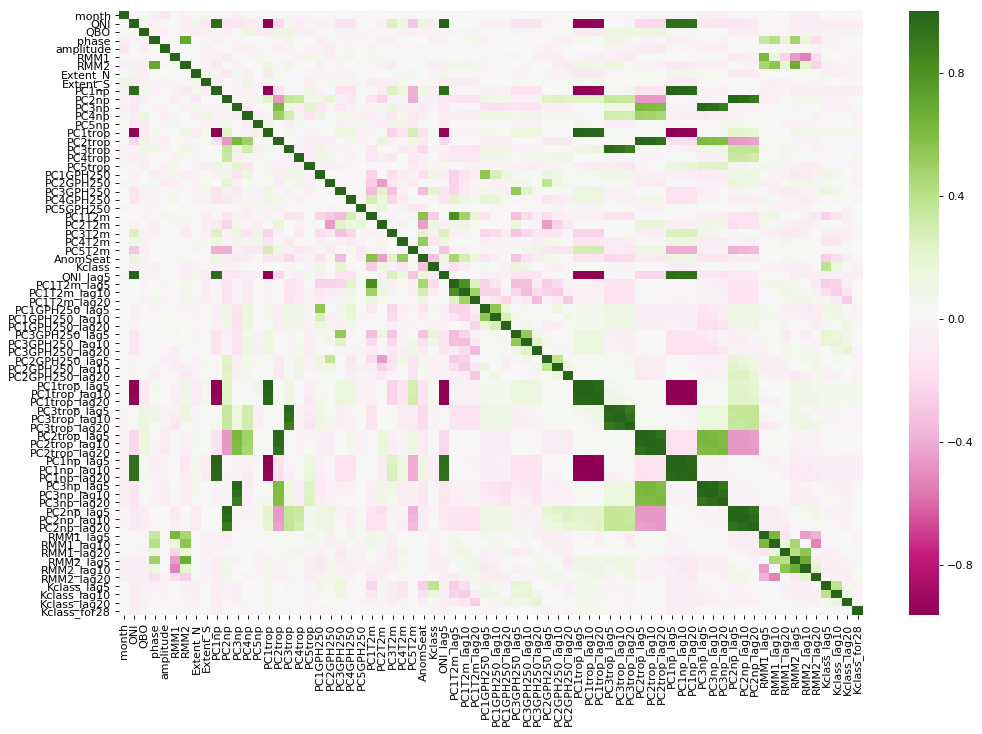

In [19]:
import seaborn as sns
plt.figure(figsize=(15,10), dpi= 80, facecolor='w', edgecolor='k')

corrA = dfBuild.corr()
sns.heatmap(corrA, 
            xticklabels=corrA.columns.values,
            yticklabels=corrA.columns.values,cmap="PiYG")

plt.show()

[[ 1.        -0.9624715]
 [-0.9624715  1.       ]]


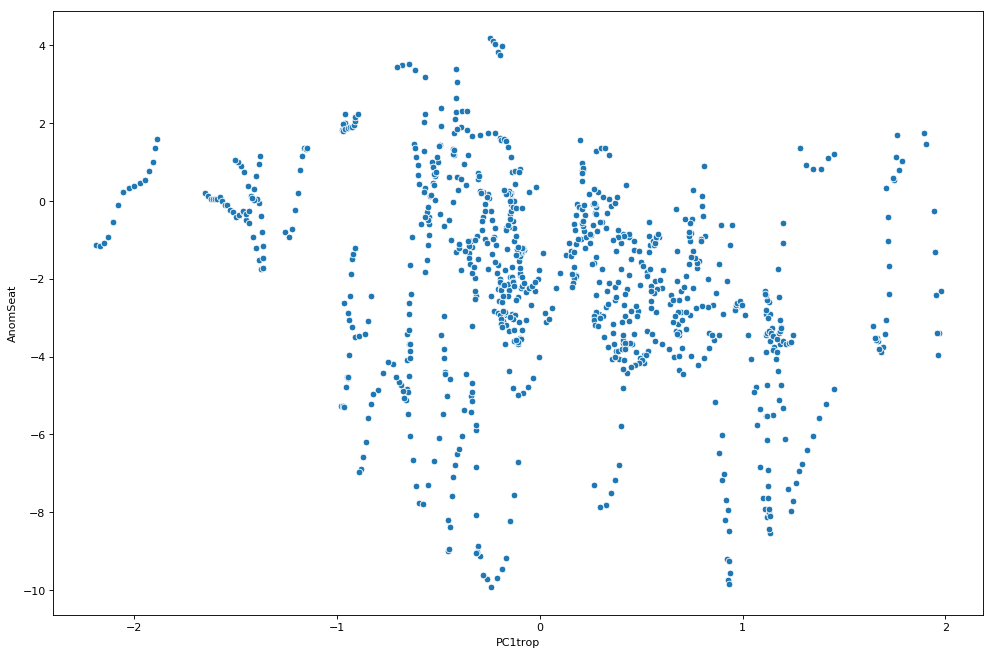

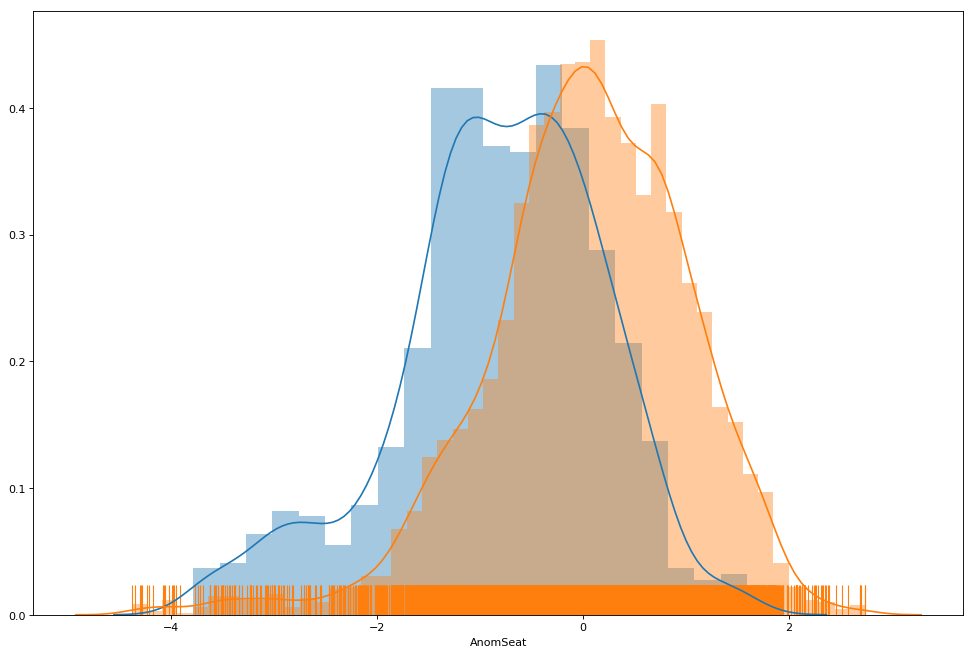

<Figure size 1200x800 with 0 Axes>

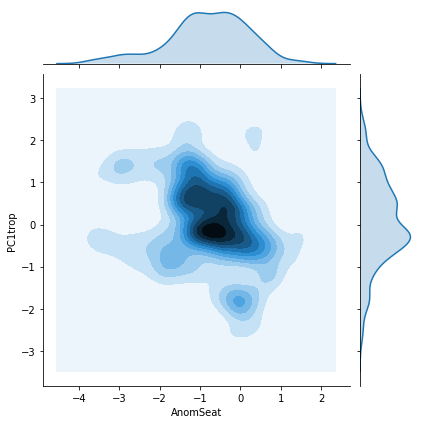

In [20]:
indicNino = np.array(dfTraining.loc[(
                        (dfALL['month'] == 1)  | 
                        (dfALL['month'] == 2)  |
                        (dfALL['month'] == 3)  |
                        (dfALL['month'] == 4))&
                        (dfALL['PC1T2m']<-1)].index.tolist())

indicWint = np.array(dfTraining.loc[(
                        (dfALL['month'] == 1)  | 
                        (dfALL['month'] == 2)  |
                        (dfALL['month'] == 3)  |
                        (dfALL['month'] == 4))].index.tolist())

plt.figure(figsize=(15,10), dpi= 80, facecolor='w', edgecolor='k')
ax = sns.scatterplot(x="PC1trop", y="AnomSeat", data=dfALL.iloc[indicNino,:])
print(np.corrcoef(dfALL.iloc[indicNino,:]['ONI'],dfALL.iloc[indicNino,:]['PC1trop']))


plt.figure(figsize=(15,10), dpi= 80, facecolor='w', edgecolor='k')
# plt.plot(dfTraining.iloc[indicWint,:]['PC1trop'])
# plt.plot(dfTraining.iloc[indicWint,:]['AnomSeat']/np.std(dfTraining.iloc[indicWint,:]['AnomSeat']))
# sns.distplot(dfTraining.iloc[indicWint,:]['PC1trop']);
sns.distplot(dfALL.iloc[indicNino,:]['AnomSeat']/np.std(dfALL.iloc[indicNino,:]['AnomSeat']));
sns.distplot(dfALL.iloc[indicWint,:]['AnomSeat']/np.std(dfALL.iloc[indicWint,:]['AnomSeat']),rug=True);


plt.show()

plt.figure(figsize=(15,10), dpi= 80, facecolor='w', edgecolor='k')
# plt.plot(dfTraining.iloc[indicWint,:]['PC1trop'])
# plt.plot(dfTraining.iloc[indicWint,:]['AnomSeat']/np.std(dfTraining.iloc[indicWint,:]['AnomSeat']))
# sns.distplot(dfTraining.iloc[indicWint,:]['PC1trop']);

sns.jointplot(x=dfALL.iloc[indicNino,:]['AnomSeat']/np.std(dfALL.iloc[indicNino,:]['AnomSeat']),
             y=dfALL.iloc[indicNino,:]['PC1trop']/np.std(dfALL.iloc[indicNino,:]['PC1trop']),
             kind="kde")

plt.show()

In [21]:
Y_val.shape

(1391, 6)

In [22]:
outfilename = '/home/wchapman/S2S/T2mENSOmjo/models/test_dense_cluster_Xentropy_lag28.h5'
train_nn(dense_model,X_train,Y_train,70,30,outfilename,X_val,Y_val)

Instructions for updating:
Use tf.cast instead.
Train on 12518 samples, validate on 1391 samples
Epoch 1/70
12518/12518 [==============================] - 83s 7ms/step - loss: 1.9598 - acc: 0.2017 - val_loss: 1.8642 - val_acc: 0.1510

Epoch 00001: val_acc improved from -inf to 0.15097, saving model to /home/wchapman/S2S/T2mENSOmjo/models/test_dense_cluster_Xentropy_lag28.h5
Epoch 2/70
12518/12518 [==============================] - 72s 6ms/step - loss: 1.7989 - acc: 0.2139 - val_loss: 1.8081 - val_acc: 0.2099

Epoch 00002: val_acc improved from 0.15097 to 0.20992, saving model to /home/wchapman/S2S/T2mENSOmjo/models/test_dense_cluster_Xentropy_lag28.h5
Epoch 3/70
12518/12518 [==============================] - 73s 6ms/step - loss: 1.7442 - acc: 0.2352 - val_loss: 1.7785 - val_acc: 0.2423

Epoch 00003: val_acc improved from 0.20992 to 0.24227, saving model to /home/wchapman/S2S/T2mENSOmjo/models/test_dense_cluster_Xentropy_lag28.h5
Epoch 4/70
12518/12518 [==============================] -

KeyboardInterrupt: 

### Predict on Model

In [27]:
thisMOD = read_keras_model('/home/wchapman/S2S/T2mENSOmjo/models/test_dense_cluster_Xentropy_lag28.h5')

In [29]:
PREDS

array([[0.22280163, 0.323873  , 0.10916833, 0.11371702, 0.18953711,
        0.04090298],
       [0.21820135, 0.3242468 , 0.11021534, 0.11632885, 0.19094709,
        0.04006056],
       [0.21023607, 0.318636  , 0.11431896, 0.11669245, 0.19762322,
        0.04249331],
       ...,
       [0.15873624, 0.09033925, 0.18899669, 0.26736027, 0.27342674,
        0.02114086],
       [0.16490328, 0.08756708, 0.17148805, 0.28516772, 0.27222034,
        0.01865357],
       [0.15882345, 0.09081297, 0.17166178, 0.2870857 , 0.27197996,
        0.01963608]], dtype=float32)

In [ ]:
# from sklearn.metrics import accuracy_score

In [28]:
PREDS = thisMOD.predict(X_test)

In [30]:
hea = keras.metrics.categorical_accuracy(Y_test, PREDS)
print(hea)

Tensor("Cast:0", shape=(366,), dtype=float32)


In [31]:
np.argmax(PREDS, axis=1)

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 3, 1, 3,
       4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3,
       3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 3, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 4, 4, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 3, 3,
       3, 3, 3, 3, 3, 3, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3,
       4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 4, 4, 4,

In [32]:
Preds_yeah=np.argmax(PREDS, axis=1)
Y_test_yeah = np.argmax(Y_test,axis=1)

In [33]:
Y_test_yeah

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 2, 2, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 4, 4, 4, 4, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3,
       3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4,
       4, 2, 2, 2, 2, 2, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4,

In [34]:
print('accuracy:',accuracy_score(Y_test_yeah, Preds_yeah))
print('num accurate:',accuracy_score(Y_test_yeah, Preds_yeah, normalize=False))

accuracy: 0.25956284153005466
num accurate: 95


## Confusion Matrix

In [35]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots(figsize=(15,10), dpi= 80, facecolor='w', edgecolor='k')
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


Confusion matrix, without normalization
[[ 0 47  0 33 10  0]
 [ 0 16  0 12 11  0]
 [ 0  0  0 20 24  0]
 [ 0 23  0 56  7  0]
 [ 0  2  0 66 23  0]
 [ 0  0  0  7  9  0]]
Normalized confusion matrix
[[0.         0.52222222 0.         0.36666667 0.11111111 0.        ]
 [0.         0.41025641 0.         0.30769231 0.28205128 0.        ]
 [0.         0.         0.         0.45454545 0.54545455 0.        ]
 [0.         0.26744186 0.         0.65116279 0.08139535 0.        ]
 [0.         0.02197802 0.         0.72527473 0.25274725 0.        ]
 [0.         0.         0.         0.4375     0.5625     0.        ]]


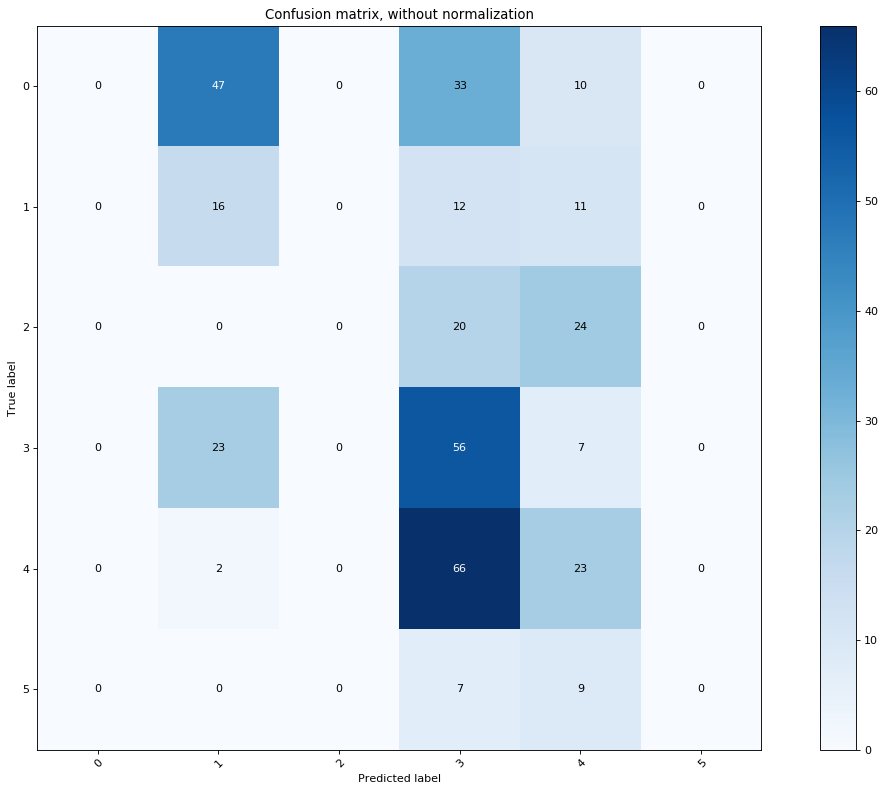

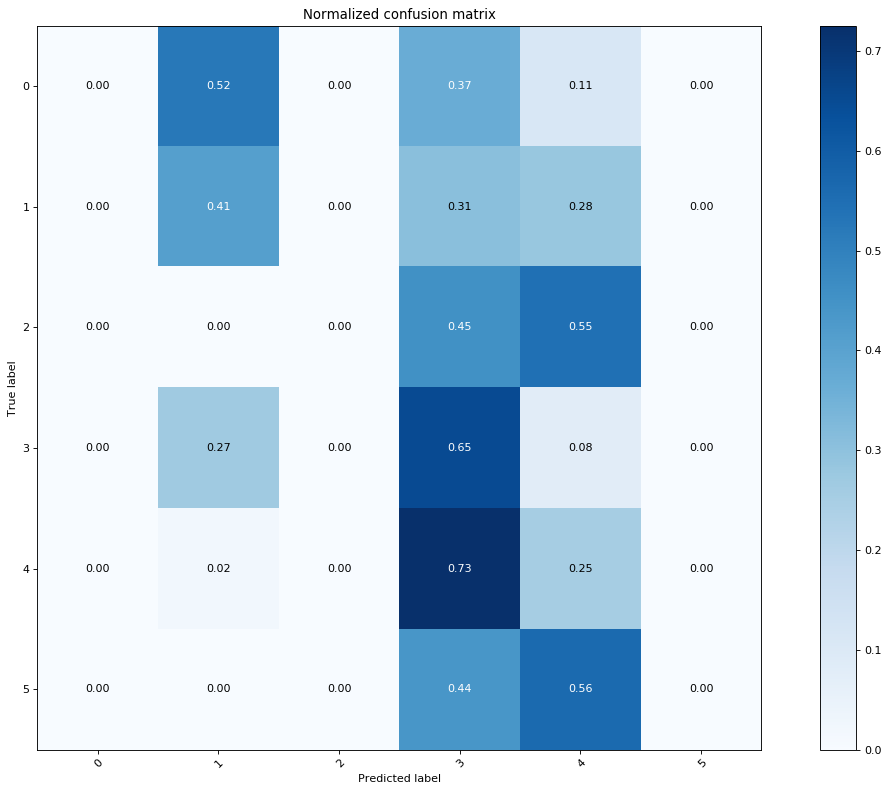

In [36]:
classes=np.array(['0','1','2','3','4','5','6','7','8','9'])
plot_confusion_matrix(Y_test_yeah, Preds_yeah, classes,normalize=False,title=None,cmap=plt.cm.Blues)

plot_confusion_matrix(Y_test_yeah, Preds_yeah, classes,
                          normalize=True,
                          title=None,
                          cmap=plt.cm.Blues)

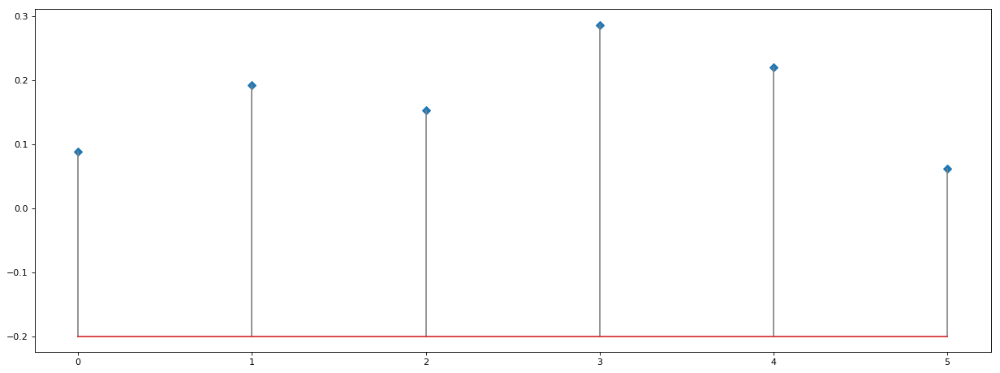

In [37]:
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
plt.stem(PREDS[75,:],linefmt='grey', markerfmt='D', bottom=-.2)
plt.show()

## COSINE SIMILARITY

In [38]:
# create prediction map:
Map_Preds = np.zeros([Preds_yeah.shape[0],latT.shape[0],lonT.shape[0]])

for ii in range(len(Preds_yeah)):
    Map_Preds[ii,:,:] = Map_Pred[Preds_yeah[ii],:,:]

Map_True=T2m_MeanAnom[dfTesting.index,:,:]


In [42]:
Cos_Vals = np.zeros((Map_True.shape[0]))
for ii in range(Map_True.shape[0]):
    r1 = np.reshape(np.squeeze(Map_Preds[ii,:,:])*Lands,(1,-1))
    r2 = np.reshape(np.squeeze(Map_True[ii,:,:])*Lands,(1,-1))
    r1 = r1[np.logical_not(np.isnan(r1))]
    r1 = np.expand_dims(r1,axis=0)
    r2 = r2[np.logical_not(np.isnan(r2))]
    r2 = np.expand_dims(r2,axis=0)
    Cos_Vals[ii] = Cos_Sim(r1,r2)

In [43]:
np.mean(Cos_Vals)

0.084513782923193

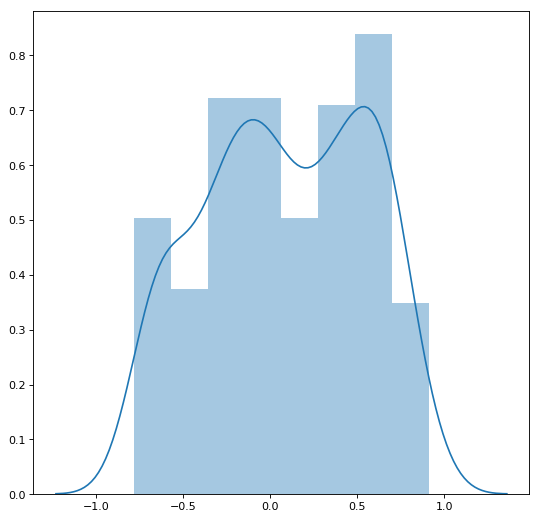

In [44]:
plt.figure(figsize=(8,8), dpi= 80, facecolor='w', edgecolor='k')
sns.distplot(Cos_Vals);
plt.show()

## KNN

In [45]:
from sklearn.neighbors import NearestNeighbors
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
from math import sqrt
import matplotlib.pyplot as plt
%matplotlib inline

In [46]:
dfTraining.head()

,month,ONI,QBO,phase,amplitude,RMM1,RMM2,Extent_N,Extent_S,PC1np,PC2np,PC3np,PC4np,PC5np,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,PC1GPH250,PC2GPH250,PC3GPH250,PC4GPH250,PC5GPH250,PC1T2m,PC2T2m,PC3T2m,PC4T2m,PC5T2m,AnomSeat,Kclass,ONI_lag5,PC1T2m_lag5,PC1T2m_lag10,PC1T2m_lag20,PC1GPH250_lag5,PC1GPH250_lag10,PC1GPH250_lag20,PC3GPH250_lag5,PC3GPH250_lag10,PC3GPH250_lag20,PC2GPH250_lag5,PC2GPH250_lag10,PC2GPH250_lag20,PC1trop_lag5,PC1trop_lag10,PC1trop_lag20,PC3trop_lag5,PC3trop_lag10,PC3trop_lag20,PC2trop_lag5,PC2trop_lag10,PC2trop_lag20,PC1np_lag5,PC1np_lag10,PC1np_lag20,PC3np_lag5,PC3np_lag10,PC3np_lag20,PC2np_lag5,PC2np_lag10,PC2np_lag20,RMM1_lag5,RMM1_lag10,RMM1_lag20,RMM2_lag5,RMM2_lag10,RMM2_lag20,Kclass_lag5,Kclass_lag10,Kclass_lag20,Kclass_for28
20,1.0,0.59,-1.2,4,0.574991,0.532838,-0.21610,-0.832181,0.190052,0.774653,0.880058,-0.594495,-0.205835,1.475124,-0.466463,-0.686130,1.342670,0.392889,0.487044,-1.620940,1.024305,0.272284,-0.953584,-0.780898,0.222627,0.973680,-1.243524,-0.244035,-0.187520,-4.680507,4,0.59,0.644010,0.248420,0.092132,-1.125563,0.897805,-1.064389,0.949497,2.561298,1.285830,-1.724105,-0.499839,0.100579,-0.478410,-0.500843,-0.512240,1.380620,1.332939,1.289919,-0.631772,-0.639818,-0.660402,0.773077,0.798579,0.850112,-0.585926,-0.584299,-0.473201,0.769769,0.724130,0.799715,-0.217340,0.917513,0.811586,-0.95670,0.256904,-0.066468,4.0,3.0,3.0,1.0
21,1.0,0.59,-1.2,4,0.576281,0.471650,-0.33113,-0.826509,0.204327,0.775825,0.909072,-0.597995,-0.220045,1.481572,-0.462803,-0.702093,1.322821,0.415455,0.459170,-2.227207,1.607401,1.045844,-1.532891,-0.637574,-0.318949,1.048304,-1.107340,-0.756771,-0.100370,-5.996138,2,0.59,0.821983,0.288678,-0.364662,-0.703034,-0.101770,-0.505258,0.827246,1.999538,1.071343,-2.203059,0.065928,0.408556,-0.475410,-0.495131,-0.513102,1.380130,1.348172,1.276688,-0.638518,-0.633846,-0.665181,0.771711,0.790610,0.846479,-0.586261,-0.585672,-0.492778,0.787623,0.726945,0.789084,-0.171840,0.622128,0.705088,-1.20886,0.060183,-0.029684,4.0,3.0,1.0,1.0
22,1.0,0.59,-1.2,4,0.876394,0.684610,-0.54715,-0.814597,0.214467,0.777932,0.941276,-0.602348,-0.232548,1.488909,-0.459109,-0.720384,1.305490,0.434585,0.430051,-1.966487,1.708945,1.261392,-1.780737,-1.799849,-0.875247,0.918425,-1.081490,-1.239095,0.028009,-7.110649,2,0.59,0.958811,0.203533,-0.662139,-0.526201,-1.396204,-0.160355,0.635612,2.450596,1.006652,-1.813484,0.072512,0.869647,-0.473399,-0.489765,-0.513509,1.376400,1.360315,1.269229,-0.647016,-0.629454,-0.667807,0.771795,0.783877,0.842329,-0.587455,-0.586080,-0.511113,0.807916,0.733054,0.777503,-0.086609,0.469703,0.662733,-1.07414,-0.160640,0.037199,4.0,2.0,1.0,1.0
23,1.0,0.59,-1.2,4,1.039210,0.847365,-0.60160,-0.794984,0.226162,0.780550,0.976062,-0.608192,-0.242477,1.496067,-0.455192,-0.741285,1.285255,0.451829,0.396636,-1.542860,1.710387,1.414914,-1.699886,-1.198213,-1.306347,0.888872,-1.120985,-1.678534,0.150582,-8.205840,2,0.59,1.022467,0.196359,-0.630979,-0.430919,-1.651990,-0.277903,-0.002824,2.679048,1.431756,-0.975393,-0.359966,1.253157,-0.471318,-0.485183,-0.513395,1.372104,1.369197,1.264381,-0.658531,-0.627091,-0.669675,0.772455,0.778855,0.837768,-0.589774,-0.585839,-0.527168,0.830500,0.742658,0.766117,0.096396,0.332460,0.614840,-0.61123,-0.208600,0.213630,4.0,2.0,1.0,1.0
24,1.0,0.59,-1.2,4,0.866851,0.813048,-0.30064,-0.772566,0.239401,0.783391,1.011746,-0.614190,-0.251612,1.503226,-0.451195,-0.763963,1.268929,0.466674,0.362761,-1.165817,1.043310,1.540310,-2.072548,1.372555,-1.675810,0.761942,-0.980235,-2.049718,0.120972,-8.996291,5,0.59,0.763468,0.409695,-0.725881,-0.617415,-1.499100,0.014535,-0.273212,1.701524,1.760734,-0.043142,-1.107282,1.170604,-0.469222,-0.481405,-0.513664,1.359387,1.376210,1.260560,-0.671400,-0.628220,-0.670141,0.773549,0.775237,0.833692,-0.591660,-0.585762,-0.540636,0.854123,0.754722,0.755282,0.506211,0.016898,0.702877,-0.35878,-0.442060,0.490769,4.0,4.0,1.0,3.0


In [47]:
accuracy_val = [] #to store rmse values for different k
for K in range(200):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K,weights='uniform')

    model.fit(X_train, Y_train)  #fit the model
    pred=model.predict(X_test) #make prediction on test set
    accs = accuracy_score(np.argmax(Y_test, axis=1), np.argmax(pred, axis=1)) #calculate rmse
    accuracy_val.append(accs) #store rmse values
    print('Accuracy value for k= ' , K , 'is:', accs)

Accuracy value for k=  1 is: 0.16939890710382513
Accuracy value for k=  2 is: 0.18579234972677597
Accuracy value for k=  3 is: 0.19672131147540983
Accuracy value for k=  4 is: 0.18032786885245902
Accuracy value for k=  5 is: 0.18032786885245902
Accuracy value for k=  6 is: 0.1885245901639344
Accuracy value for k=  7 is: 0.17486338797814208
Accuracy value for k=  8 is: 0.15846994535519127
Accuracy value for k=  9 is: 0.16393442622950818
Accuracy value for k=  10 is: 0.14207650273224043
Accuracy value for k=  11 is: 0.16939890710382513
Accuracy value for k=  12 is: 0.1557377049180328
Accuracy value for k=  13 is: 0.1557377049180328
Accuracy value for k=  14 is: 0.16939890710382513
Accuracy value for k=  15 is: 0.17486338797814208
Accuracy value for k=  16 is: 0.17759562841530055
Accuracy value for k=  17 is: 0.17759562841530055
Accuracy value for k=  18 is: 0.18032786885245902
Accuracy value for k=  19 is: 0.19398907103825136
Accuracy value for k=  20 is: 0.1912568306010929
Accuracy valu

In [48]:
K = 84
model = neighbors.KNeighborsRegressor(n_neighbors = K,weights='uniform')
model.fit(X_train, Y_train)  #fit the model
pred=model.predict(X_test) #make prediction on test set
accs = accuracy_score(np.argmax(Y_test, axis=1), np.argmax(pred, axis=1)) #calculate rmse
accuracy_val.append(accs) #store rmse values
print('Accuracy value for k= ' , K, 'is:', accs)

Accuracy value for k=  84 is: 0.27595628415300544


In [49]:
Preds_yeah=np.argmax(pred, axis=1)
Preds_yeah

array([1, 1, 1, 4, 1, 1, 1, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1,
       1, 1, 4, 4, 4, 4, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5,
       5, 5, 5, 5, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 5, 2, 1, 0, 5, 5, 3, 5, 5, 5, 5, 5, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 4, 2, 4, 4, 4, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 2, 4, 2, 2, 2, 4, 4, 4, 4, 2, 2, 4, 2, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1,
       1, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 3, 1, 3, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3,
       3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4,

In [50]:
Y_test_yeah

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 2, 2, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 4, 4, 4, 4, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3,
       3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4,
       4, 2, 2, 2, 2, 2, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4,

Confusion matrix, without normalization
[[ 4 29  1 10 46  0]
 [ 0  9 17  7  2  4]
 [ 0  0  4 20 20  0]
 [ 2 16  8 25 26  9]
 [ 0  2  7 23 59  0]
 [ 0  0  0  9  7  0]]
Normalized confusion matrix
[[0.04444444 0.32222222 0.01111111 0.11111111 0.51111111 0.        ]
 [0.         0.23076923 0.43589744 0.17948718 0.05128205 0.1025641 ]
 [0.         0.         0.09090909 0.45454545 0.45454545 0.        ]
 [0.02325581 0.18604651 0.09302326 0.29069767 0.30232558 0.10465116]
 [0.         0.02197802 0.07692308 0.25274725 0.64835165 0.        ]
 [0.         0.         0.         0.5625     0.4375     0.        ]]


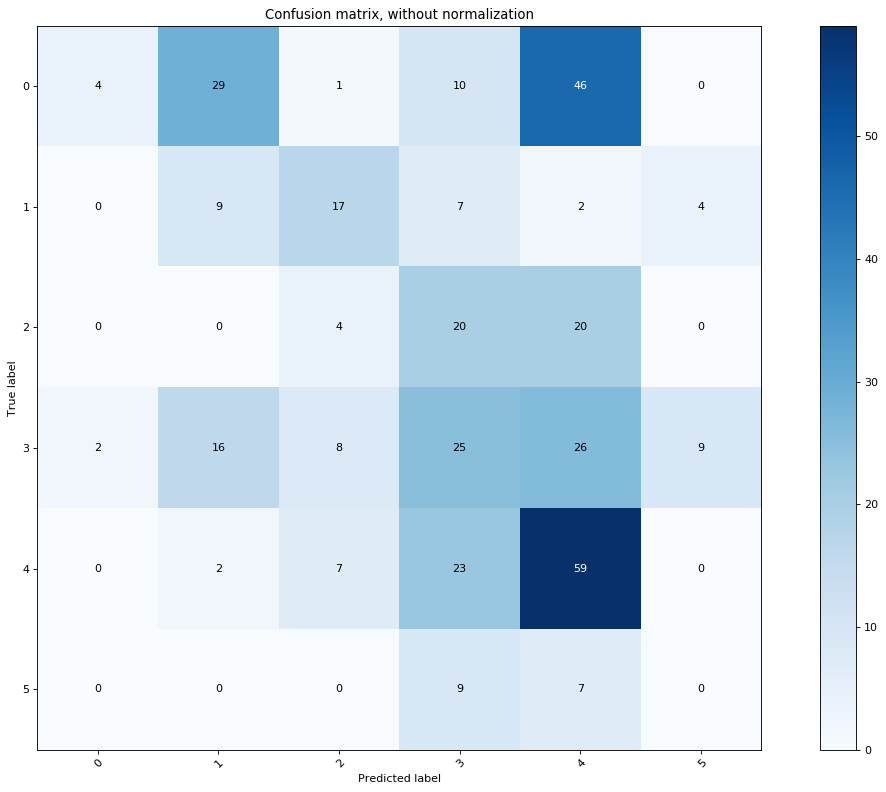

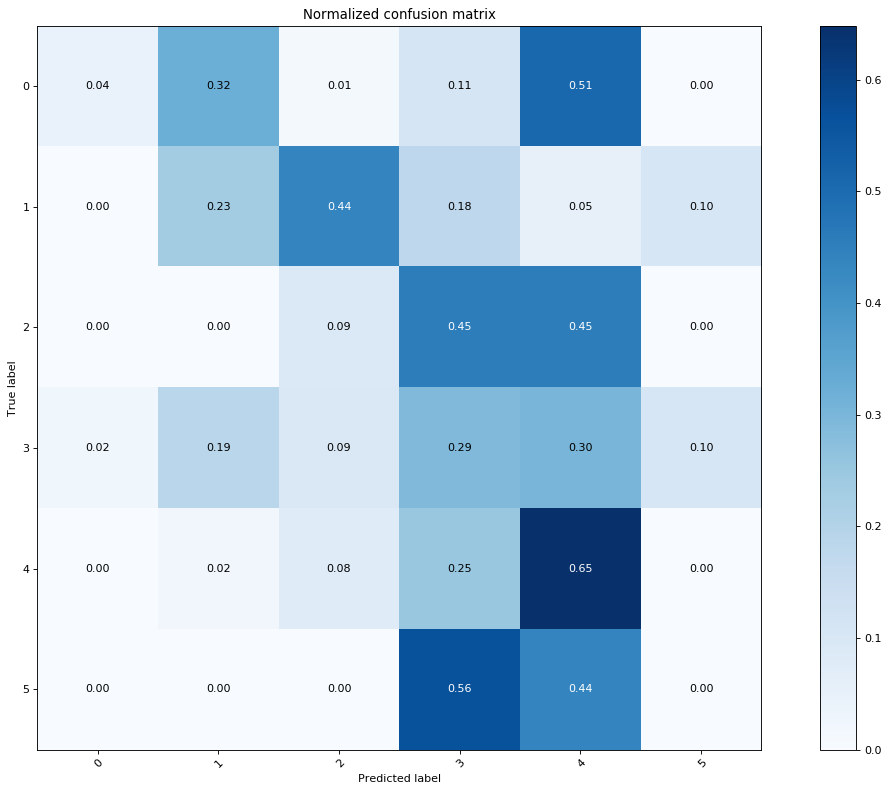

In [51]:
classes=np.array(['0','1','2','3','4','5','6','7','8'])
plot_confusion_matrix(Y_test_yeah, Preds_yeah, classes,normalize=False,title=None,cmap=plt.cm.Blues)

plot_confusion_matrix(Y_test_yeah, Preds_yeah, classes,
                          normalize=True,
                          title=None,
                          cmap=plt.cm.Blues)

## Cosine Similarity

In [52]:
# create prediction map:
Preds_yeah=np.argmax(pred, axis=1)

Map_Preds = np.zeros([Preds_yeah.shape[0],latT.shape[0],lonT.shape[0]])

for ii in range(len(Preds_yeah)):
    Map_Preds[ii,:,:] = Map_Pred[Preds_yeah[ii],:,:]

Map_True=T2m_MeanAnom[dfTesting.index,:,:]


In [53]:
Cos_Vals = np.zeros((Map_True.shape[0]))
for ii in range(Map_True.shape[0]):
    r1 = np.reshape(np.squeeze(Map_Preds[ii,:,:])*Lands,(1,-1))
    r2 = np.reshape(np.squeeze(Map_True[ii,:,:])*Lands,(1,-1))
    r1 = r1[np.logical_not(np.isnan(r1))]
    r1 = np.expand_dims(r1,axis=0)
    r2 = r2[np.logical_not(np.isnan(r2))]
    r2 = np.expand_dims(r2,axis=0)
    Cos_Vals[ii] = Cos_Sim(r1,r2)
print('Cosine Similarty for K= ' , 81 , 'is:', np.mean(Cos_Vals))
print('num accurate:',accuracy_score(Y_test_yeah, Preds_yeah, normalize=False))

Cosine Similarty for K=  81 is: 0.0031278684928283526
num accurate: 101


In [ ]:
plt.figure(figsize=(8,8), dpi= 80, facecolor='w', edgecolor='k')
sns.distplot(Cos_Vals,color="y")
plt.show()

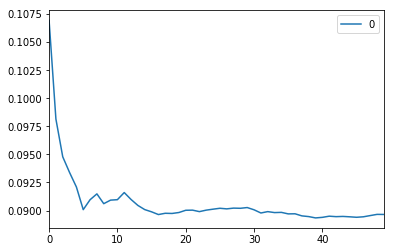

In [326]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot()

In [327]:
model = neighbors.KNeighborsRegressor(n_neighbors = 30,weights='uniform')
model.fit(X_train, Y_train)  #fit the model
predict = model.predict(X_test)
predict = (((predict+lB)/(uB-lB))*(maxY-minY))+minY


In [328]:
np.mean(Y_test)
np.mean(predict)

0.1317851321414157

/home/wchapman/.conda/envs/MJOenso/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


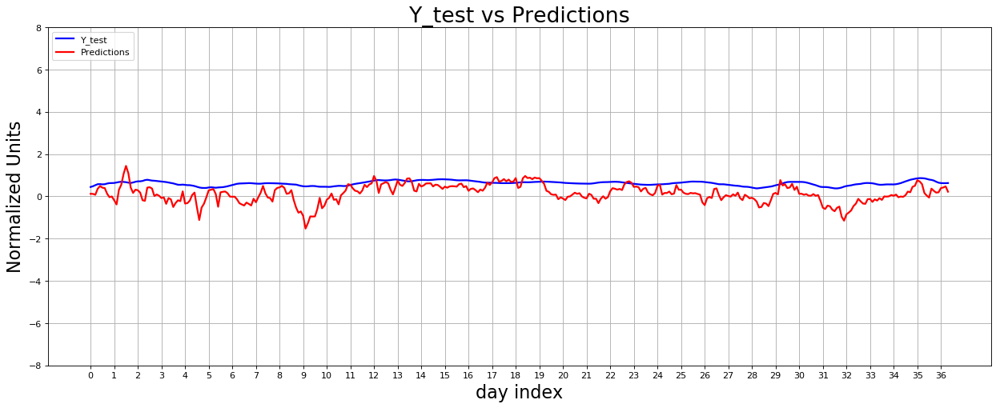

In [329]:
years =1
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')

plt.plot(range(Y_test.shape[0]), Y_test, color='b', linewidth=2)
plt.plot(range(Y_test.shape[0]), predict, color='r', linewidth=2)

ax1.set_xticks(np.arange(0,365*years,10))
ax1.set_xticklabels(range(40))
ax1.grid('on')
plt.title('Y_test vs Predictions',FontSize=24)
plt.legend(['Y_test','Predictions'], loc='upper left')
plt.ylim(-8, 8)
plt.ylabel('Normalized Units',FontSize=20)
plt.xlabel('day index',FontSize=20)
plt.show()

In [372]:
dfTesting

,model time,model time_lag1,model time_lag2,model time_lag3,year,year_lag1,year_lag2,year_lag3,month,month_lag1,month_lag2,month_lag3,day,day_lag1,day_lag2,day_lag3,ONI,ONI_lag1,ONI_lag2,ONI_lag3,phase,phase_lag1,phase_lag2,phase_lag3,amplitude,amplitude_lag1,amplitude_lag2,amplitude_lag3,RMM1,RMM1_lag1,RMM1_lag2,RMM1_lag3,RMM2,RMM2_lag1,RMM2_lag2,RMM2_lag3,Extent_N,Extent_N_lag1,Extent_N_lag2,Extent_N_lag3,Extent_S,Extent_S_lag1,Extent_S_lag2,Extent_S_lag3,PC1np,PC1np_lag1,PC1np_lag2,PC1np_lag3,PC2np,PC2np_lag1,PC2np_lag2,PC2np_lag3,PC3np,PC3np_lag1,PC3np_lag2,PC3np_lag3,PC4np,PC4np_lag1,PC4np_lag2,PC4np_lag3,PC5np,PC5np_lag1,PC5np_lag2,PC5np_lag3,PC1trop,PC1trop_lag1,PC1trop_lag2,PC1trop_lag3,PC2trop,PC2trop_lag1,PC2trop_lag2,PC2trop_lag3,PC3trop,PC3trop_lag1,PC3trop_lag2,PC3trop_lag3,PC4trop,PC4trop_lag1,PC4trop_lag2,PC4trop_lag3,PC5trop,PC5trop_lag1,PC5trop_lag2,PC5trop_lag3,PC1T2m,PC1T2m_lag1,PC1T2m_lag2,PC1T2m_lag3,PC2T2m,PC2T2m_lag1,PC2T2m_lag2,PC2T2m_lag3,PC3T2m,PC3T2m_lag1,PC3T2m_lag2,PC3T2m_lag3,PC4T2m,PC4T2m_lag1,PC4T2m_lag2,PC4T2m_lag3,PC5T2m,PC5T2m_lag1,PC5T2m_lag2,PC5T2m_lag3,AnomSeat,AnomSeat_lag1,AnomSeat_lag2,AnomSeat_lag3,AnomSeat_for30
0,17680704.0,17680680.0,17680656.0,17680632.0,2018.0,2017.0,2017.0,2017.0,1.0,12.0,12.0,12.0,1.0,31.0,30.0,29.0,-0.87,-0.97,-0.97,-0.97,2,2.0,2.0,1.0,1.655467,1.913447,1.693310,1.387735,-0.853389,-1.063015,-1.129410,-1.191245,-1.418555,-1.591000,-1.261639,-0.711859,-0.171377,-0.153371,-0.143079,-0.133713,-1.695499,-1.702749,-1.718324,-1.724364,1.047339,1.049695,1.055218,1.064470,-0.756211,-0.758215,-0.762227,-0.770756,1.071678,1.063012,1.048144,1.030160,-0.351864,-0.361575,-0.371761,-0.378410,0.755888,0.710211,0.670321,0.636300,-1.249893,-1.255551,-1.263713,-1.273787,-0.992807,-0.982058,-0.970808,-0.956832,-1.188295,-1.171737,-1.162447,-1.157690,0.084068,0.084783,0.080467,0.083317,0.097738,0.123796,0.141398,0.153653,-1.342332,-1.574793,-1.667240,-1.666181,-3.853291,-3.796596,-3.530261,-3.095068,-1.678176,-1.772965,-1.792446,-1.807068,-2.156641,-2.328215,-2.548150,-2.330202,0.232574,0.275400,0.303579,0.559648,-1.081194,-1.809228,-2.243572,-2.199437,4.177952
1,17680728.0,17680704.0,17680680.0,17680656.0,2018.0,2018.0,2017.0,2017.0,1.0,1.0,12.0,12.0,2.0,1.0,31.0,30.0,-0.87,-0.87,-0.97,-0.97,2,2.0,2.0,2.0,1.429385,1.655467,1.913447,1.693310,-0.695064,-0.853389,-1.063015,-1.129410,-1.249010,-1.418555,-1.591000,-1.261639,-0.195520,-0.171377,-0.153371,-0.143079,-1.698503,-1.695499,-1.702749,-1.718324,1.046493,1.047339,1.049695,1.055218,-0.756968,-0.756211,-0.758215,-0.762227,1.082320,1.071678,1.063012,1.048144,-0.335533,-0.351864,-0.361575,-0.371761,0.815061,0.755888,0.710211,0.670321,-1.245909,-1.249893,-1.255551,-1.263713,-1.008412,-0.992807,-0.982058,-0.970808,-1.210671,-1.188295,-1.171737,-1.162447,0.078883,0.084068,0.084783,0.080467,0.067844,0.097738,0.123796,0.141398,-1.042038,-1.342332,-1.574793,-1.667240,-3.732585,-3.853291,-3.796596,-3.530261,-1.469981,-1.678176,-1.772965,-1.792446,-2.004864,-2.156641,-2.328215,-2.548150,0.313860,0.232574,0.275400,0.303579,-0.559505,-1.081194,-1.809228,-2.243572,4.393276
2,17680752.0,17680728.0,17680704.0,17680680.0,2018.0,2018.0,2018.0,2017.0,1.0,1.0,1.0,12.0,3.0,2.0,1.0,31.0,-0.87,-0.87,-0.87,-0.97,2,2.0,2.0,2.0,1.533102,1.429385,1.655467,1.913447,-0.798001,-0.695064,-0.853389,-1.063015,-1.309044,-1.249010,-1.418555,-1.591000,-0.214003,-0.195520,-0.171377,-0.153371,-1.702685,-1.698503,-1.695499,-1.702749,1.044891,1.046493,1.047339,1.049695,-0.753521,-0.756968,-0.756211,-0.758215,1.091428,1.082320,1.071678,1.063012,-0.313878,-0.335533,-0.351864,-0.361575,0.875456,0.815061,0.755888,0.710211,-1.243305,-1.245909,-1.249893,-1.255551,-1.021611,-1.008412,-0.992807,-0.982058,-1.224175,-1.210671,-1.188295,-1.171737,0.062724,0.078883,0.084068,0.084783,0.053048,0.067844,0.097738,0.123796,-0.590362,-1.042038,-1.342332,-1.574793,-3.591442,-3.732585,-3.853291,-3.796596,-1.219204,-1.469981,-1.678176,-1.772965,-1.933724,-2.004864,-2.156641,-2.328215,0.231

In [436]:
testingyear = 2018

#now do shifting:
dfBuild = buildLaggedFeaturesBack(dfALL,lag=3,dropna=False)
dfBuild = buildLaggedFeaturesFor(dfBuild,'PC1T2m',lag=30,dropna=False)
dfBuild

#find indices of desired testing year:
indicTesting = np.array(dfBuild.loc[(dfAAA['year']==testingyear)].index.tolist())
indicTraining = np.array(dfBuild.loc[(dfAAA['year']!=testingyear)].index.tolist())


dfTraining = dfBuild.iloc[indicTraining,:]
dfTesting = dfBuild.iloc[indicTesting,:]

dfTraining = dfTraining.reset_index(drop=True)
dfTesting = dfTesting.reset_index(drop=True)


indicMonTr = np.array(dfTraining.loc[
                        (dfTraining['month'] == 10)  | 
                        (dfTraining['month'] == 11)  |
                        (dfTraining['month'] == 12)  |
                        (dfTraining['month'] == 1)  | 
                        (dfTraining['month'] == 2)  |
                        (dfTraining['month'] == 3)  |
                        (dfTraining['month'] == 4)].index.tolist())

indicMonTe = np.array(dfTesting.loc[
                        (dfTesting['month'] == 10)  | 
                        (dfTesting['month'] == 11)  |
                        (dfTesting['month'] == 12)  |
                        (dfTesting['month'] == 1)  | 
                        (dfTesting['month'] == 2)  |
                        (dfTesting['month'] == 3)  |
                        (dfTesting['month'] == 4)].index.tolist())

dfTraining = dfTraining.iloc[indicMonTr,:]
dfTesting = dfTesting.iloc[indicMonTe,:]


#find indices of desired testing year
dfTraining = dfTraining.dropna()
dfTesting = dfTesting.dropna()

X_test = dfTesting.iloc[:,24:108]
# Y_test = dfTesting.iloc[:,22:27]
Y_test = dfTesting.iloc[:,-1]


valind = np.round(X_train.shape[0]*0.1).astype(int)

X_val = dfTraining.iloc[-valind:,24:108]
# Y_val = dfTraining.iloc[-valind:,22:27]
Y_val = dfTraining.iloc[-valind:,-1]

X_train = dfTraining.iloc[0:-valind,24:108]
# Y_train = dfTraining.iloc[0:-valind,22:27]
Y_train = dfTraining.iloc[0:-valind,-1]



X_train, Y_train = shuffle(X_train,  Y_train, random_state=10)

scale = StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)
X_val = scale.transform(X_val)


#scale y between 0 and 1.
uB = 1 
lB = 0
maxY = np.max(Y_train)
minY = np.min(Y_train)
scas = (uB-lB)/(maxY-minY)
Y_train = scas * Y_train + lB - minY * scas
Y_test = scas * Y_test + lB - minY * scas
Y_val = scas * Y_val + lB - minY * scas






In [438]:
minY

-5.223296731673811

## Dense Model

In [407]:
outfilename = '/home/wchapman/S2S/T2mENSOmjo/models/test_dense_MSE.h5'
train_nn(dense_model,X_train,Y_train,90,30,outfilename,X_val,Y_val)

Train on 6856 samples, validate on 1261 samples
Epoch 1/90
6856/6856 [==============================] - 65s 9ms/step - loss: 0.0108 - val_loss: 0.0217

Epoch 00001: val_loss improved from inf to 0.02167, saving model to /home/wchapman/S2S/T2mENSOmjo/models/test_dense_MSE.h5
Epoch 2/90
6856/6856 [==============================] - 62s 9ms/step - loss: 0.0109 - val_loss: 0.0227

Epoch 00002: val_loss did not improve from 0.02167
Epoch 3/90
6856/6856 [==============================] - 65s 9ms/step - loss: 0.0106 - val_loss: 0.0257

Epoch 00003: val_loss did not improve from 0.02167
Epoch 4/90
6856/6856 [==============================] - 63s 9ms/step - loss: 0.0104 - val_loss: 0.0259

Epoch 00004: val_loss did not improve from 0.02167
Epoch 5/90
6856/6856 [==============================] - 65s 10ms/step - loss: 0.0100 - val_loss: 0.0258

Epoch 00005: val_loss did not improve from 0.02167
Epoch 6/90
6856/6856 [==============================] - 60s 9ms/step - loss: 0.0102 - val_loss: 0.0242



In [417]:
thisMOD = read_keras_model('/home/wchapman/S2S/T2mENSOmjo/models/test_dense_MSE.h5')
PREDS = thisMOD.predict(X_test)
# PREDS_g = pd.DataFrame(PREDS,columns =Y_train.columns[:])
PREDS_g = pd.DataFrame(PREDS)


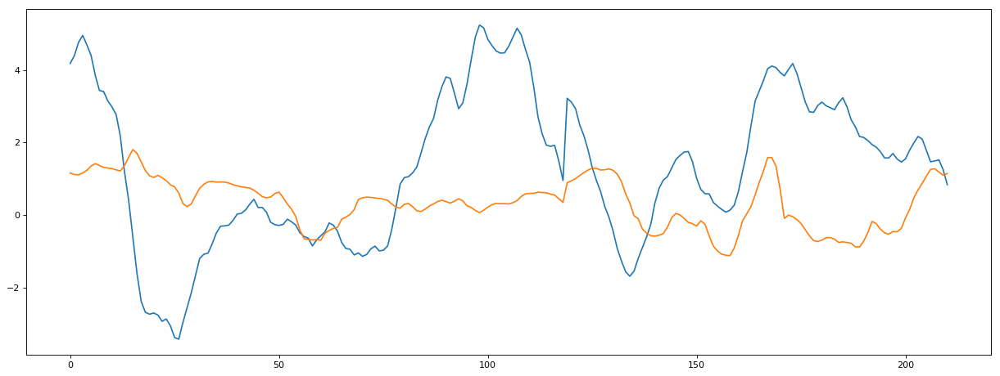

In [418]:
rescaleY = copy.deepcopy(Y_test)
rescaleY = (((rescaleY+lB)/(uB-lB))*(maxY-minY))+minY
PREDS_g = (((PREDS_g+lB)/(uB-lB))*(maxY-minY))+minY

fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(range(Y_test.shape[0]),rescaleY)
plt.plot(range(Y_test.shape[0]),PREDS_g)
plt.show()

## KNN regressor: 

In [313]:
rmse_val = [] #to store rmse values for different k
for K in range(200):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K,weights='uniform')

    model.fit(X_train, Y_train)  #fit the model
    pred=model.predict(X_test) #make prediction on test set
    error = sqrt(mean_squared_error(Y_test,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

NameError: name 'neighbors' is not defined

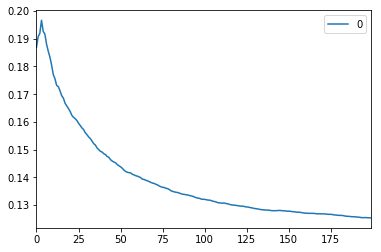

In [440]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot()

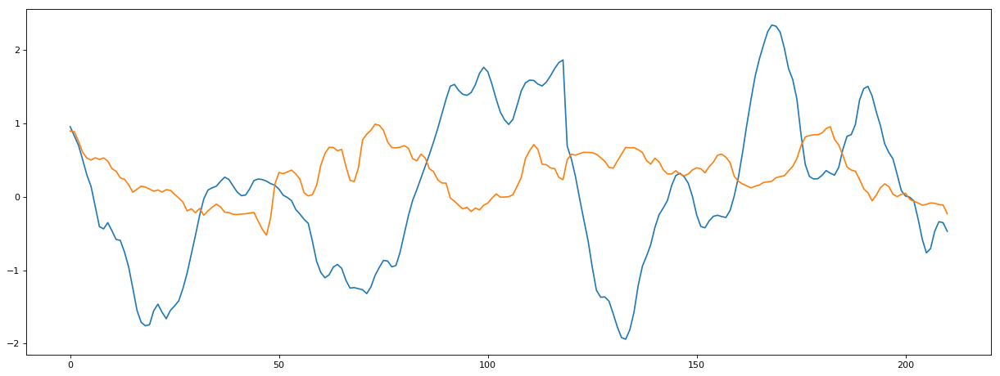

In [441]:
rescaleY = copy.deepcopy(Y_test)
rescaleY = (((rescaleY+lB)/(uB-lB))*(maxY-minY))+minY
PREDS_g = (((PREDS_g+lB)/(uB-lB))*(maxY-minY))+minY



model = neighbors.KNeighborsRegressor(n_neighbors = 100,weights='uniform')
model.fit(X_train, Y_train)  #fit the model
predict = model.predict(X_test)
predict = (((predict+lB)/(uB-lB))*(maxY-minY))+minY



fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(range(Y_test.shape[0]),rescaleY)
plt.plot(range(Y_test.shape[0]),predict)
plt.show()

## Random Forest

In [442]:
from sklearn.ensemble import RandomForestRegressor

In [443]:
maxY

3.5723082657052703

In [444]:
rf = RandomForestRegressor(n_estimators = 100, random_state = 42,verbose =1 )
rf.fit(X_train, Y_train)
preds = rf.predict(X_test)

preds = (((preds+lB)/(uB-lB))*(maxY-minY))+minY


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


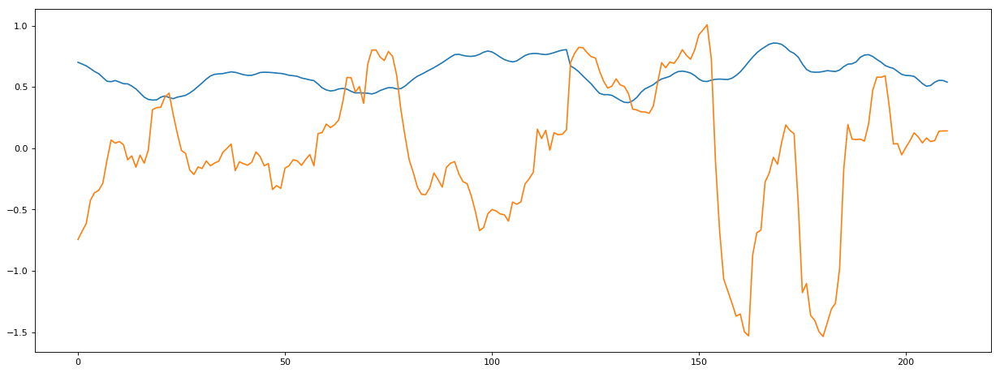

In [445]:
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(range(Y_test.shape[0]),Y_test)
plt.plot(range(Y_test.shape[0]),preds)
plt.show()

In [1210]:
dfTrain2 = buildLaggedFeaturesFor(dfTraining,'AnomSeat',lag=14,dropna=False)
dfTrain2

,index,model time,year,month,day,ONI,RMM1,RMM2,phase,amplitude,Extent_N,Extent_S,PC1np,PC2np,PC3np,PC4np,PC5np,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,PC1T2m,PC2T2m,PC3T2m,PC4T2m,PC5T2m,AnomSeat,AnomSeat_lag14
0,0,17347584.0,1980.0,1.0,1.0,0.59,0.811586,-0.066468,4,0.814303,-0.997075,-0.363800,0.878425,-0.098584,-1.444893,-1.922364,1.238112,0.499311,-0.653131,1.508341,-0.200281,0.618365,-0.040736,0.675111,-0.186887,1.064030,-1.138830,-1.176749,-4.122678
1,1,17347608.0,1980.0,1.0,2.0,0.59,0.705088,-0.029684,4,0.705712,-0.997972,-0.391125,0.864083,-0.099809,-1.448628,-1.918223,1.231707,0.500316,-0.659149,1.495193,-0.176391,0.641653,0.403900,0.725976,-0.600360,1.184793,-1.202595,-2.017464,-3.901583
2,2,17347632.0,1980.0,1.0,3.0,0.59,0.662733,0.037199,5,0.663776,-0.994661,-0.354748,0.848907,-0.101041,-1.451835,-1.913778,1.227076,0.500778,-0.662710,1.487276,-0.154042,0.667144,0.693332,0.853616,-0.922375,1.203731,-1.117590,-3.102237,-3.317971
3,3,17347656.0,1980.0,1.0,4.0,0.59,0.614840,0.213630,5,0.650896,-0.987073,-0.254732,0.833761,-0.099866,-1.456725,-1.907926,1.222787,0.500684,-0.665383,1.481806,-0.132807,0.692837,0.658070,0.696582,-1.191335,1.304384,-1.030257,-3.690021,-2.694220
4,4,17347680.0,1980.0,1.0,5.0,0.59,0.702877,0.490769,5,0.857257,-0.977570,-0.155292,0.819977,-0.096723,-1.462943,-1.898765,1.218566,0.500976,-0.666678,1.477210,-0.111614,0.719997,0.746354,0.456713,-1.429908,1.130201,-1.245513,-3.868577,-2.613443
5,5,17347704.0,1980.0,1.0,6.0,0.59,0.758704,0.604175,5,0.969876,-0.968511,-0.120637,0.807758,-0.093056,-1.472797,-1.887020,1.213260,0.500771,-0.666903,1.477187,-0.086108,0.747979,0.695184,0.675468,-1.442761,0.827913,-1.197374,-3.335602,-3.521820
6,6,17347728.0,1980.0,1.0,7.0,0.59,0.674902,0.379001,5,0.774037,-0.963229,-0.133838,0.795877,-0.087791,-1.484900,-1.872517,1.208793,0.500552,-0.665795,1.480952,-0.061680,0.776325,0.406116,0.682055,-1.433377,0.945976,-1.207501,-2.940857,-4.680507
7,7,17347752.0,1980.0,1.0,8.0,0.59,0.764337,0.197338,5,0.789400,-0.965057,-0.177961,0.784480,-0.081409,-1.499004,-1.855774,1.206179,0.501063,-0.662297,1.487889,-0.036773,0.805433,0.176985,0.660857,-1.552809,0.801665,-1.199990,-2.672594,-5.996138
8,8,17347776.0,1980.0,1.0,9.0,0.59,0.795880,0.209051,5,0.822878,-0.971081,-0.199642,0.775425,-0.072418,-1.518200,-1.835834,1.199945,0.497027,-0.654080,1.502585,-0.003813,0.836603,0.055475,0.469188,-1.771298,0.696948,-1.277424,-2.866653,-7.110649
9,9,17347800.0,1980.0,1.0,10.0,0.59,0.937358,0.256808,5,0.971901,-0.978392,-0.145509,0.767823,-0.061587,-1.536464,-1.814956,1.193622,0.492346,-0.644649,1.521267,0.030783,0.870906,-0.085111,0.329510,-1.868284,0.683448,-1.350964,-3.007063,-8.205840


In [1205]:
new2_dict={}
for col_name in s:
    new2_dict[col_name]=s[col_name]
new2_dict

{'index': 0            0
 1            1
 2            2
 3            3
 4            4
 5            5
 6            6
 7            7
 8            8
 9            9
 10          10
 11          11
 12          12
 13          13
 14          14
 15          15
 16          16
 17          17
 18          18
 19          19
 20          20
 21          21
 22          22
 23          23
 24          24
 25          25
 26          26
 27          27
 28          28
 29          29
 30          30
 31          31
 32          32
 33          33
 34          34
 35          35
 36          36
 37          37
 38          38
 39          39
 40          40
 41          41
 42          42
 43          43
 44          44
 45          45
 46          46
 47          47
 48          48
 49          49
 50          50
 51          51
 52          52
 53          53
 54          54
 55          55
 56          56
 57          57
 58          58
 59          59
 60          60
 61          61

In [1198]:
res=pd.DataFrame(new_dict,index=s.index)
res

,AnomSeat,AnomSeat_lag14
0,-1.176749,-4.122678
1,-2.017464,-3.901583
2,-3.102237,-3.317971
3,-3.690021,-2.694220
4,-3.868577,-2.613443
5,-3.335602,-3.521820
6,-2.940857,-4.680507
7,-2.672594,-5.996138
8,-2.866653,-7.110649
9,-3.007063,-8.205840


In [1144]:
dfTraining

,index,model time,year,month,day,ONI,RMM1,RMM2,phase,amplitude,Extent_N,Extent_S,PC1np,PC2np,PC3np,PC4np,PC5np,PC1trop,PC2trop,PC3trop,PC4trop,PC5trop,PC1T2m,PC2T2m,PC3T2m,PC4T2m,PC5T2m,AnomSeat
0,0,17347584.0,1980.0,1.0,1.0,0.59,0.811586,-0.066468,4,0.814303,-0.997075,-0.363800,0.878425,-0.098584,-1.444893,-1.922364,1.238112,0.499311,-0.653131,1.508341,-0.200281,0.618365,-0.040736,0.675111,-0.186887,1.064030,-1.138830,-1.176749
1,1,17347608.0,1980.0,1.0,2.0,0.59,0.705088,-0.029684,4,0.705712,-0.997972,-0.391125,0.864083,-0.099809,-1.448628,-1.918223,1.231707,0.500316,-0.659149,1.495193,-0.176391,0.641653,0.403900,0.725976,-0.600360,1.184793,-1.202595,-2.017464
2,2,17347632.0,1980.0,1.0,3.0,0.59,0.662733,0.037199,5,0.663776,-0.994661,-0.354748,0.848907,-0.101041,-1.451835,-1.913778,1.227076,0.500778,-0.662710,1.487276,-0.154042,0.667144,0.693332,0.853616,-0.922375,1.203731,-1.117590,-3.102237
3,3,17347656.0,1980.0,1.0,4.0,0.59,0.614840,0.213630,5,0.650896,-0.987073,-0.254732,0.833761,-0.099866,-1.456725,-1.907926,1.222787,0.500684,-0.665383,1.481806,-0.132807,0.692837,0.658070,0.696582,-1.191335,1.304384,-1.030257,-3.690021
4,4,17347680.0,1980.0,1.0,5.0,0.59,0.702877,0.490769,5,0.857257,-0.977570,-0.155292,0.819977,-0.096723,-1.462943,-1.898765,1.218566,0.500976,-0.666678,1.477210,-0.111614,0.719997,0.746354,0.456713,-1.429908,1.130201,-1.245513,-3.868577
5,5,17347704.0,1980.0,1.0,6.0,0.59,0.758704,0.604175,5,0.969876,-0.968511,-0.120637,0.807758,-0.093056,-1.472797,-1.887020,1.213260,0.500771,-0.666903,1.477187,-0.086108,0.747979,0.695184,0.675468,-1.442761,0.827913,-1.197374,-3.335602
6,6,17347728.0,1980.0,1.0,7.0,0.59,0.674902,0.379001,5,0.774037,-0.963229,-0.133838,0.795877,-0.087791,-1.484900,-1.872517,1.208793,0.500552,-0.665795,1.480952,-0.061680,0.776325,0.406116,0.682055,-1.433377,0.945976,-1.207501,-2.940857
7,7,17347752.0,1980.0,1.0,8.0,0.59,0.764337,0.197338,5,0.789400,-0.965057,-0.177961,0.784480,-0.081409,-1.499004,-1.855774,1.206179,0.501063,-0.662297,1.487889,-0.036773,0.805433,0.176985,0.660857,-1.552809,0.801665,-1.199990,-2.672594
8,8,17347776.0,1980.0,1.0,9.0,0.59,0.795880,0.209051,5,0.822878,-0.971081,-0.199642,0.775425,-0.072418,-1.518200,-1.835834,1.199945,0.497027,-0.654080,1.502585,-0.003813,0.836603,0.055475,0.469188,-1.771298,0.696948,-1.277424,-2.866653
9,9,17347800.0,1980.0,1.0,10.0,0.59,0.937358,0.256808,5,0.971901,-0.978392,-0.145509,0.767823,-0.061587,-1.536464,-1.814956,1.193622,0.492346,-0.644649,1.521267,0.030783,0.870906,-0.085111,0.329510,-1.868284,0.683448,-1.350964,-3.007063


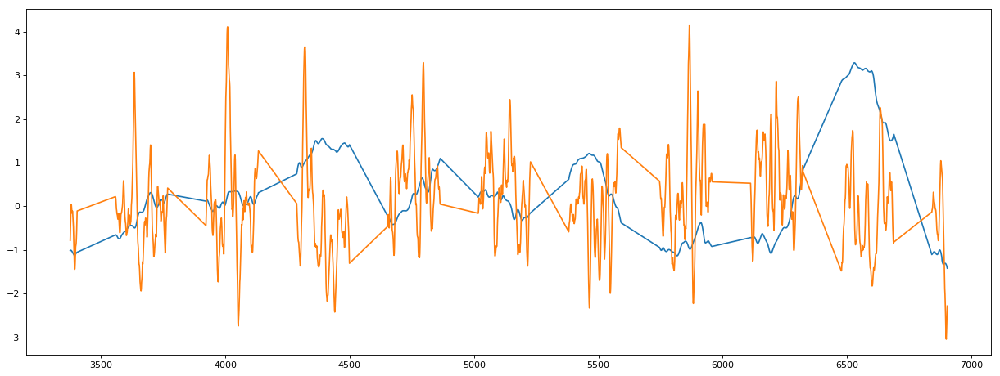

In [1247]:
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(dfTrainingWint['PC1trop'].iloc[2000:4000])
plt.plot(dfTrainingWint['PC1T2m'].iloc[2000:4000])
plt.show()

In [1]:
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
plt.plot(dfTrainingWint['AnomSeat'].iloc[2000:4000])
plt.show()

NameError: name 'plt' is not defined

## Crazy Test

In [151]:
from __future__ import print_function
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

batch_size = 128
num_classes = 10
epochs = 12

# input image dimensions
img_rows, img_cols = 28, 28

# the data, split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=input_shape))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

11493376/11490434 [==============================] - 1s 0us/step
x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Train on 60000 samples, validate on 10000 samples
Epoch 1/12
60000/60000 [==============================] - 23s 389us/step - loss: 0.2553 - acc: 0.9213 - val_loss: 0.0635 - val_acc: 0.9791
Epoch 2/12
60000/60000 [==============================] - 23s 378us/step - loss: 0.0864 - acc: 0.9746 - val_loss: 0.0410 - val_acc: 0.9857
Epoch 3/12
60000/60000 [==============================] - 21s 351us/step - loss: 0.0654 - acc: 0.9800 - val_loss: 0.0327 - val_acc: 0.9889
Epoch 4/12
60000/60000 [==============================] - 20s 341us/step - loss: 0.0524 - acc: 0.9843 - val_loss: 0.0298 - val_acc: 0.9893
Epoch 5/12
60000/6000

In [154]:
y_test[:,1]

array([0., 0., 1., ..., 0., 0., 0.], dtype=float32)

In [160]:
yo = model.predict(x_test)

array([4.64775440e-12, 2.65423637e-07, 9.99998093e-01, ...,
       1.05249885e-10, 1.03888642e-12, 6.79856726e-11], dtype=float32)

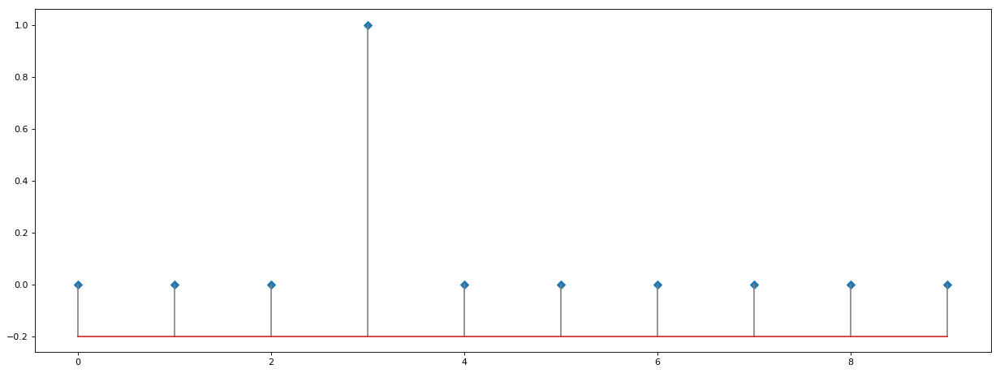

In [178]:
fig,ax1 = plt.subplots(1,1,figsize=(19,7), dpi= 80, facecolor='w', edgecolor='k')
plt.stem(yo[200,:],linefmt='grey', markerfmt='D', bottom=-.2)
plt.show()